<a href="https://colab.research.google.com/github/anggad08/DMC_ML_COURSE/blob/main/DL_PROYECTOFINAL_EQUIPO2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import files
uploaded = files.upload()



Saving CANCER.zip to CANCER.zip


Epoch 1/75
782/782 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - accuracy: 0.2617 - loss: 5.3944 - val_accuracy: 0.3465 - val_loss: 4.9847 - learning_rate: 1.0000e-04
Epoch 2/75
782/782 ━━━━━━━━━━━━━━━━━━━━ 28s 11ms/step - accuracy: 0.4319 - loss: 4.3267 - val_accuracy: 0.3581 - val_loss: 5.0660 - learning_rate: 1.0000e-04
Epoch 3/75
782/782 ━━━━━━━━━━━━━━━━━━━━ 9s 12ms/step - accuracy: 0.4922 - loss: 3.7822 - val_accuracy: 0.4478 - val_loss: 4.0250 - learning_rate: 1.0000e-04
Epoch 4/75
782/782 ━━━━━━━━━━━━━━━━━━━━ 9s 11ms/step - accuracy: 0.5438 - loss: 3.2777 - val_accuracy: 0.5094 - val_loss: 3.4437 - learning_rate: 1.0000e-04
Epoch 5/75
782/782 ━━━━━━━━━━━━━━━━━━━━ 9s 11ms/step - accuracy: 0.5865 - loss: 2.8501 - val_accuracy: 0.5559 - val_loss: 3.0342 - learning_rate: 1.0000e-04
Epoch 6/75
782/782 ━━━━━━━━━━━━━━━━━━━━ 11s 12ms/step - accuracy: 0.6260 - loss: 2.4922 - val_accuracy: 0.6418 - val_loss: 2.4036 - learning_rate: 1.0000e-04
Epoch 7/75
782/782 ━━━━━━━━━━━━━━━━━━━━ 10s 11ms/step -

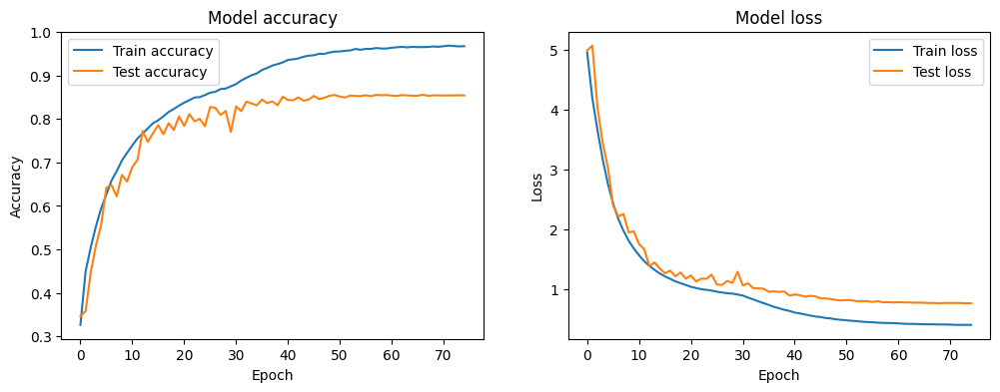

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler

# Paso 1: Cargar el dataset CIFAR-10
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

# Paso 2: Preprocesar los datos
X_train = X_train.astype('float32') / 255.0
X_test = X_test.astype('float32') / 255.0

# Convertir las etiquetas a formato categórico (one-hot encoding)
y_train = to_categorical(y_train, 10)
y_test = to_categorical(y_test, 10)

# Función para reducir la tasa de aprendizaje durante el entrenamiento
def scheduler(epoch, lr):
    if epoch < 30:
        return float(lr)  # Aseguramos que se devuelve como float
    else:
        return float(lr * tf.math.exp(-0.1))  # Reduce el learning rate exponencialmente después de 30 épocas y se devuelve como float

# Paso 3: Definir el modelo CNN mejorado
model = Sequential()

# Capa convolucional 1 con regularización L2 y dropout ajustado
model.add(Conv2D(64, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002), input_shape=(32, 32, 3)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))  # Dropout ajustado

# Capa convolucional 2 con regularización L2 y dropout ajustado
model.add(Conv2D(128, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Capa convolucional 3 con regularización L2 y dropout ajustado
model.add(Conv2D(256, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Capa convolucional adicional
model.add(Conv2D(512, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(Dropout(0.4))  # Dropout ajustado

# Aplanar la salida de las capas convolucionales
model.add(Flatten())

# Capa densa con regularización L2 y dropout ajustado
model.add(Dense(512, activation='relu', kernel_regularizer=l2(0.002)))
model.add(Dropout(0.4))  # Dropout ajustado

# Capa de salida con 10 neuronas (una por cada clase de CIFAR-10)
model.add(Dense(10, activation='softmax'))

# Paso 4: Compilar el modelo
model.compile(optimizer=Adam(learning_rate=0.0001),  # Tasa de aprendizaje más baja
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Paso 5: Implementar Early Stopping y Learning Rate Scheduler
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
lr_scheduler = LearningRateScheduler(scheduler)

# Paso 6: Entrenar el modelo con más épocas, early stopping y tasa de aprendizaje dinámica
history = model.fit(X_train, y_train, epochs=75, batch_size=64,
                    validation_data=(X_test, y_test), verbose=1,
                    callbacks=[early_stopping, lr_scheduler])

# Paso 7: Evaluar el modelo
test_loss, test_acc = model.evaluate(X_test, y_test, verbose=2)
print(f"\nTest accuracy: {test_acc}")

# Graficar los resultados
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train accuracy')
plt.plot(history.history['val_accuracy'], label='Test accuracy')
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train loss')
plt.plot(history.history['val_loss'], label='Test loss')
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()


In [ ]:
import zipfile
with zipfile.ZipFile('CANCER.zip', 'r') as zip_ref:
    zip_ref.extractall('/content/dataset')

In [ ]:
train_dir = '/content/dataset/train'
test_dir = '/content/dataset/test'


170498071/170498071 [==============================] - 6s 0us/step
Epoch 1/75
782/782 [==============================] - 22s 18ms/step - loss: 4.9597 - accuracy: 0.3321 - val_loss: 5.8009 - val_accuracy: 0.2877 - lr: 1.0000e-04
Epoch 2/75
782/782 [==============================] - 12s 15ms/step - loss: 4.2097 - accuracy: 0.4481 - val_loss: 4.7436 - val_accuracy: 0.3909 - lr: 1.0000e-04
Epoch 3/75
782/782 [==============================] - 12s 15ms/step - loss: 3.6918 - accuracy: 0.5039 - val_loss: 4.1874 - val_accuracy: 0.4528 - lr: 1.0000e-04
Epoch 4/75
782/782 [==============================] - 12s 15ms/step - loss: 3.2113 - accuracy: 0.5524 - val_loss: 3.9964 - val_accuracy: 0.4605 - lr: 1.0000e-04
Epoch 5/75
782/782 [==============================] - 12s 15ms/step - loss: 2.8133 - accuracy: 0.5888 - val_loss: 2.8813 - val_accuracy: 0.5783 - lr: 1.0000e-04
Epoch 6/75
782/782 [==============================] - 12s 15ms/step - loss: 2.4880 - accuracy: 0.6190 - val_loss: 2.8512 - val_a

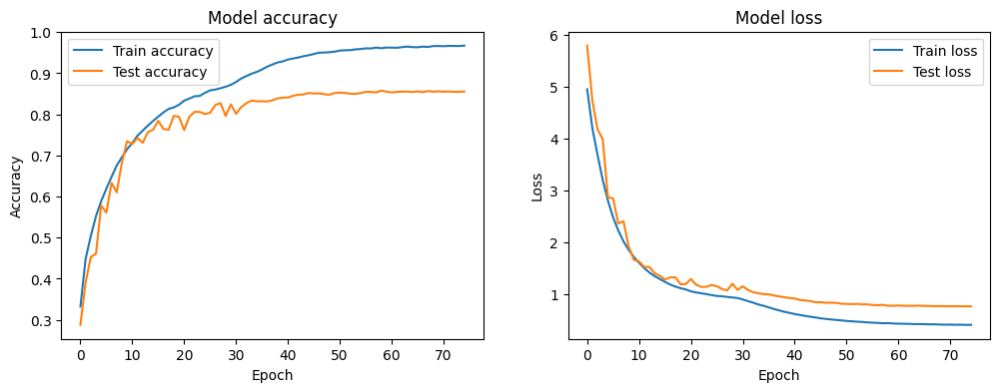

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler

# Paso 1: Cargar el dataset CIFAR-10
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

# Paso 2: Preprocesar los datos
X_train = X_train.astype('float32') / 255.0
X_test = X_test.astype('float32') / 255.0

# Convertir las etiquetas a formato categórico (one-hot encoding)
y_train = to_categorical(y_train, 10)
y_test = to_categorical(y_test, 10)

# Función para reducir la tasa de aprendizaje durante el entrenamiento
def scheduler(epoch, lr):
    if epoch < 30:
        return float(lr)  # Aseguramos que se devuelve como float
    else:
        return float(lr * tf.math.exp(-0.1))  # Reduce el learning rate exponencialmente después de 30 épocas y se devuelve como float

# Paso 3: Definir el modelo CNN mejorado
model = Sequential()

# Capa convolucional 1 con regularización L2 y dropout ajustado
model.add(Conv2D(64, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002), input_shape=(32, 32, 3)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))  # Dropout ajustado

# Capa convolucional 2 con regularización L2 y dropout ajustado
model.add(Conv2D(128, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Capa convolucional 3 con regularización L2 y dropout ajustado
model.add(Conv2D(256, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Capa convolucional adicional
model.add(Conv2D(512, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(Dropout(0.4))  # Dropout ajustado

# Aplanar la salida de las capas convolucionales
model.add(Flatten())

# Capa densa con regularización L2 y dropout ajustado
model.add(Dense(512, activation='relu', kernel_regularizer=l2(0.002)))
model.add(Dropout(0.4))  # Dropout ajustado

# Capa de salida con 10 neuronas (una por cada clase de CIFAR-10)
model.add(Dense(10, activation='softmax'))

# Paso 4: Compilar el modelo
model.compile(optimizer=Adam(learning_rate=0.0001),  # Tasa de aprendizaje más baja
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Paso 5: Implementar Early Stopping y Learning Rate Scheduler
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
lr_scheduler = LearningRateScheduler(scheduler)

# Paso 6: Entrenar el modelo con más épocas, early stopping y tasa de aprendizaje dinámica
history = model.fit(X_train, y_train, epochs=75, batch_size=64,
                    validation_data=(X_test, y_test), verbose=1,
                    callbacks=[early_stopping, lr_scheduler])

# Paso 7: Evaluar el modelo
test_loss, test_acc = model.evaluate(X_test, y_test, verbose=2)
print(f"\nTest accuracy: {test_acc}")

# Graficar los resultados
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train accuracy')
plt.plot(history.history['val_accuracy'], label='Test accuracy')
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train loss')
plt.plot(history.history['val_loss'], label='Test loss')
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()

Found 16000 images belonging to 1 classes.
Found 4000 images belonging to 1 classes.
9406464/9406464 [==============================] - 1s 0us/step
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/tensorflow/python/util/dispatch.py:1260: SyntaxWarning: In loss categorical_crossentropy, expected y_pred.shape to be (batch_size, num_classes) with num_classes > 1. Received: y_pred.shape=(None, 1). Consider using 'binary_crossentropy' if you only have 2 classes.
  return dispatch_target(*args, **kwargs)


500/500 [==============================] - 126s 245ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 2/50
500/500 [==============================] - 136s 272ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 3/50
500/500 [==============================] - 137s 274ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 4/50
500/500 [==============================] - 120s 239ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 5/50
500/500 [==============================] - 119s 239ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 6/50
500/500 [==============================] - 138s 276ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 7/50
500/500 [==============================] - 121s 243ms/step - loss: 0.0000e+0

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


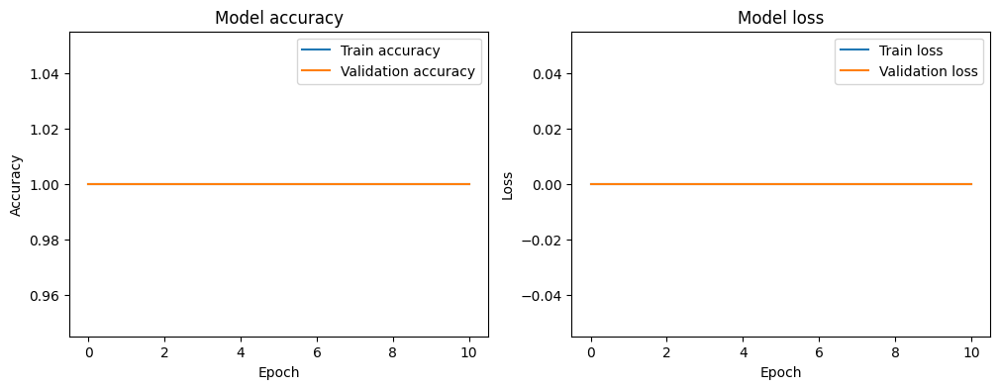

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt
import json

# Paso 1: Data Augmentation para aumentar la variabilidad de los datos
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=30,
    width_shift_range=0.3,
    height_shift_range=0.3,
    shear_range=0.3,
    zoom_range=0.3,
    horizontal_flip=True,
    vertical_flip=True,
    validation_split=0.2  # Reservar 20% de los datos para validación
)

# Paso 2: Cargar los datos de entrenamiento y validación
train_dir = '/content/dataset'  # Cambia esta ruta a la ubicación de tu dataset de imágenes de cáncer
train_generator = datagen.flow_from_directory(
    train_dir,
    target_size=(128, 128),  # Aumentamos el tamaño de las imágenes a 128x128
    batch_size=32,
    class_mode='categorical',  # Si tienes más de 2 clases, si solo tienes 2 usa 'binary'
    subset='training'
)

validation_generator = datagen.flow_from_directory(
    train_dir,
    target_size=(128, 128),  # Aumentamos el tamaño de las imágenes a 128x128
    batch_size=32,
    class_mode='categorical',
    subset='validation'
)

# Paso 3: Cargar el modelo preentrenado MobileNetV2 para Transfer Learning
base_model = tf.keras.applications.MobileNetV2(input_shape=(128, 128, 3), include_top=False, weights='imagenet')
base_model.trainable = False  # Congelamos las capas del modelo base

# Paso 4: Construir el modelo añadiendo capas personalizadas
model = Sequential([
    base_model,  # Modelo preentrenado
    Flatten(),
    Dense(64, activation='relu'),
    Dropout(0.7),  # Aumentamos el dropout para reducir el sobreajuste
    Dense(train_generator.num_classes, activation='softmax')  # Ajustar el número de clases dinámicamente
])

# Paso 5: Compilar el modelo con una tasa de aprendizaje más baja
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Paso 6: Implementar Early Stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Paso 7: Entrenar el modelo
history = model.fit(
    train_generator,
    epochs=50,  # Mantener las épocas
    validation_data=validation_generator,
    callbacks=[early_stopping],
    verbose=1
)

# Paso 8: Guardar el modelo entrenado
model.save('Cancer-CNN-TransferLearning-Model-64neurons-Dropout07.h5')

# Guardar la configuración del modelo
model_json = model.to_json()
with open("cancer_model_config.json", "w") as json_file:
    json_file.write(model_json)

# Guardar el historial del entrenamiento
with open('cancer_training_history.json', 'w') as f:
    json.dump(history.history, f)

# Paso 9: Graficar los resultados de entrenamiento
plt.figure(figsize=(12, 4))

# Gráfico de precisión
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train accuracy')
plt.plot(history.history['val_accuracy'], label='Validation accuracy')
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Gráfico de pérdida (loss)
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train loss')
plt.plot(history.history['val_loss'], label='Validation loss')
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!cp -r /content/dataset /content/drive/MyDrive/

In [ ]:
!cp -r /content/drive/MyDrive/dataset /content/


cp: cannot stat '/content/drive/MyDrive/dataset': No such file or directory


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!ls /content/drive/MyDrive/

'008.DOC (Recovered).gdoc'
'2018-12-13_20-46-18 (1).png'
'2024-04-08 13-55-53.mkv'
'2024-07-30 14-11-37.mkv'
 21_La_Oralidad_Proceso_Laboral_Vene.pdf
'2do PARCIAL DE DERECHO ROMANO.gdoc'
'36. Ley de la Procuraduria General de la Republica  - Revolucion Bolivariana - Habilitantes (1).doc'
'ANGEL GADEA.pdf'
'BPMN Guide reference OMG2006-02-01.pdf'
 CERTIFICADO_RELACIONES_EXTERIORES.pdf
 Chequeo_Pre_requisitos_WL_slopr71.doc
 Classroom
'CODIGO ORGANICO PROCESAL PENAL.pdf'
'Colab Notebooks'
'COMPARATIVO COPP 2009 2012.pdf'
 COMPETENCIAS_JCADM.xlsx
 Contratista_inherencia_conexidad.pdf
'Contratos de extranjeros_IP  (2).xlsx'
'CPS 19 y 20 de Junio2015.jpg'
'Cur-Esp-AG-v8[3] (1) (1).docx'
 dataset
'DERECHO ADMINISTRATIVO Y JURISDICCION CONTENCIOSO.docx'
'Desarrollo_Detalles (5).pdf'
 Dialnet-LaOratoriaForenseEnLaCausaPenal-3160114.pdf
 Fase_previa_y_oralidad.pdf
'Fuerza Mayor I - MONICA GUERRERO.pdf'
'GAMMES PROGRAMING.PNG'
 GCQ2006.pdf
'glosario (3).doc'
'GUIA_PROCESAL_CIVIL_II (1).docx'
'HI

In [ ]:
!cd dataset


/bin/bash: line 1: cd: dataset: No such file or directory


In [ ]:
!ls /content/drive/MyDrive/dataset/CANCER


all_benign  all_early  all_pre	all_pro


In [ ]:
!cp -r /content/drive/MyDrive/dataset /content/

170498071/170498071 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/75
782/782 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - accuracy: 0.2648 - loss: 5.3824 - val_accuracy: 0.3206 - val_loss: 5.2066 - learning_rate: 1.0000e-04
Epoch 2/75
782/782 ━━━━━━━━━━━━━━━━━━━━ 19s 12ms/step - accuracy: 0.4335 - loss: 4.3242 - val_accuracy: 0.3935 - val_loss: 4.6688 - learning_rate: 1.0000e-04
Epoch 3/75
782/782 ━━━━━━━━━━━━━━━━━━━━ 10s 12ms/step - accuracy: 0.4981 - loss: 3.7851 - val_accuracy: 0.4645 - val_loss: 3.8928 - learning_rate: 1.0000e-04
Epoch 4/75
782/782 ━━━━━━━━━━━━━━━━━━━━ 10s 12ms/step - accuracy: 0.5413 - loss: 3.2927 - val_accuracy: 0.4674 - val_loss: 3.7571 - learning_rate: 1.0000e-04
Epoch 5/75
782/782 ━━━━━━━━━━━━━━━━━━━━ 11s 13ms/step - accuracy: 0.5788 - loss: 2.8692 - val_accuracy: 0.5752 - val_loss: 2.8229 - learning_rate: 1.0000e-04
Epoch 6/75
782/782 ━━━━━━━━━━━━━━━━━━━━ 10s 12ms/step - accuracy: 0.6164 - loss: 2.5168 - val_accuracy: 0.6233 - val_loss: 2.4532 - learning_rate: 1.0000e-04
Epoch 7/75
782/782 ━━━━━━━━━━━━━━━━━━━━ 10s 13ms/ste

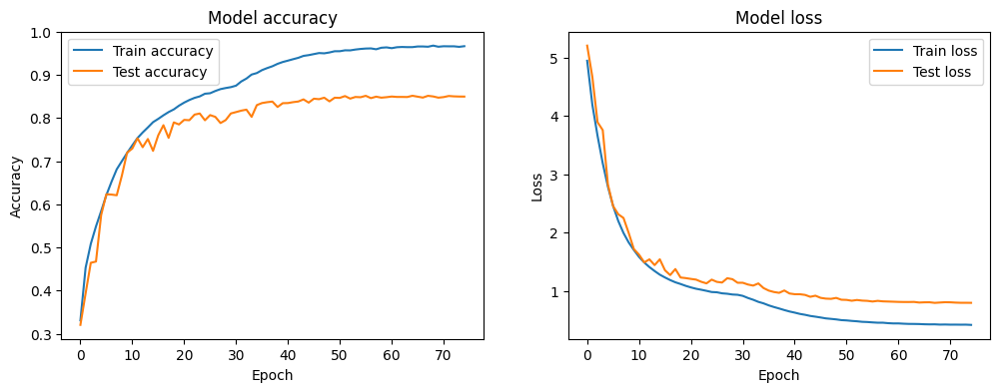

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler

# Paso 1: Cargar el dataset CIFAR-10
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

# Paso 2: Preprocesar los datos
X_train = X_train.astype('float32') / 255.0
X_test = X_test.astype('float32') / 255.0

# Convertir las etiquetas a formato categórico (one-hot encoding)
y_train = to_categorical(y_train, 10)
y_test = to_categorical(y_test, 10)

# Función para reducir la tasa de aprendizaje durante el entrenamiento
def scheduler(epoch, lr):
    if epoch < 30:
        return float(lr)  # Aseguramos que se devuelve como float
    else:
        return float(lr * tf.math.exp(-0.1))  # Reduce el learning rate exponencialmente después de 30 épocas y se devuelve como float

# Paso 3: Definir el modelo CNN mejorado
model = Sequential()

# Capa convolucional 1 con regularización L2 y dropout ajustado
model.add(Conv2D(64, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002), input_shape=(32, 32, 3)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))  # Dropout ajustado

# Capa convolucional 2 con regularización L2 y dropout ajustado
model.add(Conv2D(128, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Capa convolucional 3 con regularización L2 y dropout ajustado
model.add(Conv2D(256, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Capa convolucional adicional
model.add(Conv2D(512, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(Dropout(0.4))  # Dropout ajustado

# Aplanar la salida de las capas convolucionales
model.add(Flatten())

# Capa densa con regularización L2 y dropout ajustado
model.add(Dense(512, activation='relu', kernel_regularizer=l2(0.002)))
model.add(Dropout(0.4))  # Dropout ajustado

# Capa de salida con 10 neuronas (una por cada clase de CIFAR-10)
model.add(Dense(10, activation='softmax'))

# Paso 4: Compilar el modelo
model.compile(optimizer=Adam(learning_rate=0.0001),  # Tasa de aprendizaje más baja
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Paso 5: Implementar Early Stopping y Learning Rate Scheduler
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
lr_scheduler = LearningRateScheduler(scheduler)

# Paso 6: Entrenar el modelo con más épocas, early stopping y tasa de aprendizaje dinámica
history = model.fit(X_train, y_train, epochs=75, batch_size=64,
                    validation_data=(X_test, y_test), verbose=1,
                    callbacks=[early_stopping, lr_scheduler])

# Paso 7: Evaluar el modelo
test_loss, test_acc = model.evaluate(X_test, y_test, verbose=2)
print(f"\nTest accuracy: {test_acc}")

# Graficar los resultados
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train accuracy')
plt.plot(history.history['val_accuracy'], label='Test accuracy')
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train loss')
plt.plot(history.history['val_loss'], label='Test loss')
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()

Epoch 1/75


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


782/782 ━━━━━━━━━━━━━━━━━━━━ 64s 70ms/step - accuracy: 0.2442 - loss: 5.4618 - val_accuracy: 0.3492 - val_loss: 5.0191 - learning_rate: 1.0000e-04
Epoch 2/75
782/782 ━━━━━━━━━━━━━━━━━━━━ 43s 55ms/step - accuracy: 0.3938 - loss: 4.4201 - val_accuracy: 0.3860 - val_loss: 5.0542 - learning_rate: 1.0000e-04
Epoch 3/75
782/782 ━━━━━━━━━━━━━━━━━━━━ 44s 55ms/step - accuracy: 0.4580 - loss: 3.8704 - val_accuracy: 0.4190 - val_loss: 4.3493 - learning_rate: 1.0000e-04
Epoch 4/75
782/782 ━━━━━━━━━━━━━━━━━━━━ 85s 59ms/step - accuracy: 0.4892 - loss: 3.4032 - val_accuracy: 0.4683 - val_loss: 3.7518 - learning_rate: 1.0000e-04
Epoch 5/75
782/782 ━━━━━━━━━━━━━━━━━━━━ 79s 55ms/step - accuracy: 0.5182 - loss: 2.9831 - val_accuracy: 0.4726 - val_loss: 3.4550 - learning_rate: 1.0000e-04
Epoch 6/75
782/782 ━━━━━━━━━━━━━━━━━━━━ 81s 54ms/step - accuracy: 0.5482 - loss: 2.6421 - val_accuracy: 0.4857 - val_loss: 3.2355 - learning_rate: 1.0000e-04
Epoch 7/75
782/782 ━━━━━━━━━━━━━━━━━━━━ 85s 58ms/step - accurac

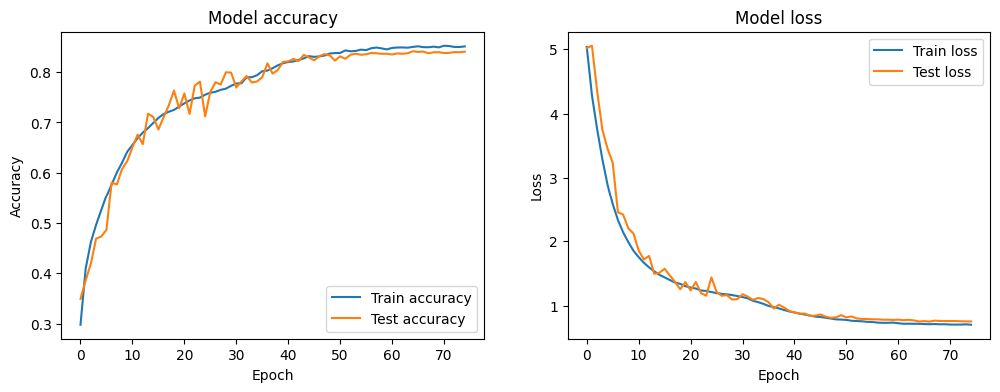

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler
from tensorflow.keras.preprocessing.image import ImageDataGenerator  # Nueva importación

# Paso 1: Cargar el dataset CIFAR-10
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

# Paso 2: Preprocesar los datos
X_train = X_train.astype('float32') / 255.0
X_test = X_test.astype('float32') / 255.0

# Convertir las etiquetas a formato categórico (one-hot encoding)
y_train = to_categorical(y_train, 10)
y_test = to_categorical(y_test, 10)

# Aumento de datos
datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True
)

# Ajustar el generador de imágenes a los datos de entrenamiento
datagen.fit(X_train)

# Función para reducir la tasa de aprendizaje durante el entrenamiento
def scheduler(epoch, lr):
    if epoch < 30:
        return float(lr)
    else:
        return float(lr * tf.math.exp(-0.1))

# Paso 3: Definir el modelo CNN mejorado
model = Sequential()

model.add(Conv2D(64, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002), input_shape=(32, 32, 3)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

model.add(Conv2D(128, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

model.add(Conv2D(256, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

model.add(Conv2D(512, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(Dropout(0.4))

model.add(Flatten())

model.add(Dense(512, activation='relu', kernel_regularizer=l2(0.002)))
model.add(Dropout(0.4))

model.add(Dense(10, activation='softmax'))

# Paso 4: Compilar el modelo
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Paso 5: Implementar Early Stopping y Learning Rate Scheduler
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
lr_scheduler = LearningRateScheduler(scheduler)

# Paso 6: Entrenar el modelo con aumento de datos
history = model.fit(datagen.flow(X_train, y_train, batch_size=64),
                              epochs=75,
                              validation_data=(X_test, y_test),
                              verbose=1,
                              callbacks=[early_stopping, lr_scheduler])

# Paso 7: Evaluar el modelo
test_loss, test_acc = model.evaluate(X_test, y_test, verbose=2)
print(f"\nTest accuracy: {test_acc}")

# Graficar los resultados
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train accuracy')
plt.plot(history.history['val_accuracy'], label='Test accuracy')
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train loss')
plt.plot(history.history['val_loss'], label='Test loss')
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()


94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/75
782/782 ━━━━━━━━━━━━━━━━━━━━ 68s 72ms/step - accuracy: 0.1468 - loss: 2.4102 - val_accuracy: 0.2845 - val_loss: 2.0654 - learning_rate: 1.0000e-04
Epoch 2/75
782/782 ━━━━━━━━━━━━━━━━━━━━ 63s 54ms/step - accuracy: 0.2325 - loss: 2.0994 - val_accuracy: 0.2869 - val_loss: 1.9874 - learning_rate: 1.0000e-04
Epoch 3/75
782/782 ━━━━━━━━━━━━━━━━━━━━ 81s 53ms/step - accuracy: 0.2575 - loss: 2.0411 - val_accuracy: 0.3023 - val_loss: 1.9413 - learning_rate: 1.0000e-04
Epoch 4/75
782/782 ━━━━━━━━━━━━━━━━━━━━ 41s 52ms/step - accuracy: 0.2680 - loss: 2.0020 - val_accuracy: 0.3118 - val_loss: 1.9118 - learning_rate: 1.0000e-04
Epoch 5/75
782/782 ━━━━━━━━━━━━━━━━━━━━ 83s 54ms/step - accuracy: 0.2874 - loss: 1.9679 - val_accuracy: 0.3298 - val_loss: 1.8773 - learning_rate: 1.0000e-04
Epoch 6/75
782/782 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step - accuracy: 0.2939 - loss: 1.9499 - val_accuracy: 0.3471 - val_loss: 1.8563 - learning_rate: 1.0000e-04
E


Test accuracy: 0.41780000925064087
Modelo guardado exitosamente como 'modelo_transfer_learning.h5'


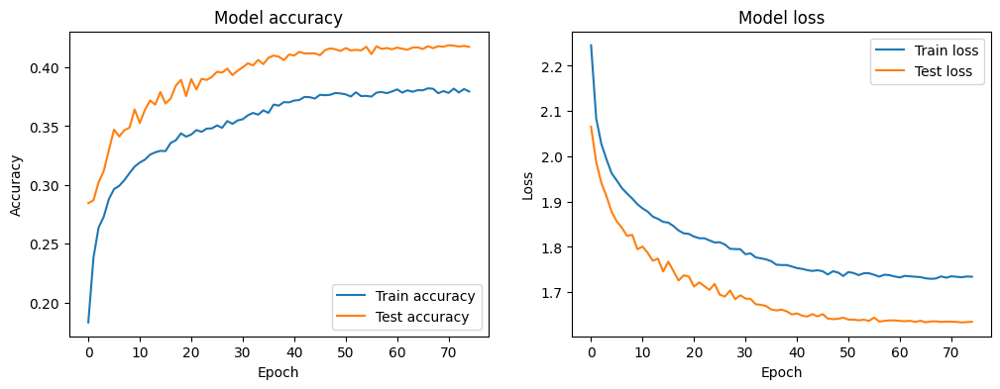

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler
from tensorflow.keras.preprocessing.image import ImageDataGenerator  # Nueva importación
from tensorflow.keras.applications import ResNet50  # Importar modelo preentrenado

# Paso 1: Cargar el dataset CIFAR-10
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

# Paso 2: Preprocesar los datos
X_train = X_train.astype('float32') / 255.0
X_test = X_test.astype('float32') / 255.0

# Convertir las etiquetas a formato categórico (one-hot encoding)
y_train = to_categorical(y_train, 10)
y_test = to_categorical(y_test, 10)

# Aumento de datos
datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True
)

# Ajustar el generador de imágenes a los datos de entrenamiento
datagen.fit(X_train)

# Función para reducir la tasa de aprendizaje durante el entrenamiento
def scheduler(epoch, lr):
    if epoch < 30:
        return float(lr)
    else:
        return float(lr * tf.math.exp(-0.1))

# Paso 3: Definir el modelo con Transfer Learning usando ResNet50
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(32, 32, 3))

# Congelar las capas del modelo base
for layer in base_model.layers:
    layer.trainable = False

# Crear el modelo completo
model = Sequential([
    base_model,  # Usamos ResNet50 como base
    GlobalAveragePooling2D(),  # Agregamos una capa de pooling global
    Dense(512, activation='relu'),  # Agregamos una capa densa
    Dropout(0.4),  # Agregamos Dropout para evitar el sobreajuste
    Dense(10, activation='softmax')  # Capa de salida con 10 clases (CIFAR-10)
])

# Paso 4: Compilar el modelo
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Paso 5: Implementar Early Stopping y Learning Rate Scheduler
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
lr_scheduler = LearningRateScheduler(scheduler)

# Paso 6: Entrenar el modelo con aumento de datos y Transfer Learning
history = model.fit(datagen.flow(X_train, y_train, batch_size=64),
                    epochs=75,
                    validation_data=(X_test, y_test),
                    verbose=1,
                    callbacks=[early_stopping, lr_scheduler])

# Paso 7: Evaluar el modelo
test_loss, test_acc = model.evaluate(X_test, y_test, verbose=2)
print(f"\nTest accuracy: {test_acc}")

# Paso 8: Guardar el modelo completo en formato H5 (arquitectura, pesos, optimizador)
model.save('modelo_transfer_learning.h5')

print("Modelo guardado exitosamente como 'modelo_transfer_learning.h5'")

# Graficar los resultados
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train accuracy')
plt.plot(history.history['val_accuracy'], label='Test accuracy')
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train loss')
plt.plot(history.history['val_loss'], label='Test loss')
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()


EL ANTERIOR ENTRENAMIENTO UTILIZO IMAGENES DE OBJETOS UTILIZANDO TRANFERLEARNING POR LO QUE NO FUNICONO.



In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.datasets import cifar10  # Reemplazar por tu dataset si es necesario
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.regularizers import l2

# Paso 1: Cargar el dataset CIFAR-10 (reemplazar con tus datos si es necesario)
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

# Paso 2: Preprocesar los datos
X_train = X_train.astype('float32') / 255.0
X_test = X_test.astype('float32') / 255.0

# Convertir las etiquetas a formato categórico (one-hot encoding)
y_train = to_categorical(y_train, 10)  # Cambia '10' por el número de clases de tu dataset
y_test = to_categorical(y_test, 10)

# Aumento de datos más agresivo
datagen = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True,
    zoom_range=0.2,
    shear_range=0.2
)

# Ajustar el generador de imágenes a los datos de entrenamiento
datagen.fit(X_train)

# Función para reducir la tasa de aprendizaje durante el entrenamiento
def scheduler(epoch, lr):
    if epoch < 30:
        return lr
    else:
        return lr * tf.math.exp(-0.1)

# Paso 3: Definir el modelo CNN mejorado
model = Sequential()

# Primer bloque de capas convolucionales
model.add(Conv2D(64, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002), input_shape=(32, 32, 3)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.5))

# Segundo bloque de capas convolucionales
model.add(Conv2D(128, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.5))

# Tercer bloque de capas convolucionales
model.add(Conv2D(256, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.5))

# Cuarto bloque de capas convolucionales
model.add(Conv2D(512, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(Dropout(0.5))

# Aplanar la salida de las capas convolucionales
model.add(Flatten())

# Capas densas finales
model.add(Dense(512, activation='relu', kernel_regularizer=l2(0.002)))
model.add(Dropout(0.5))

model.add(Dense(10, activation='softmax'))  # Cambia '10' por el número de clases de tu dataset

# Paso 4: Compilar el modelo
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Paso 5: Implementar Early Stopping y Learning Rate Scheduler
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
lr_scheduler = LearningRateScheduler(scheduler)

# Paso 6: Entrenar el modelo con aumento de datos
history = model.fit(datagen.flow(X_train, y_train, batch_size=64),
                    epochs=100,
                    validation_data=(X_test, y_test),
                    verbose=1,
                    callbacks=[early_stopping, lr_scheduler])

# Paso 7: Evaluar el modelo
test_loss, test_acc = model.evaluate(X_test, y_test, verbose=2)
print(f"\nTest accuracy: {test_acc}")

# Graficar los resultados
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train accuracy')
plt.plot(history.history['val_accuracy'], label='Test accuracy')
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train loss')
plt.plot(history.history['val_loss'], label='Test loss')
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.datasets import cifar10  # Reemplazar por tu dataset si es necesario
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.regularizers import l2

# Paso 1: Cargar el dataset CIFAR-10 (reemplazar con tus datos si es necesario)
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

# Paso 2: Preprocesar los datos
X_train = X_train.astype('float32') / 255.0
X_test = X_test.astype('float32') / 255.0

# Convertir las etiquetas a formato categórico (one-hot encoding)
y_train = to_categorical(y_train, 10)  # Cambia '10' por el número de clases de tu dataset
y_test = to_categorical(y_test, 10)

# Aumento de datos más agresivo
datagen = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True,
    zoom_range=0.2,
    shear_range=0.2
)

# Ajustar el generador de imágenes a los datos de entrenamiento
datagen.fit(X_train)

# Función para reducir la tasa de aprendizaje durante el entrenamiento
def scheduler(epoch, lr):
    if epoch < 30:
        return lr
    else:
        return lr * tf.math.exp(-0.1)

# Paso 3: Definir el modelo CNN mejorado
model = Sequential()

# Primer bloque de capas convolucionales
model.add(Conv2D(64, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002), input_shape=(32, 32, 3)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.5))

# Segundo bloque de capas convolucionales
model.add(Conv2D(128, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.5))

# Tercer bloque de capas convolucionales
model.add(Conv2D(256, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.5))

# Cuarto bloque de capas convolucionales
model.add(Conv2D(512, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(Dropout(0.5))

# Aplanar la salida de las capas convolucionales
model.add(Flatten())

# Capas densas finales
model.add(Dense(512, activation='relu', kernel_regularizer=l2(0.002)))
model.add(Dropout(0.5))

model.add(Dense(10, activation='softmax'))  # Cambia '10' por el número de clases de tu dataset

# Paso 4: Compilar el modelo
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Paso 5: Implementar Early Stopping y Learning Rate Scheduler
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
lr_scheduler = LearningRateScheduler(scheduler)

# Paso 6: Entrenar el modelo con aumento de datos
history = model.fit(datagen.flow(X_train, y_train, batch_size=64),
                    epochs=100,
                    validation_data=(X_test, y_test),
                    verbose=1,
                    callbacks=[early_stopping, lr_scheduler])

# Paso 7: Evaluar el modelo
test_loss, test_acc = model.evaluate(X_test, y_test, verbose=2)
print(f"\nTest accuracy: {test_acc}")

# Guardar el modelo completo al final del entrenamiento
model.save('modelo_mejorado.h5')

print("Modelo guardado exitosamente como 'modelo_mejorado.h5'")

# Graficar los resultados
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train accuracy')
plt.plot(history.history['val_accuracy'], label='Test accuracy')
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train loss')
plt.plot(history.history['val_loss'], label='Test loss')
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
782/782 ━━━━━━━━━━━━━━━━━━━━ 64s 69ms/step - accuracy: 0.1804 - loss: 5.8793 - val_accuracy: 0.2276 - val_loss: 5.5450 - learning_rate: 1.0000e-04
Epoch 2/100
782/782 ━━━━━━━━━━━━━━━━━━━━ 68s 60ms/step - accuracy: 0.2662 - loss: 4.8078 - val_accuracy: 0.3206 - val_loss: 4.8910 - learning_rate: 1.0000e-04
Epoch 3/100
782/782 ━━━━━━━━━━━━━━━━━━━━ 81s 59ms/step - accuracy: 0.3271 - loss: 4.2971 - val_accuracy: 0.2573 - val_loss: 5.9114 - learning_rate: 1.0000e-04
Epoch 4/100
782/782 ━━━━━━━━━━━━━━━━━━━━ 87s 64ms/step - accuracy: 0.3569 - loss: 3.8432 - val_accuracy: 0.2680 - val_loss: 5.8353 - learning_rate: 1.0000e-04
Epoch 5/100
782/782 ━━━━━━━━━━━━━━━━━━━━ 46s 59ms/step - accuracy: 0.3829 - loss: 3.4094 - val_accuracy: 0.2335 - val_loss: 5.6190 - learning_rate: 1.0000e-04
Epoch 6/100
782/782 ━━━━━━━━━━━━━━━━━━━━ 45s 58ms/step - accuracy: 0.4073 - loss: 3.0483 - val_accuracy: 0.2475 - val_loss: 5.1014 - learning_rate: 1.0000e-04
Epoch 7/100
782/782 ━━━━━━━━━━━━━━━━━━━━ 48s 6

ValueError: The output of the `schedule` function should be a float. Got: 9.048373613040894e-05

Epoch 1/100
782/782 ━━━━━━━━━━━━━━━━━━━━ 60s 66ms/step - accuracy: 0.1764 - loss: 5.8907 - val_accuracy: 0.1922 - val_loss: 5.7986 - learning_rate: 1.0000e-04
Epoch 2/100
782/782 ━━━━━━━━━━━━━━━━━━━━ 71s 58ms/step - accuracy: 0.2625 - loss: 4.8108 - val_accuracy: 0.3209 - val_loss: 4.8001 - learning_rate: 1.0000e-04
Epoch 3/100
782/782 ━━━━━━━━━━━━━━━━━━━━ 43s 55ms/step - accuracy: 0.3185 - loss: 4.3033 - val_accuracy: 0.3069 - val_loss: 4.8979 - learning_rate: 1.0000e-04
Epoch 4/100
782/782 ━━━━━━━━━━━━━━━━━━━━ 44s 55ms/step - accuracy: 0.3519 - loss: 3.8145 - val_accuracy: 0.2805 - val_loss: 5.1158 - learning_rate: 1.0000e-04
Epoch 5/100
782/782 ━━━━━━━━━━━━━━━━━━━━ 45s 57ms/step - accuracy: 0.3751 - loss: 3.3859 - val_accuracy: 0.3087 - val_loss: 4.6339 - learning_rate: 1.0000e-04
Epoch 6/100
782/782 ━━━━━━━━━━━━━━━━━━━━ 80s 55ms/step - accuracy: 0.4036 - loss: 3.0105 - val_accuracy: 0.2937 - val_loss: 4.7821 - learning_rate: 1.0000e-04
Epoch 7/100
782/782 ━━━━━━━━━━━━━━━━━━━━ 85s 5


Test accuracy: 0.7023000121116638
Modelo guardado exitosamente como 'modelo_mejorado.h5'


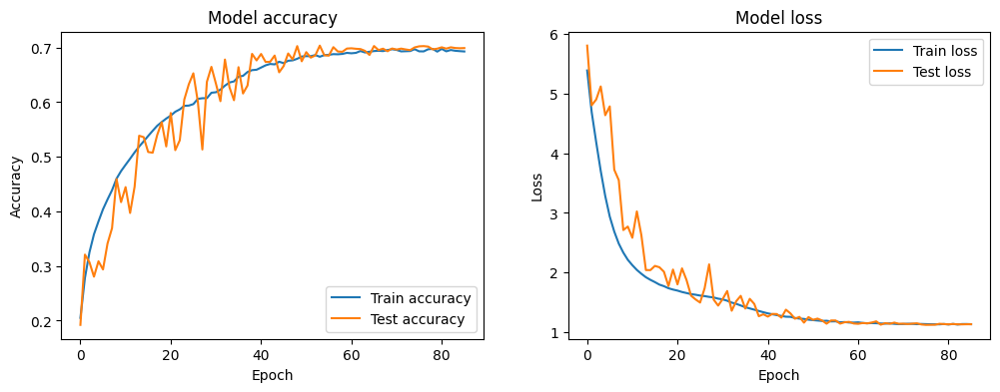

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.datasets import cifar10  # Reemplazar por tu dataset si es necesario
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.regularizers import l2

# Paso 1: Cargar el dataset CIFAR-10 (reemplazar con tus datos si es necesario)
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

# Paso 2: Preprocesar los datos
X_train = X_train.astype('float32') / 255.0
X_test = X_test.astype('float32') / 255.0

# Convertir las etiquetas a formato categórico (one-hot encoding)
y_train = to_categorical(y_train, 10)  # Cambia '10' por el número de clases de tu dataset
y_test = to_categorical(y_test, 10)

# Aumento de datos más agresivo
datagen = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True,
    zoom_range=0.2,
    shear_range=0.2
)

# Ajustar el generador de imágenes a los datos de entrenamiento
datagen.fit(X_train)

# Función para reducir la tasa de aprendizaje durante el entrenamiento
def scheduler(epoch, lr):
    if epoch < 30:
        return float(lr)  # Asegurarse de que sea un float
    else:
        return float(lr * tf.math.exp(-0.1))  # Convertir a float

# Paso 3: Definir el modelo CNN mejorado
model = Sequential()

# Primer bloque de capas convolucionales
model.add(Conv2D(64, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002), input_shape=(32, 32, 3)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.5))

# Segundo bloque de capas convolucionales
model.add(Conv2D(128, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.5))

# Tercer bloque de capas convolucionales
model.add(Conv2D(256, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.5))

# Cuarto bloque de capas convolucionales
model.add(Conv2D(512, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(Dropout(0.5))

# Aplanar la salida de las capas convolucionales
model.add(Flatten())

# Capas densas finales
model.add(Dense(512, activation='relu', kernel_regularizer=l2(0.002)))
model.add(Dropout(0.5))

model.add(Dense(10, activation='softmax'))  # Cambia '10' por el número de clases de tu dataset

# Paso 4: Compilar el modelo
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Paso 5: Implementar Early Stopping y Learning Rate Scheduler
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
lr_scheduler = LearningRateScheduler(scheduler)

# Paso 6: Entrenar el modelo con aumento de datos
history = model.fit(datagen.flow(X_train, y_train, batch_size=64),
                    epochs=100,
                    validation_data=(X_test, y_test),
                    verbose=1,
                    callbacks=[early_stopping, lr_scheduler])

# Paso 7: Evaluar el modelo
test_loss, test_acc = model.evaluate(X_test, y_test, verbose=2)
print(f"\nTest accuracy: {test_acc}")

# Guardar el modelo completo al final del entrenamiento
model.save('modelo_mejorado.h5')

print("Modelo guardado exitosamente como 'modelo_mejorado.h5'")

# Graficar los resultados
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train accuracy')
plt.plot(history.history['val_accuracy'], label='Test accuracy')
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train loss')
plt.plot(history.history['val_loss'], label='Test loss')
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.datasets import cifar10  # Reemplazar por tu dataset si es necesario
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.regularizers import l2

# Paso 1: Cargar el dataset CIFAR-10 (reemplazar con tus datos si es necesario)
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

# Paso 2: Preprocesar los datos
X_train = X_train.astype('float32') / 255.0
X_test = X_test.astype('float32') / 255.0

# Convertir las etiquetas a formato categórico (one-hot encoding)
y_train = to_categorical(y_train, 10)  # Cambia '10' por el número de clases de tu dataset
y_test = to_categorical(y_test, 10)

# Aumento de datos más agresivo
datagen = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.3,  # Aumentar el desplazamiento
    height_shift_range=0.3,
    horizontal_flip=True,
    zoom_range=0.3,  # Aumentar el zoom
    shear_range=0.3,
    brightness_range=[0.8, 1.2]  # Cambiar el brillo de las imágenes
)

# Ajustar el generador de imágenes a los datos de entrenamiento
datagen.fit(X_train)

# Función para reducir la tasa de aprendizaje durante el entrenamiento
def scheduler(epoch, lr):
    if epoch < 30:
        return lr
    else:
        return float(lr * tf.math.exp(-0.05))  # Reducir más lentamente la tasa de aprendizaje

# Paso 3: Definir el modelo CNN mejorado con más capacidad
model = Sequential()

# Primer bloque de capas convolucionales
model.add(Conv2D(64, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002), input_shape=(32, 32, 3)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.5))

# Segundo bloque de capas convolucionales
model.add(Conv2D(128, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.5))

# Tercer bloque de capas convolucionales
model.add(Conv2D(256, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.5))

# Cuarto bloque de capas convolucionales
model.add(Conv2D(512, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(Dropout(0.5))

# Aplanar la salida de las capas convolucionales
model.add(Flatten())

# Capas densas finales con más capacidad
model.add(Dense(1024, activation='relu', kernel_regularizer=l2(0.002)))  # Aumentar a 1024 neuronas
model.add(Dropout(0.5))

model.add(Dense(10, activation='softmax'))  # Cambia '10' por el número de clases de tu dataset

# Paso 4: Compilar el modelo
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Paso 5: Implementar Early Stopping y Learning Rate Scheduler
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
lr_scheduler = LearningRateScheduler(scheduler)

# Paso 6: Entrenar el modelo con aumento de datos y más épocas
history = model.fit(datagen.flow(X_train, y_train, batch_size=64),
                    epochs=150,  # Aumentar las épocas
                    validation_data=(X_test, y_test),
                    verbose=1,
                    callbacks=[early_stopping, lr_scheduler])

# Paso 7: Evaluar el modelo
test_loss, test_acc = model.evaluate(X_test, y_test, verbose=2)
print(f"\nTest accuracy: {test_acc}")

# Guardar el modelo completo al final del entrenamiento
model.save('modelo_mejorado_v2.h5')

print("Modelo guardado exitosamente como 'modelo_mejorado_v2.h5'")

# Graficar los resultados
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train accuracy')
plt.plot(history.history['val_accuracy'], label='Test accuracy')
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train loss')
plt.plot(history.history['val_loss'], label='Test loss')
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()


Epoch 1/150
782/782 ━━━━━━━━━━━━━━━━━━━━ 89s 100ms/step - accuracy: 0.1029 - loss: 7.8029 - val_accuracy: 0.0856 - val_loss: 6.8414 - learning_rate: 1.0000e-04
Epoch 2/150
782/782 ━━━━━━━━━━━━━━━━━━━━ 61s 77ms/step - accuracy: 0.1018 - loss: 6.9394 - val_accuracy: 0.1024 - val_loss: 6.3389 - learning_rate: 1.0000e-04
Epoch 3/150
782/782 ━━━━━━━━━━━━━━━━━━━━ 63s 80ms/step - accuracy: 0.1030 - loss: 6.2721 - val_accuracy: 0.0947 - val_loss: 5.7817 - learning_rate: 1.0000e-04
Epoch 4/150
782/782 ━━━━━━━━━━━━━━━━━━━━ 60s 77ms/step - accuracy: 0.1026 - loss: 5.6421 - val_accuracy: 0.1093 - val_loss: 5.1432 - learning_rate: 1.0000e-04
Epoch 5/150
782/782 ━━━━━━━━━━━━━━━━━━━━ 82s 77ms/step - accuracy: 0.1037 - loss: 4.9851 - val_accuracy: 0.0965 - val_loss: 4.4901 - learning_rate: 1.0000e-04
Epoch 6/150
782/782 ━━━━━━━━━━━━━━━━━━━━ 62s 79ms/step - accuracy: 0.1040 - loss: 4.3359 - val_accuracy: 0.1011 - val_loss: 3.8800 - learning_rate: 1.0000e-04
Epoch 7/150
782/782 ━━━━━━━━━━━━━━━━━━━━ 62s 

KeyboardInterrupt: 

Epoch 1/75
782/782 ━━━━━━━━━━━━━━━━━━━━ 60s 66ms/step - accuracy: 0.2503 - loss: 5.4572 - val_accuracy: 0.2663 - val_loss: 5.6992 - learning_rate: 1.0000e-04
Epoch 2/75
782/782 ━━━━━━━━━━━━━━━━━━━━ 70s 57ms/step - accuracy: 0.3994 - loss: 4.4191 - val_accuracy: 0.3141 - val_loss: 5.3812 - learning_rate: 1.0000e-04
Epoch 3/75
782/782 ━━━━━━━━━━━━━━━━━━━━ 42s 53ms/step - accuracy: 0.4522 - loss: 3.9008 - val_accuracy: 0.3429 - val_loss: 5.0412 - learning_rate: 1.0000e-04
Epoch 4/75
782/782 ━━━━━━━━━━━━━━━━━━━━ 83s 55ms/step - accuracy: 0.4960 - loss: 3.4078 - val_accuracy: 0.3772 - val_loss: 4.6354 - learning_rate: 1.0000e-04
Epoch 5/75
782/782 ━━━━━━━━━━━━━━━━━━━━ 82s 55ms/step - accuracy: 0.5220 - loss: 2.9962 - val_accuracy: 0.4730 - val_loss: 3.5095 - learning_rate: 1.0000e-04
Epoch 6/75
782/782 ━━━━━━━━━━━━━━━━━━━━ 81s 54ms/step - accuracy: 0.5578 - loss: 2.6518 - val_accuracy: 0.4150 - val_loss: 3.7953 - learning_rate: 1.0000e-04
Epoch 7/75
782/782 ━━━━━━━━━━━━━━━━━━━━ 84s 57ms/ste

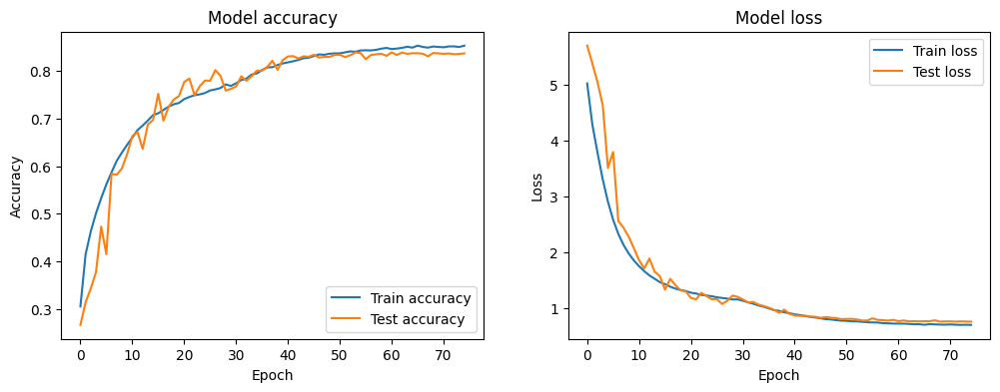

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler
from tensorflow.keras.preprocessing.image import ImageDataGenerator  # Nueva importación

# Paso 1: Cargar el dataset CIFAR-10
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

# Paso 2: Preprocesar los datos
X_train = X_train.astype('float32') / 255.0
X_test = X_test.astype('float32') / 255.0

# Convertir las etiquetas a formato categórico (one-hot encoding)
y_train = to_categorical(y_train, 10)
y_test = to_categorical(y_test, 10)

# Aumento de datos
datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True
)

# Ajustar el generador de imágenes a los datos de entrenamiento
datagen.fit(X_train)

# Función para reducir la tasa de aprendizaje durante el entrenamiento
def scheduler(epoch, lr):
    if epoch < 30:
        return float(lr)
    else:
        return float(lr * tf.math.exp(-0.1))

# Paso 3: Definir el modelo CNN mejorado
model = Sequential()

model.add(Conv2D(64, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002), input_shape=(32, 32, 3)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

model.add(Conv2D(128, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

model.add(Conv2D(256, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

model.add(Conv2D(512, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(Dropout(0.4))

model.add(Flatten())

model.add(Dense(512, activation='relu', kernel_regularizer=l2(0.002)))
model.add(Dropout(0.4))

model.add(Dense(10, activation='softmax'))

# Paso 4: Compilar el modelo
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Paso 5: Implementar Early Stopping y Learning Rate Scheduler
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
lr_scheduler = LearningRateScheduler(scheduler)

# Paso 6: Entrenar el modelo con aumento de datos
history = model.fit(datagen.flow(X_train, y_train, batch_size=64),
                              epochs=75,
                              validation_data=(X_test, y_test),
                              verbose=1,
                              callbacks=[early_stopping, lr_scheduler])


# Guardar el modelo completo al final del entrenamiento
model.save('modelo_mejorado_v2.h5')
print("Modelo guardado exitosamente como 'modelo_mejorado_v2.h5'")


# Paso 7: Evaluar el modelo
test_loss, test_acc = model.evaluate(X_test, y_test, verbose=2)
print(f"\nTest accuracy: {test_acc}")

# Graficar los resultados
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train accuracy')
plt.plot(history.history['val_accuracy'], label='Test accuracy')
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train loss')
plt.plot(history.history['val_loss'], label='Test loss')
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!cp -r /content/drive/MyDrive/dataset /content/

170498071/170498071 ━━━━━━━━━━━━━━━━━━━━ 14s 0us/step


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/75


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


782/782 ━━━━━━━━━━━━━━━━━━━━ 68s 68ms/step - accuracy: 0.2141 - loss: 6.1706 - val_accuracy: 0.2998 - val_loss: 5.7859 - learning_rate: 1.0000e-04
Epoch 2/75
782/782 ━━━━━━━━━━━━━━━━━━━━ 58s 50ms/step - accuracy: 0.3575 - loss: 5.1119 - val_accuracy: 0.3120 - val_loss: 5.7017 - learning_rate: 1.0000e-04
Epoch 3/75
782/782 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step - accuracy: 0.4231 - loss: 4.4582 - val_accuracy: 0.3701 - val_loss: 4.8583 - learning_rate: 1.0000e-04
Epoch 4/75
782/782 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step - accuracy: 0.4620 - loss: 3.8554 - val_accuracy: 0.3987 - val_loss: 4.2710 - learning_rate: 1.0000e-04
Epoch 5/75
782/782 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step - accuracy: 0.5026 - loss: 3.3450 - val_accuracy: 0.3964 - val_loss: 4.0671 - learning_rate: 1.0000e-04
Epoch 6/75
782/782 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step - accuracy: 0.5367 - loss: 2.9116 - val_accuracy: 0.4735 - val_loss: 3.2203 - learning_rate: 1.0000e-04
Epoch 7/75
782/782 ━━━━━━━━━━━━━━━━━━━━ 42s 52ms/step - accurac

Modelo guardado exitosamente como 'modelo_mejorado_v3.h5'
313/313 - 1s - 4ms/step - accuracy: 0.8286 - loss: 0.8024

Test accuracy: 0.8285999894142151


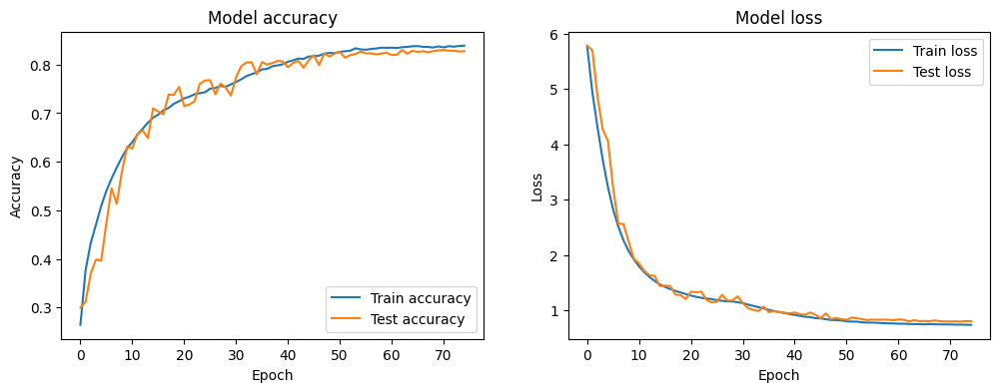

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler
from tensorflow.keras.preprocessing.image import ImageDataGenerator  # Nueva importación

# Paso 1: Cargar el dataset CIFAR-10
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

# Paso 2: Preprocesar los datos
X_train = X_train.astype('float32') / 255.0
X_test = X_test.astype('float32') / 255.0

# Convertir las etiquetas a formato categórico (one-hot encoding)
y_train = to_categorical(y_train, 10)
y_test = to_categorical(y_test, 10)

# Aumento de datos
datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True
)

# Ajustar el generador de imágenes a los datos de entrenamiento
datagen.fit(X_train)

# Función para reducir la tasa de aprendizaje durante el entrenamiento
def scheduler(epoch, lr):
    if epoch < 30:
        return float(lr)
    else:
        return float(lr * tf.math.exp(-0.1))

# Paso 3: Definir el modelo CNN mejorado (con una capa adicional y más filtros)
model = Sequential()

# Primer bloque de capas convolucionales (más filtros)
model.add(Conv2D(64, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002), input_shape=(32, 32, 3)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Segundo bloque de capas convolucionales (más filtros)
model.add(Conv2D(128, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Tercer bloque de capas convolucionales (sin cambios)
model.add(Conv2D(256, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# **Nueva capa convolucional adicional** (ligero aumento de filtros)
model.add(Conv2D(512, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Cuarto bloque de capas convolucionales (más filtros)
model.add(Conv2D(512, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(Dropout(0.4))

# Aplanar la salida de las capas convolucionales
model.add(Flatten())

# Capas densas finales
model.add(Dense(512, activation='relu', kernel_regularizer=l2(0.002)))
model.add(Dropout(0.4))

model.add(Dense(10, activation='softmax'))

# Paso 4: Compilar el modelo
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Paso 5: Implementar Early Stopping y Learning Rate Scheduler
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
lr_scheduler = LearningRateScheduler(scheduler)

# Paso 6: Entrenar el modelo con aumento de datos
history = model.fit(datagen.flow(X_train, y_train, batch_size=64),
                    epochs=75,
                    validation_data=(X_test, y_test),
                    verbose=1,
                    callbacks=[early_stopping, lr_scheduler])

# Guardar el modelo completo al final del entrenamiento
model.save('modelo_mejorado_v3.h5')
print("Modelo guardado exitosamente como 'modelo_mejorado_v3.h5'")

# Paso 7: Evaluar el modelo
test_loss, test_acc = model.evaluate(X_test, y_test, verbose=2)
print(f"\nTest accuracy: {test_acc}")

# Graficar los resultados
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train accuracy')
plt.plot(history.history['val_accuracy'], label='Test accuracy')
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train loss')
plt.plot(history.history['val_loss'], label='Test loss')
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/85
782/782 ━━━━━━━━━━━━━━━━━━━━ 53s 59ms/step - accuracy: 0.2563 - loss: 5.3608 - val_accuracy: 0.3159 - val_loss: 5.2093 - learning_rate: 1.0000e-04
Epoch 2/85
782/782 ━━━━━━━━━━━━━━━━━━━━ 73s 53ms/step - accuracy: 0.4137 - loss: 3.9725 - val_accuracy: 0.3478 - val_loss: 5.2106 - learning_rate: 1.0000e-04
Epoch 3/85
782/782 ━━━━━━━━━━━━━━━━━━━━ 39s 49ms/step - accuracy: 0.4623 - loss: 3.3240 - val_accuracy: 0.3874 - val_loss: 4.7653 - learning_rate: 1.0000e-04
Epoch 4/85
782/782 ━━━━━━━━━━━━━━━━━━━━ 38s 48ms/step - accuracy: 0.5006 - loss: 2.9197 - val_accuracy: 0.4323 - val_loss: 4.1336 - learning_rate: 1.0000e-04
Epoch 5/85
782/782 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step - accuracy: 0.5297 - loss: 2.6353 - val_accuracy: 0.4010 - val_loss: 4.5874 - learning_rate: 1.0000e-04
Epoch 6/85
782/782 ━━━━━━━━━━━━━━━━━━━━ 39s 50ms/step - accuracy: 0.5426 - loss: 2.4409 - val_accuracy: 0.4484 - val_loss: 3.9671 - learning_rate: 1.0000e-04
Epoch 7/85
782/782 ━━━━━━━━━━━━━━━━━━━━ 43s 52ms/ste

Modelo guardado exitosamente como 'modelo_mejorado_v4.h5'
313/313 - 1s - 3ms/step - accuracy: 0.8507 - loss: 0.7146

Test accuracy: 0.8507000207901001


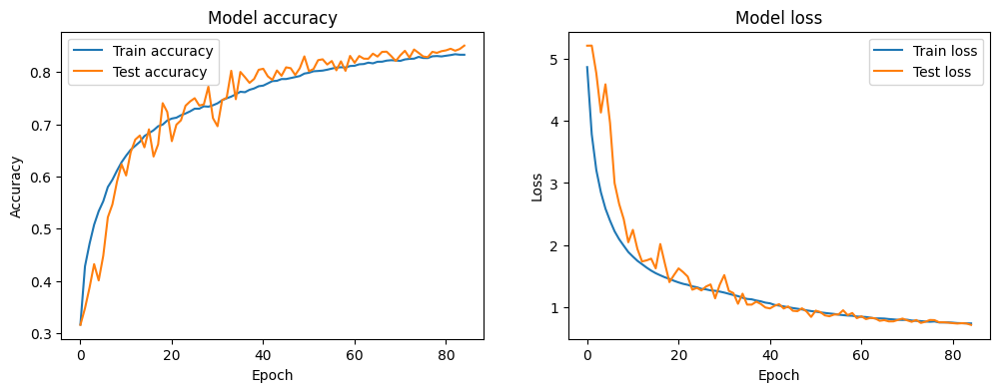

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Paso 1: Cargar el dataset CIFAR-10
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

# Paso 2: Preprocesar los datos
X_train = X_train.astype('float32') / 255.0
X_test = X_test.astype('float32') / 255.0

# Convertir las etiquetas a formato categórico (one-hot encoding)
y_train = to_categorical(y_train, 10)
y_test = to_categorical(y_test, 10)

# Aumento de datos
datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True
)

datagen.fit(X_train)

# Función para reducir la tasa de aprendizaje durante el entrenamiento
def scheduler(epoch, lr):
    if epoch < 30:
        return float(lr)
    else:
        return float(lr * tf.math.exp(-0.05))  # Ajustar el decrecimiento de la tasa de aprendizaje

# Modelo anterior con modificaciones mínimas
model = Sequential()

# Primer bloque de capas convolucionales
model.add(Conv2D(64, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002), input_shape=(32, 32, 3)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Segundo bloque de capas convolucionales
model.add(Conv2D(128, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Tercer bloque de capas convolucionales
model.add(Conv2D(256, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Cuarto bloque de capas convolucionales
model.add(Conv2D(512, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(Dropout(0.4))

# Aplanar la salida de las capas convolucionales
model.add(Flatten())

# Capas densas finales
model.add(Dense(512, activation='relu', kernel_regularizer=l2(0.002)))
model.add(Dropout(0.4))

model.add(Dense(10, activation='softmax'))

# Paso 4: Compilar el modelo con un cambio en el optimizador a RMSprop
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Paso 5: Implementar Early Stopping y Learning Rate Scheduler
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
lr_scheduler = LearningRateScheduler(scheduler)

# Paso 6: Entrenar el modelo
history = model.fit(datagen.flow(X_train, y_train, batch_size=64),
                    epochs=100,
                    validation_data=(X_test, y_test),
                    verbose=1,
                    callbacks=[early_stopping, lr_scheduler])

# Guardar el modelo completo al final del entrenamiento
model.save('modelo_mejorado_v4.h5')
print("Modelo guardado exitosamente como 'modelo_mejorado_v4.h5'")

# Paso 7: Evaluar el modelo
test_loss, test_acc = model.evaluate(X_test, y_test, verbose=2)
print(f"\nTest accuracy: {test_acc}")

# Graficar los resultados
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train accuracy')
plt.plot(history.history['val_accuracy'], label='Test accuracy')
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train loss')
plt.plot(history.history['val_loss'], label='Test loss')
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Paso 1: Cargar el dataset CIFAR-10
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

# Paso 2: Preprocesar los datos
X_train = X_train.astype('float32') / 255.0
X_test = X_test.astype('float32') / 255.0

# Convertir las etiquetas a formato categórico (one-hot encoding)
y_train = to_categorical(y_train, 10)
y_test = to_categorical(y_test, 10)

# Aumento de datos más agresivo
datagen = ImageDataGenerator(
    rotation_range=40,  # Aumentar la rotación
    width_shift_range=0.2,  # Aumentar el desplazamiento horizontal
    height_shift_range=0.2,  # Aumentar el desplazamiento vertical
    zoom_range=0.2,  # Agregar zoom
    brightness_range=[0.8, 1.2],  # Cambiar el brillo de las imágenes
    horizontal_flip=True
)

# Ajustar el generador de imágenes a los datos de entrenamiento
datagen.fit(X_train)

# Función para reducir la tasa de aprendizaje durante el entrenamiento
def scheduler(epoch, lr):
    if epoch < 30:
        return float(lr)
    else:
        return float(lr * tf.math.exp(-0.05))  # Ajuste en la reducción de la tasa de aprendizaje

# Modelo (similar al anterior que funcionó bien)
model = Sequential()

# Primer bloque de capas convolucionales
model.add(Conv2D(64, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002), input_shape=(32, 32, 3)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Segundo bloque de capas convolucionales
model.add(Conv2D(128, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Tercer bloque de capas convolucionales
model.add(Conv2D(256, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Cuarto bloque de capas convolucionales
model.add(Conv2D(512, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(Dropout(0.4))

# Aplanar la salida de las capas convolucionales
model.add(Flatten())

# Capas densas finales
model.add(Dense(512, activation='relu', kernel_regularizer=l2(0.002)))
model.add(Dropout(0.4))

model.add(Dense(10, activation='softmax'))

# Paso 4: Compilar el modelo
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Paso 5: Implementar Early Stopping y Learning Rate Scheduler
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
lr_scheduler = LearningRateScheduler(scheduler)

# Paso 6: Entrenar el modelo con aumento de datos y 100 épocas
history = model.fit(datagen.flow(X_train, y_train, batch_size=64),
                    epochs=100,  # Aumentar el número de épocas a 100
                    validation_data=(X_test, y_test),
                    verbose=1,
                    callbacks=[early_stopping, lr_scheduler])

# Guardar el modelo completo al final del entrenamiento
model.save('modelo_mejorado_v5.h5')
print("Modelo guardado exitosamente como 'modelo_mejorado_v5.h5'")

# Paso 7: Evaluar el modelo
test_loss, test_acc = model.evaluate(X_test, y_test, verbose=2)
print(f"\nTest accuracy: {test_acc}")

# Graficar los resultados
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train accuracy')
plt.plot(history.history['val_accuracy'], label='Test accuracy')
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train loss')
plt.plot(history.history['val_loss'], label='Test loss')
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()


170498071/170498071 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


199/782 ━━━━━━━━━━━━━━━━━━━━ 8:57 921ms/step - accuracy: 0.1029 - loss: 6.0503

KeyboardInterrupt: 

170498071/170498071 ━━━━━━━━━━━━━━━━━━━━ 13s 0us/step


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
782/782 ━━━━━━━━━━━━━━━━━━━━ 63s 68ms/step - accuracy: 0.2547 - loss: 5.3535 - val_accuracy: 0.2777 - val_loss: 5.3184 - learning_rate: 1.0000e-04
Epoch 2/100
782/782 ━━━━━━━━━━━━━━━━━━━━ 41s 52ms/step - accuracy: 0.4129 - loss: 3.9559 - val_accuracy: 0.2597 - val_loss: 6.1842 - learning_rate: 1.0000e-04
Epoch 3/100
782/782 ━━━━━━━━━━━━━━━━━━━━ 82s 52ms/step - accuracy: 0.4673 - loss: 3.2998 - val_accuracy: 0.3365 - val_loss: 4.8974 - learning_rate: 1.0000e-04
Epoch 4/100
782/782 ━━━━━━━━━━━━━━━━━━━━ 84s 54ms/step - accuracy: 0.4916 - loss: 2.9124 - val_accuracy: 0.3076 - val_loss: 5.5267 - learning_rate: 1.0000e-04
Epoch 5/100
782/782 ━━━━━━━━━━━━━━━━━━━━ 79s 50ms/step - accuracy: 0.5290 - loss: 2.6356 - val_accuracy: 0.3463 - val_loss: 4.7212 - learning_rate: 1.0000e-04
Epoch 6/100
782/782 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step - accuracy: 0.5494 - loss: 2.4354 - val_accuracy: 0.4229 - val_loss: 4.0827 - learning_rate: 1.0000e-04
Epoch 7/100
782/782 ━━━━━━━━━━━━━━━━━━━━ 41s 5

Modelo guardado exitosamente como 'modelo_mejorado_v6.h5'
313/313 - 1s - 3ms/step - accuracy: 0.8437 - loss: 0.7308

Test accuracy: 0.8436999917030334


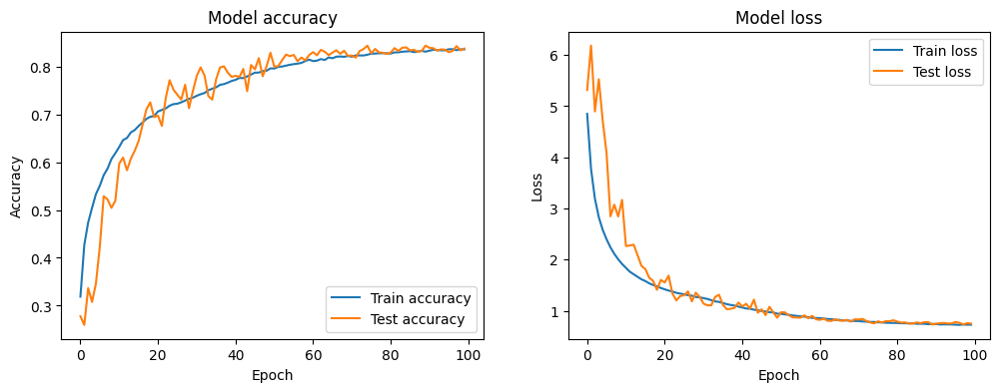

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Paso 1: Cargar el dataset CIFAR-10
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

# Paso 2: Preprocesar los datos
X_train = X_train.astype('float32') / 255.0
X_test = X_test.astype('float32') / 255.0

# Convertir las etiquetas a formato categórico (one-hot encoding)
y_train = to_categorical(y_train, 10)
y_test = to_categorical(y_test, 10)

# Aumento de datos
datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True
)

# Ajustar el generador de imágenes a los datos de entrenamiento
datagen.fit(X_train)

# Función para reducir la tasa de aprendizaje durante el entrenamiento
def scheduler(epoch, lr):
    if epoch < 30:
        return float(lr)
    else:
        return float(lr * tf.math.exp(-0.05))

# Modelo (similar al anterior que funcionó bien)
model = Sequential()

# Primer bloque de capas convolucionales
model.add(Conv2D(64, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002), input_shape=(32, 32, 3)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Segundo bloque de capas convolucionales
model.add(Conv2D(128, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Tercer bloque de capas convolucionales
model.add(Conv2D(256, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Cuarto bloque de capas convolucionales
model.add(Conv2D(512, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(Dropout(0.4))

# Aplanar la salida de las capas convolucionales
model.add(Flatten())

# Capas densas finales
model.add(Dense(512, activation='relu', kernel_regularizer=l2(0.002)))
model.add(Dropout(0.4))

model.add(Dense(10, activation='softmax'))

# Paso 4: Compilar el modelo
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Paso 5: Implementar Early Stopping y Learning Rate Scheduler
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
lr_scheduler = LearningRateScheduler(scheduler)

# Paso 6: Entrenar el modelo con aumento de datos menos agresivo
history = model.fit(datagen.flow(X_train, y_train, batch_size=64),
                    epochs=100,  # Continuamos con 100 épocas
                    validation_data=(X_test, y_test),
                    verbose=1,
                    callbacks=[early_stopping, lr_scheduler])

# Guardar el modelo completo al final del entrenamiento
model.save('modelo_mejorado_v6.h5')
print("Modelo guardado exitosamente como 'modelo_mejorado_v6.h5'")

# Paso 7: Evaluar el modelo
test_loss, test_acc = model.evaluate(X_test, y_test, verbose=2)
print(f"\nTest accuracy: {test_acc}")

# Graficar los resultados
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train accuracy')
plt.plot(history.history['val_accuracy'], label='Test accuracy')
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train loss')
plt.plot(history.history['val_loss'], label='Test loss')
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Paso 1: Cargar el dataset CIFAR-10
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

# Paso 2: Preprocesar los datos
X_train = X_train.astype('float32') / 255.0
X_test = X_test.astype('float32') / 255.0

# Convertir las etiquetas a formato categórico (one-hot encoding)
y_train = to_categorical(y_train, 10)
y_test = to_categorical(y_test, 10)

# Aumento de datos
datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True
)

datagen.fit(X_train)

# Función para reducir la tasa de aprendizaje durante el entrenamiento
def scheduler(epoch, lr):
    if epoch < 30:
        return float(lr)
    else:
        return float(lr * tf.math.exp(-0.05))  # Ajustar el decrecimiento de la tasa de aprendizaje

# Modelo anterior con modificaciones mínimas
model = Sequential()

# Primer bloque de capas convolucionales
model.add(Conv2D(64, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002), input_shape=(32, 32, 3)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Segundo bloque de capas convolucionales
model.add(Conv2D(128, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Tercer bloque de capas convolucionales
model.add(Conv2D(256, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Cuarto bloque de capas convolucionales
model.add(Conv2D(512, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(Dropout(0.4))

# Aplanar la salida de las capas convolucionales
model.add(Flatten())

# Capas densas finales
model.add(Dense(512, activation='relu', kernel_regularizer=l2(0.002)))
model.add(Dropout(0.4))

model.add(Dense(10, activation='softmax'))

# Paso 4: Compilar el modelo con un cambio en el optimizador a RMSprop
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Paso 5: Implementar Early Stopping y Learning Rate Scheduler
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
lr_scheduler = LearningRateScheduler(scheduler)

# Paso 6: Entrenar el modelo
history = model.fit(datagen.flow(X_train, y_train, batch_size=64),
                    epochs=100,
                    validation_data=(X_test, y_test),
                    verbose=1,
                    callbacks=[early_stopping, lr_scheduler])

# Guardar el modelo completo al final del entrenamiento
model.save('modelo_mejorado_v4.h5')
print("Modelo guardado exitosamente como 'modelo_mejorado_v4.h5'")

# Paso 7: Evaluar el modelo
test_loss, test_acc = model.evaluate(X_test, y_test, verbose=2)
print(f"\nTest accuracy: {test_acc}")

# Graficar los resultados
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train accuracy')
plt.plot(history.history['val_accuracy'], label='Test accuracy')
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train loss')
plt.plot(history.history['val_loss'], label='Test loss')
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()


Epoch 1/100
782/782 ━━━━━━━━━━━━━━━━━━━━ 53s 59ms/step - accuracy: 0.2585 - loss: 5.3687 - val_accuracy: 0.3478 - val_loss: 4.8464 - learning_rate: 1.0000e-04
Epoch 2/100
345/782 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step - accuracy: 0.3976 - loss: 4.1221

KeyboardInterrupt: 

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import yfinance as yf
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import LSTM, GRU, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
import os

# Ruta para guardar/cargar el modelo
model_path = 'modelo_lstm_gru.h5'

# Paso 1: Descargar más features (Precio de apertura, cierre, máximo, mínimo, volumen)
tickers = ['AAPL', 'MSFT', 'AMZN', 'GOOGL', 'META', 'TSLA', 'NVDA', 'ADBE', 'NFLX', 'INTC']
data = yf.download(tickers, start='2021-01-01', end='2024-01-01')

# Normalizar todas las features (apertura, cierre, máximo, mínimo, volumen)
features = ['Open', 'High', 'Low', 'Adj Close', 'Volume']
scalers = {}
scaled_data = {}

for feature in features:
    scalers[feature] = MinMaxScaler(feature_range=(0, 1))
    scaled_data[feature] = scalers[feature].fit_transform(data[feature])

# Concatenar todas las features normalizadas
data_combined = np.concatenate([scaled_data[feature] for feature in features], axis=1)

# Paso 2: Crear secuencias de 60 días para todas las features
def create_sequences(data, seq_length):
    sequences = []
    labels = []
    for i in range(len(data) - seq_length):
        sequences.append(data[i:i + seq_length])
        labels.append(data[i + seq_length])
    return np.array(sequences), np.array(labels)

seq_length = 60
X, y = create_sequences(data_combined, seq_length)

# Paso 3: Dividir en conjunto de entrenamiento y prueba
train_size = int(len(X) * 0.8)
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

# Paso 4: Cargar o Entrenar el modelo
if os.path.exists(model_path):
    print(f"Cargando modelo desde {model_path}...")
    model = load_model(model_path)
else:
    print("Entrenando el modelo...")
    model = Sequential()

    # Capa LSTM 1
    model.add(LSTM(units=150, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])))
    model.add(Dropout(0.3))

    # Capa LSTM 2
    model.add(LSTM(units=150, return_sequences=True))
    model.add(Dropout(0.3))

    # Capa GRU
    model.add(GRU(units=100, return_sequences=False))
    model.add(Dropout(0.3))

    # Capa Densa
    model.add(Dense(units=y_train.shape[1]))

    # Compilar el modelo
    model.compile(optimizer='adam', loss='mean_squared_error')

    # Paso 5: Entrenar el modelo con early stopping ajustado
    early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)
    history = model.fit(X_train, y_train, epochs=100, batch_size=64, validation_data=(X_test, y_test), verbose=1, callbacks=[early_stopping])

    # Guardar el modelo después del entrenamiento
    model.save(model_path)
    print(f"Modelo guardado exitosamente como {model_path}")

# Paso 5: Evaluar el modelo (opcional si solo quieres corregir gráficos)
test_loss = model.evaluate(X_test, y_test, verbose=2)
print(f"Pérdida en el conjunto de prueba: {test_loss}")

# Opción 1: Predecir la siguiente semana (5 días hábiles) usando la última secuencia
dias_a_predecir = 5
ultima_secuencia = X_test[-1:]  # Última secuencia del conjunto de prueba
predicciones_futuras = []

# Predicciones para los próximos 5 días (opción 1)
for _ in range(dias_a_predecir):
    prediccion = model.predict(ultima_secuencia)
    predicciones_futuras.append(prediccion)
    ultima_secuencia = np.append(ultima_secuencia[:, 1:, :], np.expand_dims(prediccion, axis=1), axis=1)

# Convertir a array las predicciones de la opción 1
predicciones_futuras = np.array(predicciones_futuras).squeeze()

# Paso 8: Desescalar las predicciones (solo la parte de 'Adj Close')
adj_close_indices = features.index('Adj Close')  # Índice de 'Adj Close'
predicciones_adj_close = predicciones_futuras[:, adj_close_indices:adj_close_indices+len(tickers)]

# Desescalar las predicciones
predicciones_futuras_desescaladas = scalers['Adj Close'].inverse_transform(predicciones_adj_close)

# Mostrar las predicciones de la Opción 1
print("Predicciones para los próximos 5 días (Opción 1):")
print(predicciones_futuras_desescaladas)

# Graficar la predicción para la próxima semana (Opción 1)
for i, ticker in enumerate(tickers):
    plt.figure(figsize=(6, 4))
    plt.plot(range(dias_a_predecir), predicciones_futuras_desescaladas[:, i], label=f'{ticker} - Predicción')
    plt.title(f'Predicción para {ticker} (Próxima semana - Opción 1)')
    plt.xlabel('Días')
    plt.ylabel('Precio Predicho')
    plt.legend()
    plt.grid(True)
    plt.show()

# Opción 2: Aumentar el precio de AAPL en un 5% y predecir cómo afecta a otras acciones
X_test_modificado = X_test.copy()
X_test_modificado[:, :, tickers.index('AAPL')] *= 1.05  # Aumentar AAPL un 5%

ultima_secuencia_modificada = X_test_modificado[-1:]
predicciones_futuras_modificadas = []

# Predicciones para los próximos 5 días (opción 2)
for _ in range(dias_a_predecir):
    prediccion_modificada = model.predict(ultima_secuencia_modificada)
    predicciones_futuras_modificadas.append(prediccion_modificada)
    ultima_secuencia_modificada = np.append(ultima_secuencia_modificada[:, 1:, :], np.expand_dims(prediccion_modificada, axis=1), axis=1)

# Convertir a array las predicciones de la opción 2
predicciones_futuras_modificadas = np.array(predicciones_futuras_modificadas).squeeze()

# Desescalar las predicciones de 'Adj Close' para la opción 2
predicciones_adj_close_mod = predicciones_futuras_modificadas[:, adj_close_indices:adj_close_indices+len(tickers)]
predicciones_futuras_desescaladas_mod = scalers['Adj Close'].inverse_transform(predicciones_adj_close_mod)

# Mostrar las predicciones de la Opción 2
print("Predicciones modificadas para los próximos 5 días (AAPL +5% - Opción 2):")
print(predicciones_futuras_desescaladas_mod)

# Graficar la predicción para la próxima semana con modificación (Opción 2)
for i, ticker in enumerate(tickers):
    plt.figure(figsize=(6, 4))
    plt.plot(range(dias_a_predecir), predicciones_futuras_desescaladas_mod[:, i], label=f'{ticker} - Predicción (AAPL +5%)')
    plt.title(f'Predicción para {ticker} (Próxima semana - Opción 2)')
    plt.xlabel('Días')
    plt.ylabel('Precio Predicho')
    plt.legend()
    plt.grid(True)
    plt.show()

# Graficar la pérdida durante el entrenamiento (si fue entrenado en esta sesión)
if 'history' in locals():
    plt.figure(figsize=(10, 6))
    plt.plot(history.history['loss'], label='Pérdida en entrenamiento')
    plt.plot(history.history['val_loss'], label='Pérdida en validación')
    plt.title('Pérdida durante el entrenamiento')
    plt.xlabel('Épocas')
    plt.ylabel('Pérdida')
    plt.legend()
    plt.grid(True)
    plt.show()


[*********************100%***********************]  10 of 10 completed
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Entrenando el modelo...
Epoch 1/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 12s 464ms/step - loss: 0.1500 - val_loss: 0.0738
Epoch 2/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 6s 551ms/step - loss: 0.0556 - val_loss: 0.0432
Epoch 3/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 6s 598ms/step - loss: 0.0371 - val_loss: 0.0290
Epoch 4/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 8s 375ms/step - loss: 0.0290 - val_loss: 0.0219
Epoch 5/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 6s 458ms/step - loss: 0.0254 - val_loss: 0.0257
Epoch 6/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 4s 382ms/step - loss: 0.0235 - val_loss: 0.0192
Epoch 7/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 7s 565ms/step - loss: 0.0209 - val_loss: 0.0202
Epoch 8/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 4s 384ms/step - loss: 0.0195 - val_loss: 0.0154
Epoch 9/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 5s 377ms/step - loss: 0.0184 - val_loss: 0.0153
Epoch 10/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 6s 508ms/step - loss: 0.0166 - val_loss: 0.0145
Epoch 11/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 3s 375ms/step - loss: 0.0163 - val_loss: 0.0157
Epoch 12/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 

Modelo guardado exitosamente como modelo_lstm_gru.h5
5/5 - 0s - 63ms/step - loss: 0.0089
Pérdida en el conjunto de prueba: 0.008881015703082085
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Predicciones para los próximos 5 días (Opción 1):
[[190.92104  477.0447   179.80069  143.64494   48.795517 311.3414
  306.7481   658.1488    38.426514 325.85913 ]
 [190.64378  479.42065  180.00781  143.2531    48.72094  309.208
  306.98477  654.43524   38.31933  326.0737  ]
 [190.10161  480.88864  180.01237  142.6705    48.58165  306.23138
  306.9785   649.6209    38.107086 325.2914  ]
 [189.53488  481.92828  179.93547  142.03987   48.438374 302.97955
  307.04205  644.83624   37.86802  324.2905  ]
 [189.06198  482.8332   179.83452  141.43657   48.31949  299.7672
  307.31537  640.61163   37.647076 323.48022 ]]


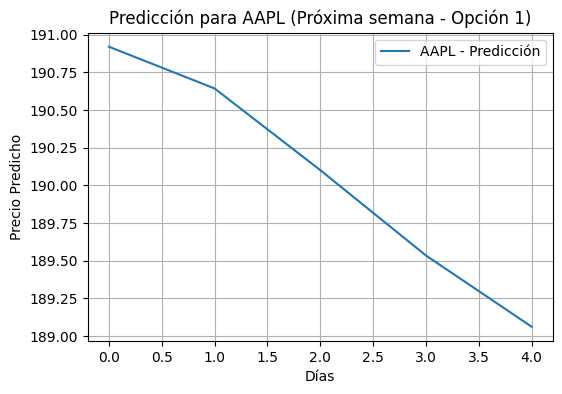

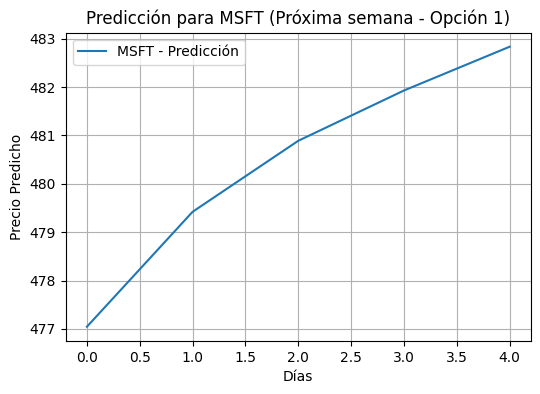

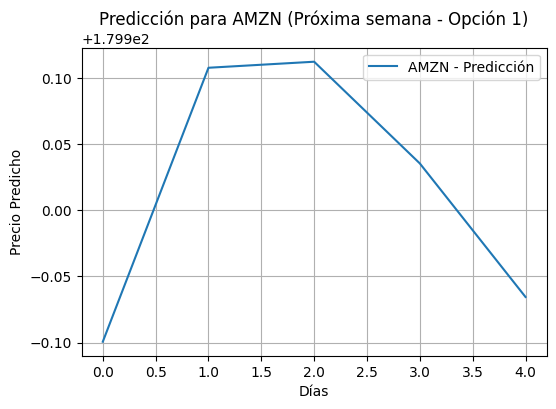

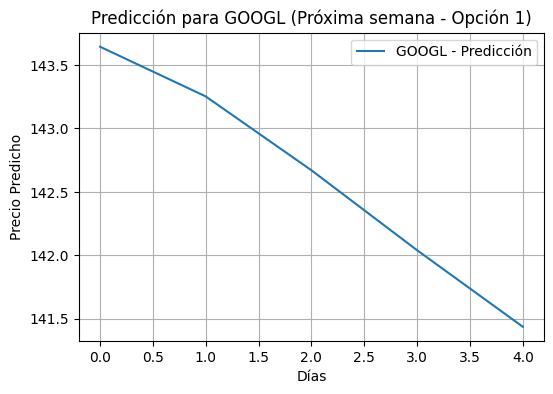

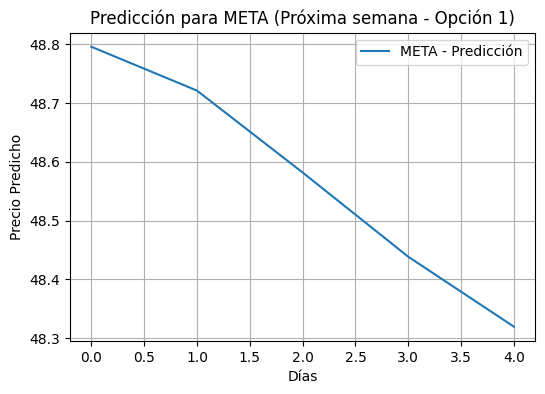

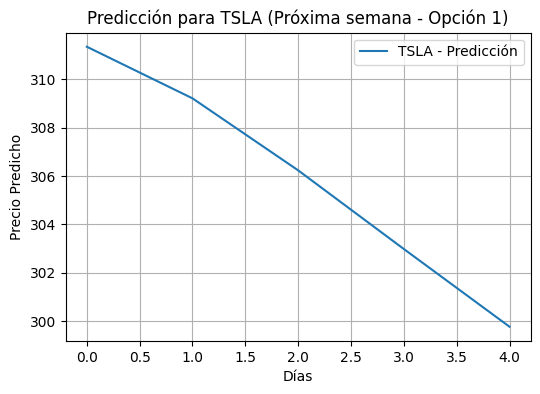

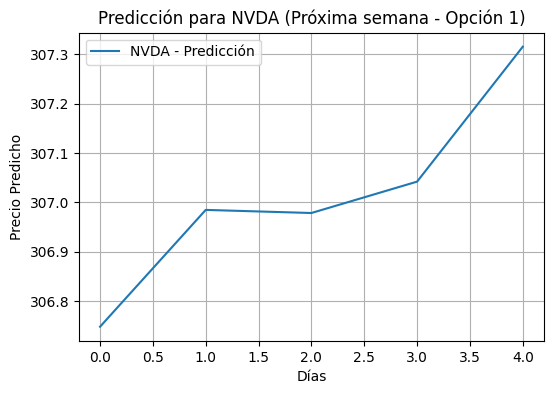

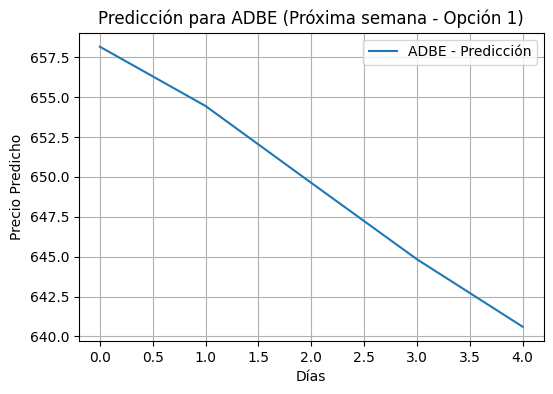

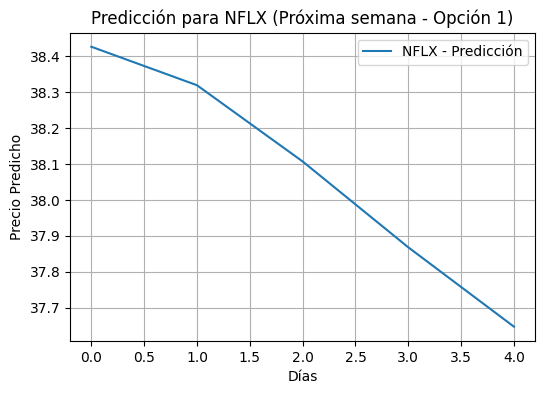

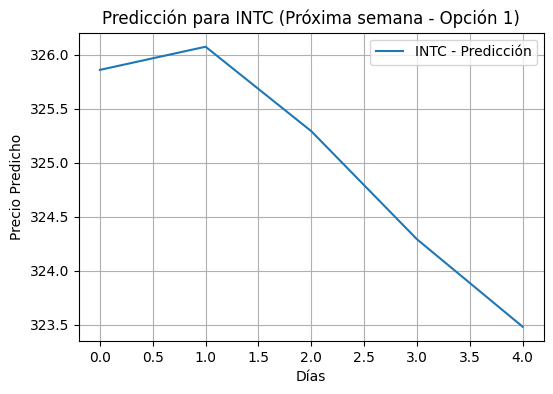

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
Predicciones modificadas para los próximos 5 días (AAPL +5% - Opción 2):
[[190.8221   476.34695  179.93109  143.61441   48.638012 311.15903
  306.71866  660.33673   38.28958  325.3644  ]
 [190.54366  478.7365   180.13948  143.22148   48.562542 309.0126
  306.95102  656.6063    38.183945 325.56342 ]
 [190.00523  480.23624  180.14577  142.64154   48.424435 306.03058
  306.94437  651.775     37.975986 324.77145 ]
 [189.44864  481.32474  180.06989  142.01743   48.284832 302.7836
  307.0137   646.9738    37.744167 323.77475 ]
 [188.99136  482.28928  179.96747  141.42317   48.171627 299.58426
  307.29773  642.7293    37.532604 322.98236 ]]


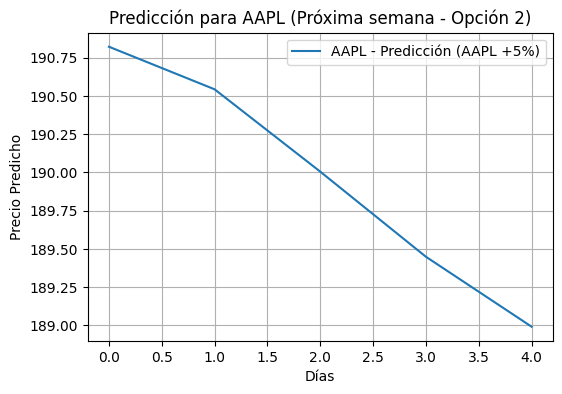

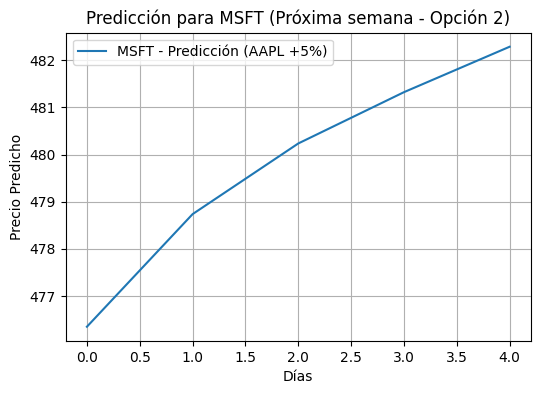

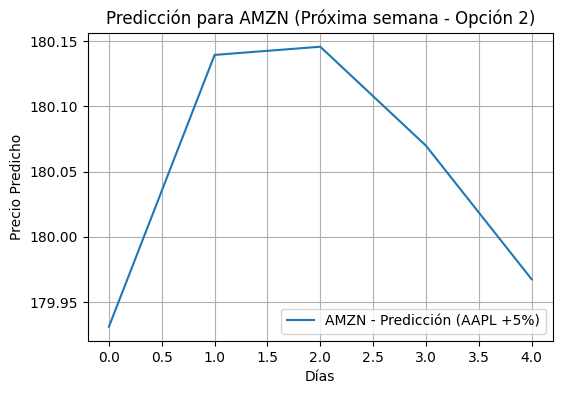

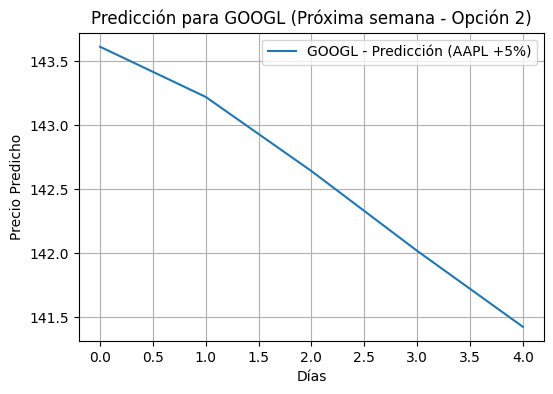

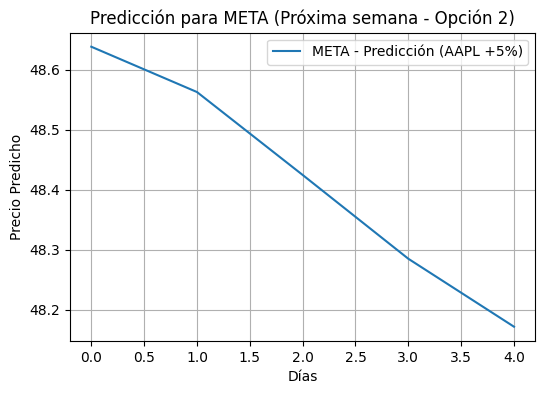

...

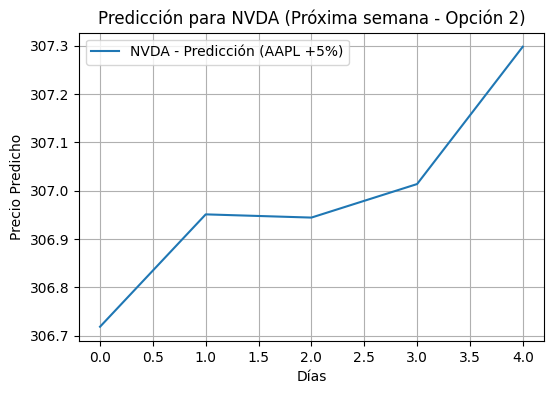

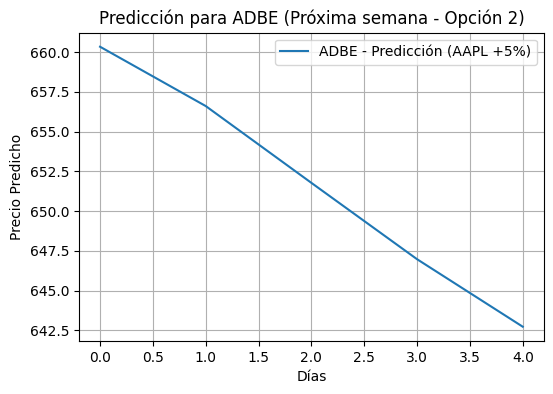

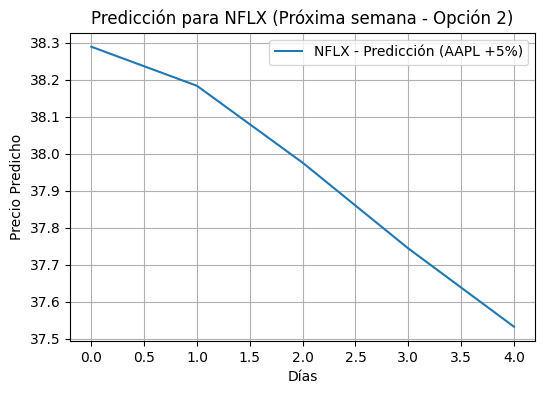

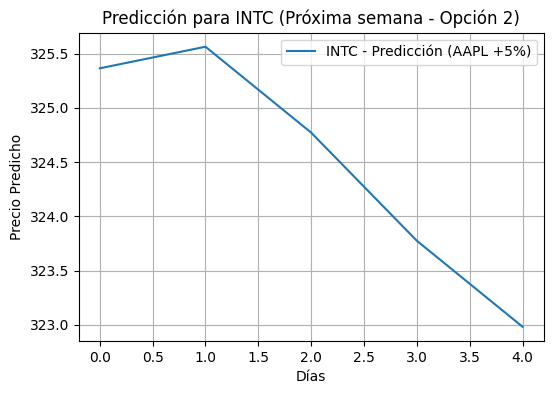

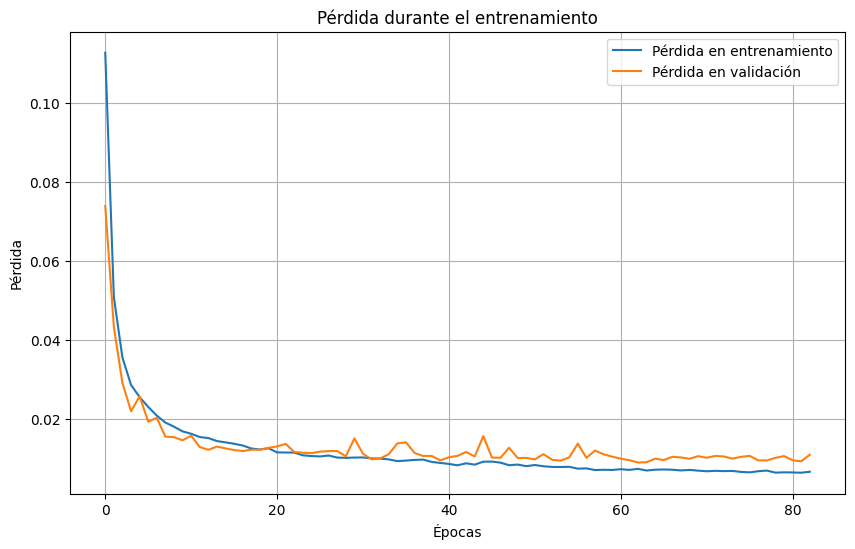

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import yfinance as yf
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import LSTM, GRU, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
import os

# Ruta para guardar/cargar el modelo
model_path = 'modelo_lstm_gru.h5'

# Paso 1: Descargar más features (Precio de apertura, cierre, máximo, mínimo, volumen)
tickers = ['AAPL', 'MSFT', 'AMZN', 'GOOGL', 'META', 'TSLA', 'NVDA', 'ADBE', 'NFLX', 'INTC']
data = yf.download(tickers, start='2021-01-01', end='2024-01-01')

# Normalizar todas las features (apertura, cierre, máximo, mínimo, volumen)
features = ['Open', 'High', 'Low', 'Adj Close', 'Volume']
scalers = {}
scaled_data = {}

for feature in features:
    scalers[feature] = MinMaxScaler(feature_range=(0, 1))
    scaled_data[feature] = scalers[feature].fit_transform(data[feature])

# Concatenar todas las features normalizadas
data_combined = np.concatenate([scaled_data[feature] for feature in features], axis=1)

# Paso 2: Crear secuencias de 60 días para todas las features
def create_sequences(data, seq_length):
    sequences = []
    labels = []
    for i in range(len(data) - seq_length):
        sequences.append(data[i:i + seq_length])
        labels.append(data[i + seq_length])
    return np.array(sequences), np.array(labels)

seq_length = 60
X, y = create_sequences(data_combined, seq_length)

# Paso 3: Dividir en conjunto de entrenamiento y prueba
train_size = int(len(X) * 0.8)
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

# Paso 4: Cargar o Entrenar el modelo
if os.path.exists(model_path):
    print(f"Cargando modelo desde {model_path}...")
    model = load_model(model_path)
else:
    print("Entrenando el modelo...")
    model = Sequential()

    # Capa LSTM 1
    model.add(LSTM(units=150, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])))
    model.add(Dropout(0.3))

    # Capa LSTM 2
    model.add(LSTM(units=150, return_sequences=True))
    model.add(Dropout(0.3))

    # Capa GRU
    model.add(GRU(units=100, return_sequences=False))
    model.add(Dropout(0.3))

    # Capa Densa
    model.add(Dense(units=y_train.shape[1]))

    # Compilar el modelo
    model.compile(optimizer='adam', loss='mean_squared_error')

    # Paso 5: Entrenar el modelo con early stopping ajustado
    early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)
    history = model.fit(X_train, y_train, epochs=100, batch_size=64, validation_data=(X_test, y_test), verbose=1, callbacks=[early_stopping])

    # Guardar el modelo después del entrenamiento
    model.save(model_path)
    print(f"Modelo guardado exitosamente como {model_path}")

# Paso 5: Evaluar el modelo (opcional si solo quieres corregir gráficos)
test_loss = model.evaluate(X_test, y_test, verbose=2)
print(f"Pérdida en el conjunto de prueba: {test_loss}")

# Opción 1: Predecir la siguiente semana (5 días hábiles) usando la última secuencia
dias_a_predecir = 5
ultima_secuencia = X_test[-1:]  # Última secuencia del conjunto de prueba
predicciones_futuras = []

# Predicciones para los próximos 5 días (opción 1)
for _ in range(dias_a_predecir):
    prediccion = model.predict(ultima_secuencia)
    predicciones_futuras.append(prediccion)
    ultima_secuencia = np.append(ultima_secuencia[:, 1:, :], np.expand_dims(prediccion, axis=1), axis=1)

# Convertir a array las predicciones de la opción 1
predicciones_futuras = np.array(predicciones_futuras).squeeze()

# Paso 8: Desescalar las predicciones (solo la parte de 'Adj Close')
adj_close_indices = features.index('Adj Close')  # Índice de 'Adj Close'
predicciones_adj_close = predicciones_futuras[:, adj_close_indices:adj_close_indices+len(tickers)]

# Desescalar las predicciones
predicciones_futuras_desescaladas = scalers['Adj Close'].inverse_transform(predicciones_adj_close)

# Mostrar las predicciones de la Opción 1
print("Predicciones para los próximos 5 días (Opción 1):")
print(predicciones_futuras_desescaladas)

# Graficar la predicción para la próxima semana (Opción 1)
for i, ticker in enumerate(tickers):
    plt.figure(figsize=(6, 4))
    plt.plot(range(dias_a_predecir), predicciones_futuras_desescaladas[:, i], label=f'{ticker} - Predicción')
    plt.title(f'Predicción para {ticker} (Próxima semana - Opción 1)')
    plt.xlabel('Días')
    plt.ylabel('Precio Predicho')
    plt.legend()
    plt.grid(True)
    plt.show()

# Opción 2: Aumentar el precio de AAPL en un 5% y predecir cómo afecta a otras acciones
X_test_modificado = X_test.copy()
X_test_modificado[:, :, tickers.index('AAPL')] *= 1.05  # Aumentar AAPL un 5%

ultima_secuencia_modificada = X_test_modificado[-1:]
predicciones_futuras_modificadas = []

# Predicciones para los próximos 5 días (opción 2)
for _ in range(dias_a_predecir):
    prediccion_modificada = model.predict(ultima_secuencia_modificada)
    predicciones_futuras_modificadas.append(prediccion_modificada)
    ultima_secuencia_modificada = np.append(ultima_secuencia_modificada[:, 1:, :], np.expand_dims(prediccion_modificada, axis=1), axis=1)

# Convertir a array las predicciones de la opción 2
predicciones_futuras_modificadas = np.array(predicciones_futuras_modificadas).squeeze()

# Desescalar las predicciones de 'Adj Close' para la opción 2
predicciones_adj_close_mod = predicciones_futuras_modificadas[:, adj_close_indices:adj_close_indices+len(tickers)]
predicciones_futuras_desescaladas_mod = scalers['Adj Close'].inverse_transform(predicciones_adj_close_mod)

# Mostrar las predicciones de la Opción 2
print("Predicciones modificadas para los próximos 5 días (AAPL +5% - Opción 2):")
print(predicciones_futuras_desescaladas_mod)

# Graficar la predicción para la próxima semana con modificación (Opción 2)
for i, ticker in enumerate(tickers):
    plt.figure(figsize=(6, 4))
    plt.plot(range(dias_a_predecir), predicciones_futuras_desescaladas_mod[:, i], label=f'{ticker} - Predicción (AAPL +5%)')
    plt.title(f'Predicción para {ticker} (Próxima semana - Opción 2)')
    plt.xlabel('Días')
    plt.ylabel('Precio Predicho')
    plt.legend()
    plt.grid(True)
    plt.show()

# Graficar la pérdida durante el entrenamiento (si fue entrenado en esta sesión)
if 'history' in locals():
    plt.figure(figsize=(10, 6))
    plt.plot(history.history['loss'], label='Pérdida en entrenamiento')
    plt.plot(history.history['val_loss'], label='Pérdida en validación')
    plt.title('Pérdida durante el entrenamiento')
    plt.xlabel('Épocas')
    plt.ylabel('Pérdida')
    plt.legend()
    plt.grid(True)
    plt.show()


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


MessageError: Error: credential propagation was unsuccessful

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
import os

# Ruta hacia tu dataset de Cáncer en Google Drive
dataset_path = '/content/drive/My Drive/dataset/CANCER/'

# Verifica las carpetas dentro del directorio
os.listdir(dataset_path)


OSError: [Errno 107] Transport endpoint is not connected: '/content/drive/My Drive/dataset/CANCER/'

In [ ]:
from google.colab import drive
drive.mount('/content/drive/MyDrive/dataset')

ValueError: Mountpoint must be in a directory that exists

In [ ]:
import os

# Ruta específica hacia la carpeta del dataset CANCER
dataset_path = '/content/drive/MyDrive/dataset/CANCER'

# Verifica las subcarpetas dentro del dataset CANCER
print(os.listdir(dataset_path))


OSError: [Errno 107] Transport endpoint is not connected: '/content/drive/MyDrive/dataset/CANCER'

In [ ]:
# Importar bibliotecas necesarias
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler
import matplotlib.pyplot as plt

# Montar Google Drive (si no lo has hecho ya)
from google.colab import drive
drive.mount('/content/drive')

# Definir la ruta del dataset en Google Drive
dataset_path = '/content/drive/MyDrive/dataset/CANCER/'

# Crear generadores de imágenes para entrenamiento y validación
train_datagen = ImageDataGenerator(
    rescale=1./255,              # Normalización de los valores de los píxeles
    rotation_range=15,           # Rango de rotación para aumentar los datos
    width_shift_range=0.1,       # Desplazamiento horizontal
    height_shift_range=0.1,      # Desplazamiento vertical
    horizontal_flip=True,        # Volteo horizontal
    validation_split=0.2         # Dividir el dataset en entrenamiento y validación (20% para validación)
)

# Cargar los datos de entrenamiento y validación desde las carpetas
train_generator = train_datagen.flow_from_directory(
    dataset_path,
    target_size=(150, 150),  # Ajustar el tamaño de las imágenes
    batch_size=32,
    class_mode='categorical',   # Clasificación multiclase
    subset='training'           # Subconjunto para entrenamiento
)

validation_generator = train_datagen.flow_from_directory(
    dataset_path,
    target_size=(150, 150),
    batch_size=32,
    class_mode='categorical',
    subset='validation'         # Subconjunto para validación
)

# Definir el modelo CNN
model = Sequential()

# Primer bloque de capas convolucionales
model.add(Conv2D(64, (3, 3), padding='same', activation='relu', input_shape=(150, 150, 3)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Segundo bloque de capas convolucionales
model.add(Conv2D(128, (3, 3), padding='same', activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Tercer bloque de capas convolucionales
model.add(Conv2D(256, (3, 3), padding='same', activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Cuarto bloque de capas convolucionales
model.add(Conv2D(512, (3, 3), padding='same', activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))

# Aplanar la salida de las capas convolucionales
model.add(Flatten())

# Capa densa final
model.add(Dense(512, activation='relu'))
model.add(Dropout(0.4))

# Capa de salida
model.add(Dense(train_generator.num_classes, activation='softmax'))  # Ajusta el número de clases según tu dataset

# Compilar el modelo
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Implementar Early Stopping y Scheduler
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Función para reducir la tasa de aprendizaje durante el entrenamiento
def scheduler(epoch, lr):
    if epoch < 30:
        return lr
    else:
        return lr * tf.math.exp(-0.05)  # Decrecimiento exponencial de la tasa de aprendizaje

lr_scheduler = LearningRateScheduler(scheduler)

# Entrenar el modelo
history = model.fit(
    train_generator,
    epochs=100,
    validation_data=validation_generator,
    callbacks=[early_stopping, lr_scheduler]
)

# Guardar el modelo entrenado
model.save('modelo_cancer_cnn.h5')
print("Modelo guardado exitosamente como 'modelo_cancer_cnn.h5'")

# Evaluar el modelo en el conjunto de validación
val_loss, val_acc = model.evaluate(validation_generator, verbose=2)
print(f"Accuracy en validación: {val_acc}")

# Graficar los resultados
plt.figure(figsize=(12, 4))

# Gráfico de precisión
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Precisión en entrenamiento')
plt.plot(history.history['val_accuracy'], label='Precisión en validación')
plt.title('Precisión del modelo')
plt.xlabel('Épocas')
plt.ylabel('Precisión')
plt.legend()

# Gráfico de pérdida
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Pérdida en entrenamiento')
plt.plot(history.history['val_loss'], label='Pérdida en validación')
plt.title('Pérdida del modelo')
plt.xlabel('Épocas')
plt.ylabel('Pérdida')
plt.legend()

plt.show()


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Found 16000 images belonging to 4 classes.
Found 4000 images belonging to 4 classes.


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


  7/500 ━━━━━━━━━━━━━━━━━━━━ 1:05:28 8s/step - accuracy: 0.3399 - loss: 12.0472

KeyboardInterrupt: 

In [ ]:
from google.colab import drive
drive.flush_and_unmount()


Drive not mounted, so nothing to flush and unmount.


In [ ]:
https://drive.google.com/drive/u/0/folders/1-3CnDYbcUsxFpIsGSzsKikPTseDQjSvm

SyntaxError: invalid decimal literal (<ipython-input-16-d0d24d49af3d>, line 1)

In [ ]:
from google.colab import files
uploaded = files.upload()  # Esto abrirá un diálogo para subir el archivo .zip desde tu máquina


KeyboardInterrupt: 

In [ ]:
import zipfile
import os

# Descomprimir el archivo
with zipfile.ZipFile('CANCER.zip', 'r') as zip_ref:
    zip_ref.extractall('CANCER')

# Verificar que el contenido ha sido descomprimido
os.listdir('CANCER')


BadZipFile: File is not a zip file

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


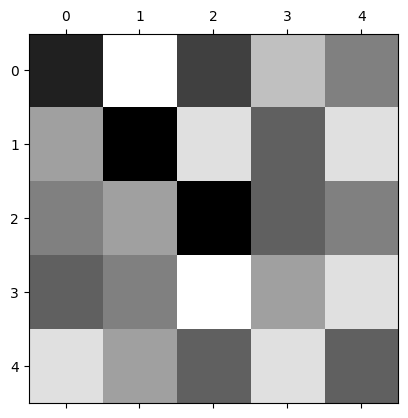

/usr/local/lib/python3.10/dist-packages/matplotlib/animation.py:884: UserWarning: Animation was deleted without rendering anything. This is most likely not intended. To prevent deletion, assign the Animation to a variable, e.g. `anim`, that exists until you output the Animation using `plt.show()` or `anim.save()`.
  warnings.warn(


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# Crear una imagen de 5x5 con valores de ejemplo
image = np.random.randint(1, 10, (5, 5))

# Crear un kernel de 3x3
kernel = np.ones((3, 3))

fig, ax = plt.subplots()
cax = ax.matshow(image, cmap='gray')

def update(frame):
    row = frame // 3
    col = frame % 3
    kernel_area = image[row:row+3, col:col+3]

    ax.clear()
    ax.matshow(image, cmap='gray')
    ax.add_patch(plt.Rectangle((col, row), 3, 3, fill=False, edgecolor='red', lw=3))
    ax.set_title(f"Kernel at position ({row}, {col})")

ani = animation.FuncAnimation(fig, update, frames=9, interval=500)
plt.show()


/usr/local/lib/python3.10/dist-packages/matplotlib/animation.py:884: UserWarning: Animation was deleted without rendering anything. This is most likely not intended. To prevent deletion, assign the Animation to a variable, e.g. `anim`, that exists until you output the Animation using `plt.show()` or `anim.save()`.
  warnings.warn(


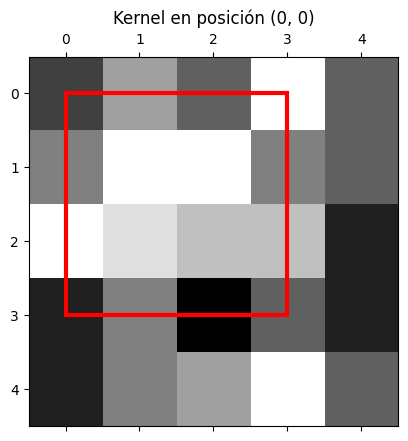

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# Crear una imagen de 5x5 con valores aleatorios
image = np.random.randint(1, 10, (5, 5))

# Crear un kernel de 3x3
kernel = np.ones((3, 3))

# Crear la figura y el subplot
fig, ax = plt.subplots()

# Inicializar la imagen que se va a mostrar
cax = ax.matshow(image, cmap='gray')

def update(frame):
    row = frame // 3
    col = frame % 3
    kernel_area = image[row:row+3, col:col+3]

    # Limpiar el gráfico antes de actualizar
    ax.clear()
    ax.matshow(image, cmap='gray')
    ax.add_patch(plt.Rectangle((col, row), 3, 3, fill=False, edgecolor='red', lw=3))
    ax.set_title(f"Kernel en posición ({row}, {col})")

# Crear la animación
ani = animation.FuncAnimation(fig, update, frames=9, interval=500)

# Mostrar la animación en Google Colab
from IPython.display import HTML
HTML(ani.to_jshtml())


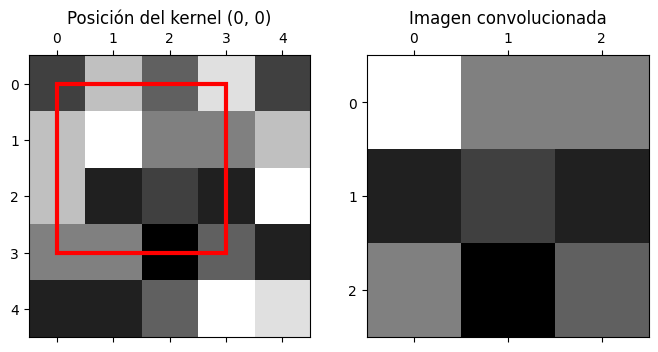

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# Crear una matriz de imagen de 5x5 con valores aleatorios
image = np.random.randint(1, 10, (5, 5))

# Crear un kernel de 3x3 con solo el valor central en 1 y el resto en 0
kernel = np.array([[0, 0, 0],
                   [0, 1, 0],
                   [0, 0, 0]])

# Inicializar la figura y los subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4))

# Mostrar la imagen original en el primer subplot
cax1 = ax1.matshow(image, cmap='gray')
ax1.set_title("Imagen original")

# Inicializar el segundo subplot para mostrar el resultado de la convolución
convolved_image = np.zeros((3, 3))  # La salida tendrá tamaño reducido por el kernel
cax2 = ax2.matshow(convolved_image, cmap='gray')
ax2.set_title("Imagen convolucionada")

# Función para actualizar la animación
def update(frame):
    row = frame // 3
    col = frame % 3
    kernel_area = image[row:row+3, col:col+3]

    # Convolución: multiplicar el área de la imagen por el kernel y sumar
    result = np.sum(kernel_area * kernel)

    # Actualizar el gráfico
    ax1.clear()
    ax2.clear()

    ax1.matshow(image, cmap='gray')
    ax1.add_patch(plt.Rectangle((col, row), 3, 3, fill=False, edgecolor='red', lw=3))
    ax1.set_title(f"Posición del kernel ({row}, {col})")

    # Mostrar el valor convolucionado en la nueva posición
    convolved_image[row, col] = result
    ax2.matshow(convolved_image, cmap='gray')
    ax2.set_title("Imagen convolucionada")

# Crear la animación
ani = animation.FuncAnimation(fig, update, frames=9, interval=500)

# Mostrar la animación en Google Colab
from IPython.display import HTML
HTML(ani.to_jshtml())


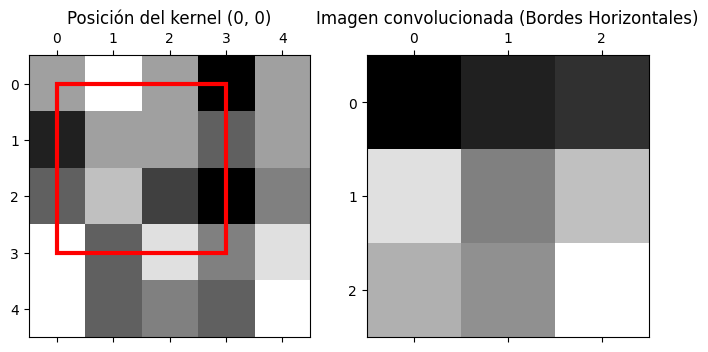

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# Crear una matriz de imagen de 5x5 con valores aleatorios
image = np.random.randint(1, 10, (5, 5))

# Crear un kernel para detección de bordes horizontales
kernel_horizontal_edge = np.array([[-1, -1, -1],
                                   [ 0,  0,  0],
                                   [ 1,  1,  1]])

# Inicializar la figura y los subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4))

# Mostrar la imagen original en el primer subplot
cax1 = ax1.matshow(image, cmap='gray')
ax1.set_title("Imagen original")

# Inicializar el segundo subplot para mostrar el resultado de la convolución
convolved_image = np.zeros((3, 3))  # La salida tendrá tamaño reducido por el kernel
cax2 = ax2.matshow(convolved_image, cmap='gray')
ax2.set_title("Imagen convolucionada")

# Función para actualizar la animación
def update(frame):
    row = frame // 3
    col = frame % 3
    kernel_area = image[row:row+3, col:col+3]

    # Convolución: multiplicar el área de la imagen por el kernel de detección de bordes horizontales y sumar
    result = np.sum(kernel_area * kernel_horizontal_edge)

    # Actualizar el gráfico
    ax1.clear()
    ax2.clear()

    ax1.matshow(image, cmap='gray')
    ax1.add_patch(plt.Rectangle((col, row), 3, 3, fill=False, edgecolor='red', lw=3))
    ax1.set_title(f"Posición del kernel ({row}, {col})")

    # Mostrar el valor convolucionado en la nueva posición
    convolved_image[row, col] = result
    ax2.matshow(convolved_image, cmap='gray')
    ax2.set_title("Imagen convolucionada (Bordes Horizontales)")

# Crear la animación
ani = animation.FuncAnimation(fig, update, frames=9, interval=500)

# Mostrar la animación en Google Colab
from IPython.display import HTML
HTML(ani.to_jshtml())


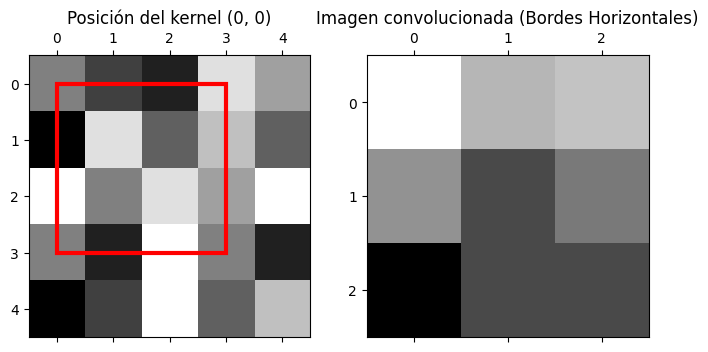

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# Crear una matriz de imagen de 5x5 con valores aleatorios
image = np.random.randint(1, 10, (5, 5))

# Crear un kernel para detección de bordes horizontales
kernel_horizontal_edge = np.array([[-1, -1, -1],
                                   [ 0,  0,  0],
                                   [ 1,  1,  1]])

# Inicializar la figura y los subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4))

# Mostrar la imagen original en el primer subplot
cax1 = ax1.matshow(image, cmap='gray')
ax1.set_title("Imagen original")

# Inicializar el segundo subplot para mostrar el resultado de la convolución
convolved_image = np.zeros((3, 3))  # La salida tendrá tamaño reducido por el kernel
cax2 = ax2.matshow(convolved_image, cmap='gray')
ax2.set_title("Imagen convolucionada")

# Función para actualizar la animación
def update(frame):
    row = frame // 3
    col = frame % 3
    kernel_area = image[row:row+3, col:col+3]

    # Convolución: multiplicar el área de la imagen por el kernel de detección de bordes horizontales y sumar
    result = np.sum(kernel_area * kernel_horizontal_edge)

    # Actualizar el gráfico
    ax1.clear()
    ax2.clear()

    ax1.matshow(image, cmap='gray')
    ax1.add_patch(plt.Rectangle((col, row), 3, 3, fill=False, edgecolor='red', lw=3))
    ax1.set_title(f"Posición del kernel ({row}, {col})")

    # Mostrar el valor convolucionado en la nueva posición
    convolved_image[row, col] = result
    ax2.matshow(convolved_image, cmap='gray')
    ax2.set_title("Imagen convolucionada (Bordes Horizontales)")

# Crear la animación
ani = animation.FuncAnimation(fig, update, frames=9, interval=500)

# Mostrar la animación en Google Colab
from IPython.display import HTML
HTML(ani.to_jshtml())


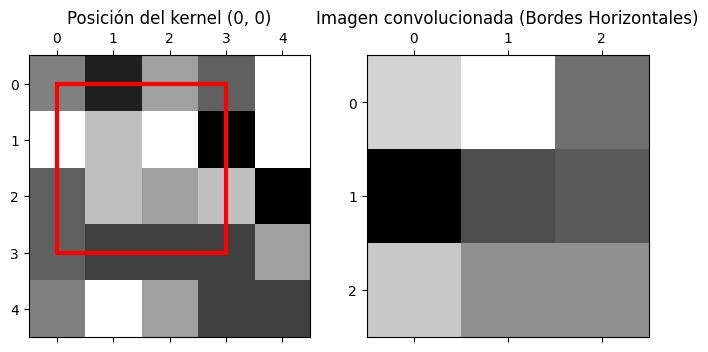

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# Crear una matriz de imagen de 5x5 con valores aleatorios
image = np.random.randint(1, 10, (5, 5))

# Crear un kernel para detección de bordes horizontales
kernel_horizontal_edge = np.array([[-1, -1, -1],
                                   [ 0,  0,  0],
                                   [ 1,  1,  1]])

# Inicializar la figura y los subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4))

# Mostrar la imagen original en el primer subplot
cax1 = ax1.matshow(image, cmap='gray')
ax1.set_title("Imagen original")

# Inicializar el segundo subplot para mostrar el resultado de la convolución
convolved_image = np.zeros((3, 3))  # La salida tendrá tamaño reducido por el kernel
cax2 = ax2.matshow(convolved_image, cmap='gray')
ax2.set_title("Imagen convolucionada")

# Función para actualizar la animación
def update(frame):
    row = frame // 3
    col = frame % 3
    kernel_area = image[row:row+3, col:col+3]

    # Convolución: multiplicar el área de la imagen por el kernel de detección de bordes horizontales y sumar
    result = np.sum(kernel_area * kernel_horizontal_edge)

    # Actualizar el gráfico
    ax1.clear()
    ax2.clear()

    ax1.matshow(image, cmap='gray')
    ax1.add_patch(plt.Rectangle((col, row), 3, 3, fill=False, edgecolor='red', lw=3))
    ax1.set_title(f"Posición del kernel ({row}, {col})")

    # Mostrar el valor convolucionado en la nueva posición
    convolved_image[row, col] = result
    ax2.matshow(convolved_image, cmap='gray')
    ax2.set_title("Imagen convolucionada (Bordes Horizontales)")

# Crear la animación
ani = animation.FuncAnimation(fig, update, frames=9, interval=500)

# Mostrar la animación en Google Colab
from IPython.display import HTML
HTML(ani.to_jshtml())


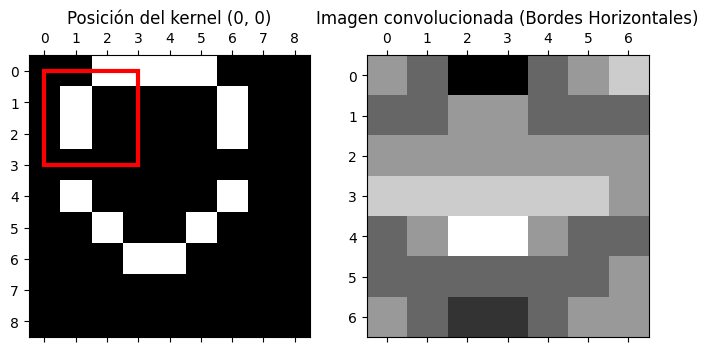

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# Crear una matriz de 9x9 que represente una carita feliz (con 1s para los bordes y 0s para el fondo)
image = np.array([[0, 0, 1, 1, 1, 1, 0, 0, 0],
                  [0, 1, 0, 0, 0, 0, 1, 0, 0],
                  [0, 1, 0, 0, 0, 0, 1, 0, 0],
                  [0, 0, 0, 0, 0, 0, 0, 0, 0],
                  [0, 1, 0, 0, 0, 0, 1, 0, 0],
                  [0, 0, 1, 0, 0, 1, 0, 0, 0],
                  [0, 0, 0, 1, 1, 0, 0, 0, 0],
                  [0, 0, 0, 0, 0, 0, 0, 0, 0],
                  [0, 0, 0, 0, 0, 0, 0, 0, 0]])

# Crear un kernel para detección de bordes horizontales
kernel_horizontal_edge = np.array([[-1, -1, -1],
                                   [ 0,  0,  0],
                                   [ 1,  1,  1]])

# Inicializar la figura y los subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4))

# Mostrar la imagen original en el primer subplot
cax1 = ax1.matshow(image, cmap='gray')
ax1.set_title("Imagen original - Carita feliz")

# Inicializar el segundo subplot para mostrar el resultado de la convolución
convolved_image = np.zeros((7, 7))  # La salida tendrá tamaño reducido por el kernel
cax2 = ax2.matshow(convolved_image, cmap='gray')
ax2.set_title("Imagen convolucionada")

# Función para actualizar la animación
def update(frame):
    row = frame // 7
    col = frame % 7
    kernel_area = image[row:row+3, col:col+3]

    # Convolución: multiplicar el área de la imagen por el kernel de detección de bordes horizontales y sumar
    result = np.sum(kernel_area * kernel_horizontal_edge)

    # Actualizar el gráfico
    ax1.clear()
    ax2.clear()

    ax1.matshow(image, cmap='gray')
    ax1.add_patch(plt.Rectangle((col, row), 3, 3, fill=False, edgecolor='red', lw=3))
    ax1.set_title(f"Posición del kernel ({row}, {col})")

    # Mostrar el valor convolucionado en la nueva posición
    convolved_image[row, col] = result
    ax2.matshow(convolved_image, cmap='gray')
    ax2.set_title("Imagen convolucionada (Bordes Horizontales)")

# Crear la animación
ani = animation.FuncAnimation(fig, update, frames=49, interval=500)

# Mostrar la animación en Google Colab
from IPython.display import HTML
HTML(ani.to_jshtml())


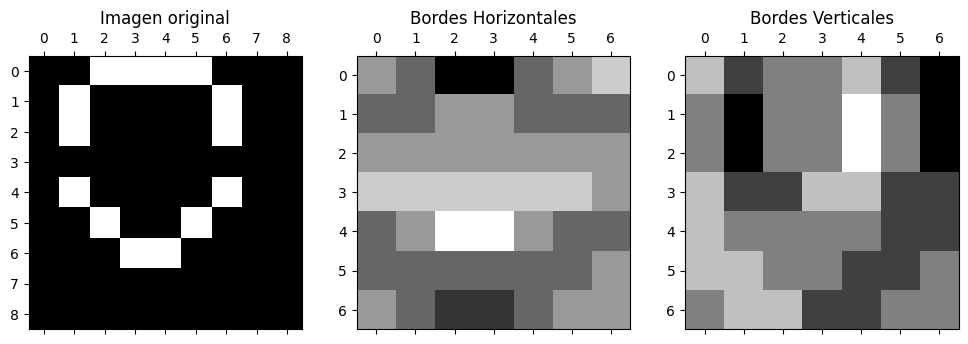

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Crear una matriz de 9x9 que represente una carita feliz (con 1s para los bordes y 0s para el fondo)
image = np.array([[0, 0, 1, 1, 1, 1, 0, 0, 0],
                  [0, 1, 0, 0, 0, 0, 1, 0, 0],
                  [0, 1, 0, 0, 0, 0, 1, 0, 0],
                  [0, 0, 0, 0, 0, 0, 0, 0, 0],
                  [0, 1, 0, 0, 0, 0, 1, 0, 0],
                  [0, 0, 1, 0, 0, 1, 0, 0, 0],
                  [0, 0, 0, 1, 1, 0, 0, 0, 0],
                  [0, 0, 0, 0, 0, 0, 0, 0, 0],
                  [0, 0, 0, 0, 0, 0, 0, 0, 0]])

# Crear kernels para detección de bordes horizontales y verticales
kernel_horizontal_edge = np.array([[-1, -1, -1],
                                   [ 0,  0,  0],
                                   [ 1,  1,  1]])

kernel_vertical_edge = np.array([[-1, 0, 1],
                                 [-1, 0, 1],
                                 [-1, 0, 1]])

# Inicializar las matrices convolucionadas para almacenar los resultados
convolved_horizontal = np.zeros((7, 7))
convolved_vertical = np.zeros((7, 7))

# Aplicar los kernels a la imagen original
for row in range(7):
    for col in range(7):
        kernel_area = image[row:row+3, col:col+3]
        convolved_horizontal[row, col] = np.sum(kernel_area * kernel_horizontal_edge)
        convolved_vertical[row, col] = np.sum(kernel_area * kernel_vertical_edge)

# Crear la figura y los subplots para mostrar las tres matrices
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 4))

# Mostrar la imagen original
ax1.matshow(image, cmap='gray')
ax1.set_title("Imagen original")

# Mostrar la imagen convolucionada con detección de bordes horizontales
ax2.matshow(convolved_horizontal, cmap='gray')
ax2.set_title("Bordes Horizontales")

# Mostrar la imagen convolucionada con detección de bordes verticales
ax3.matshow(convolved_vertical, cmap='gray')
ax3.set_title("Bordes Verticales")

# Mostrar la figura
plt.show()


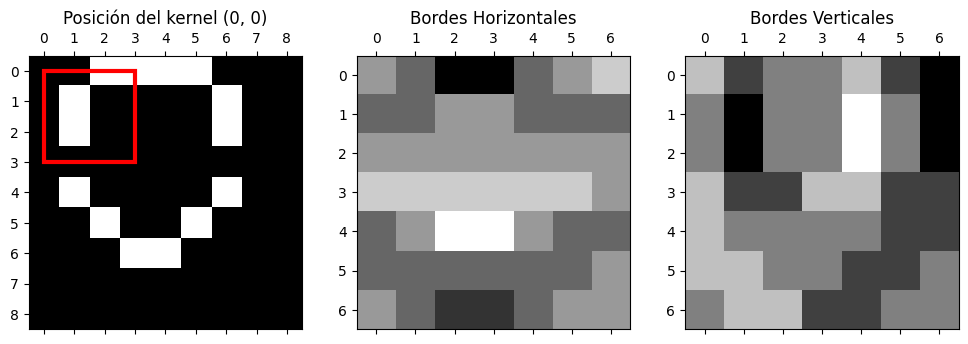

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# Crear una matriz de 9x9 que represente una carita feliz (con 1s para los bordes y 0s para el fondo)
image = np.array([[0, 0, 1, 1, 1, 1, 0, 0, 0],
                  [0, 1, 0, 0, 0, 0, 1, 0, 0],
                  [0, 1, 0, 0, 0, 0, 1, 0, 0],
                  [0, 0, 0, 0, 0, 0, 0, 0, 0],
                  [0, 1, 0, 0, 0, 0, 1, 0, 0],
                  [0, 0, 1, 0, 0, 1, 0, 0, 0],
                  [0, 0, 0, 1, 1, 0, 0, 0, 0],
                  [0, 0, 0, 0, 0, 0, 0, 0, 0],
                  [0, 0, 0, 0, 0, 0, 0, 0, 0]])

# Crear kernels para detección de bordes horizontales y verticales
kernel_horizontal_edge = np.array([[-1, -1, -1],
                                   [ 0,  0,  0],
                                   [ 1,  1,  1]])

kernel_vertical_edge = np.array([[-1, 0, 1],
                                 [-1, 0, 1],
                                 [-1, 0, 1]])

# Inicializar las matrices convolucionadas para almacenar los resultados
convolved_horizontal = np.zeros((7, 7))
convolved_vertical = np.zeros((7, 7))

# Inicializar la figura y los subplots para mostrar las tres imágenes
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 4))

# Mostrar la imagen original
cax1 = ax1.matshow(image, cmap='gray')
ax1.set_title("Imagen original")

# Mostrar la imagen convolucionada con detección de bordes horizontales y verticales
cax2 = ax2.matshow(convolved_horizontal, cmap='gray')
ax2.set_title("Bordes Horizontales")

cax3 = ax3.matshow(convolved_vertical, cmap='gray')
ax3.set_title("Bordes Verticales")

# Función para actualizar la animación
def update(frame):
    row = frame // 7
    col = frame % 7
    kernel_area = image[row:row+3, col:col+3]

    # Convolución: multiplicar el área de la imagen por ambos kernels y sumar
    result_horizontal = np.sum(kernel_area * kernel_horizontal_edge)
    result_vertical = np.sum(kernel_area * kernel_vertical_edge)

    # Actualizar el gráfico de la imagen original
    ax1.clear()
    ax1.matshow(image, cmap='gray')
    ax1.add_patch(plt.Rectangle((col, row), 3, 3, fill=False, edgecolor='red', lw=3))
    ax1.set_title(f"Posición del kernel ({row}, {col})")

    # Actualizar los gráficos de las imágenes convolucionadas
    convolved_horizontal[row, col] = result_horizontal
    convolved_vertical[row, col] = result_vertical

    ax2.clear()
    ax2.matshow(convolved_horizontal, cmap='gray')
    ax2.set_title("Bordes Horizontales")

    ax3.clear()
    ax3.matshow(convolved_vertical, cmap='gray')
    ax3.set_title("Bordes Verticales")

# Crear la animación
ani = animation.FuncAnimation(fig, update, frames=49, interval=500)

# Mostrar la animación en Google Colab
from IPython.display import HTML
HTML(ani.to_jshtml())


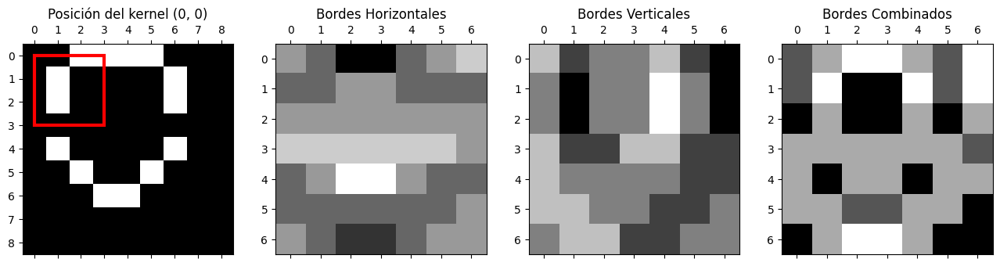

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# Crear una matriz de 9x9 que represente una carita feliz (con 1s para los bordes y 0s para el fondo)
image = np.array([[0, 0, 1, 1, 1, 1, 0, 0, 0],
                  [0, 1, 0, 0, 0, 0, 1, 0, 0],
                  [0, 1, 0, 0, 0, 0, 1, 0, 0],
                  [0, 0, 0, 0, 0, 0, 0, 0, 0],
                  [0, 1, 0, 0, 0, 0, 1, 0, 0],
                  [0, 0, 1, 0, 0, 1, 0, 0, 0],
                  [0, 0, 0, 1, 1, 0, 0, 0, 0],
                  [0, 0, 0, 0, 0, 0, 0, 0, 0],
                  [0, 0, 0, 0, 0, 0, 0, 0, 0]])

# Crear kernels para detección de bordes horizontales y verticales
kernel_horizontal_edge = np.array([[-1, -1, -1],
                                   [ 0,  0,  0],
                                   [ 1,  1,  1]])

kernel_vertical_edge = np.array([[-1, 0, 1],
                                 [-1, 0, 1],
                                 [-1, 0, 1]])

# Inicializar las matrices convolucionadas para almacenar los resultados
convolved_horizontal = np.zeros((7, 7))
convolved_vertical = np.zeros((7, 7))
convolved_combined = np.zeros((7, 7))  # Para la combinación de bordes

# Inicializar la figura y los subplots para mostrar las cuatro imágenes
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(16, 4))

# Mostrar la imagen original
cax1 = ax1.matshow(image, cmap='gray')
ax1.set_title("Imagen original")

# Mostrar la imagen convolucionada con detección de bordes horizontales y verticales
cax2 = ax2.matshow(convolved_horizontal, cmap='gray')
ax2.set_title("Bordes Horizontales")

cax3 = ax3.matshow(convolved_vertical, cmap='gray')
ax3.set_title("Bordes Verticales")

# Mostrar la imagen con la combinación de los bordes
cax4 = ax4.matshow(convolved_combined, cmap='gray')
ax4.set_title("Bordes Combinados")

# Función para actualizar la animación
def update(frame):
    row = frame // 7
    col = frame % 7
    kernel_area = image[row:row+3, col:col+3]

    # Convolución: multiplicar el área de la imagen por ambos kernels y sumar
    result_horizontal = np.sum(kernel_area * kernel_horizontal_edge)
    result_vertical = np.sum(kernel_area * kernel_vertical_edge)

    # Actualizar el gráfico de la imagen original
    ax1.clear()
    ax1.matshow(image, cmap='gray')
    ax1.add_patch(plt.Rectangle((col, row), 3, 3, fill=False, edgecolor='red', lw=3))
    ax1.set_title(f"Posición del kernel ({row}, {col})")

    # Actualizar los gráficos de las imágenes convolucionadas
    convolved_horizontal[row, col] = result_horizontal
    convolved_vertical[row, col] = result_vertical
    convolved_combined[row, col] = abs(result_horizontal) + abs(result_vertical)  # Combinar bordes

    ax2.clear()
    ax2.matshow(convolved_horizontal, cmap='gray')
    ax2.set_title("Bordes Horizontales")

    ax3.clear()
    ax3.matshow(convolved_vertical, cmap='gray')
    ax3.set_title("Bordes Verticales")

    ax4.clear()
    ax4.matshow(convolved_combined, cmap='gray')
    ax4.set_title("Bordes Combinados")

# Crear la animación
ani = animation.FuncAnimation(fig, update, frames=49, interval=500)

# Mostrar la animación en Google Colab
from IPython.display import HTML
HTML(ani.to_jshtml())


In [ ]:
!cp -r /content/drive/MyDrive/dataset /content/

In [ ]:
import os

# Ruta a las carpetas del dataset
dataset_path = '/content/dataset/CANCER'

# Subcarpetas del dataset
folders = ['all_benign', 'all_early', 'all_pre', 'all_pro']
image_count = {}

# Contar el número de archivos en cada subcarpeta
for folder in folders:
    folder_path = os.path.join(dataset_path, folder)
    image_count[folder] = len(os.listdir(folder_path))

# Mostrar el resultado
image_count


{'all_benign': 5000, 'all_early': 5000, 'all_pre': 5000, 'all_pro': 5000}

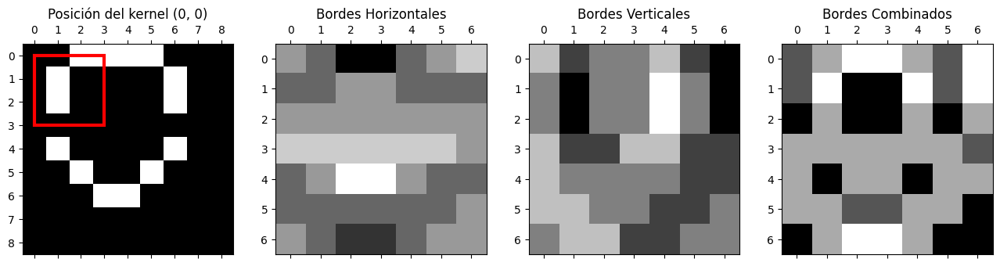

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# Crear una matriz de 9x9 que represente una carita feliz (con 1s para los bordes y 0s para el fondo)
image = np.array([[0, 0, 1, 1, 1, 1, 0, 0, 0],
                  [0, 1, 0, 0, 0, 0, 1, 0, 0],
                  [0, 1, 0, 0, 0, 0, 1, 0, 0],
                  [0, 0, 0, 0, 0, 0, 0, 0, 0],
                  [0, 1, 0, 0, 0, 0, 1, 0, 0],
                  [0, 0, 1, 0, 0, 1, 0, 0, 0],
                  [0, 0, 0, 1, 1, 0, 0, 0, 0],
                  [0, 0, 0, 0, 0, 0, 0, 0, 0],
                  [0, 0, 0, 0, 0, 0, 0, 0, 0]])

# Crear kernels para detección de bordes horizontales y verticales
kernel_horizontal_edge = np.array([[-1, -1, -1],
                                   [ 0,  0,  0],
                                   [ 1,  1,  1]])

kernel_vertical_edge = np.array([[-1, 0, 1],
                                 [-1, 0, 1],
                                 [-1, 0, 1]])

# Inicializar las matrices convolucionadas para almacenar los resultados
convolved_horizontal = np.zeros((7, 7))
convolved_vertical = np.zeros((7, 7))
convolved_combined = np.zeros((7, 7))  # Para la combinación de bordes

# Inicializar la figura y los subplots para mostrar las cuatro imágenes
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(16, 4))

# Mostrar la imagen original
cax1 = ax1.matshow(image, cmap='gray')
ax1.set_title("Imagen original")

# Mostrar la imagen convolucionada con detección de bordes horizontales y verticales
cax2 = ax2.matshow(convolved_horizontal, cmap='gray')
ax2.set_title("Bordes Horizontales")

cax3 = ax3.matshow(convolved_vertical, cmap='gray')
ax3.set_title("Bordes Verticales")

# Mostrar la imagen con la combinación de los bordes
cax4 = ax4.matshow(convolved_combined, cmap='gray')
ax4.set_title("Bordes Combinados")

# Función para actualizar la animación
def update(frame):
    row = frame // 7
    col = frame % 7
    kernel_area = image[row:row+3, col:col+3]

    # Convolución: multiplicar el área de la imagen por ambos kernels y sumar
    result_horizontal = np.sum(kernel_area * kernel_horizontal_edge)
    result_vertical = np.sum(kernel_area * kernel_vertical_edge)

    # Actualizar el gráfico de la imagen original
    ax1.clear()
    ax1.matshow(image, cmap='gray')
    ax1.add_patch(plt.Rectangle((col, row), 3, 3, fill=False, edgecolor='red', lw=3))
    ax1.set_title(f"Posición del kernel ({row}, {col})")

    # Actualizar los gráficos de las imágenes convolucionadas
    convolved_horizontal[row, col] = result_horizontal
    convolved_vertical[row, col] = result_vertical
    convolved_combined[row, col] = abs(result_horizontal) + abs(result_vertical)  # Combinar bordes

    ax2.clear()
    ax2.matshow(convolved_horizontal, cmap='gray')
    ax2.set_title("Bordes Horizontales")

    ax3.clear()
    ax3.matshow(convolved_vertical, cmap='gray')
    ax3.set_title("Bordes Verticales")

    ax4.clear()
    ax4.matshow(convolved_combined, cmap='gray')
    ax4.set_title("Bordes Combinados")

# Crear la animación
ani = animation.FuncAnimation(fig, update, frames=49, interval=500)

# Mostrar la animación en Google Colab
from IPython.display import HTML
HTML(ani.to_jshtml())


KeyboardInterrupt: 

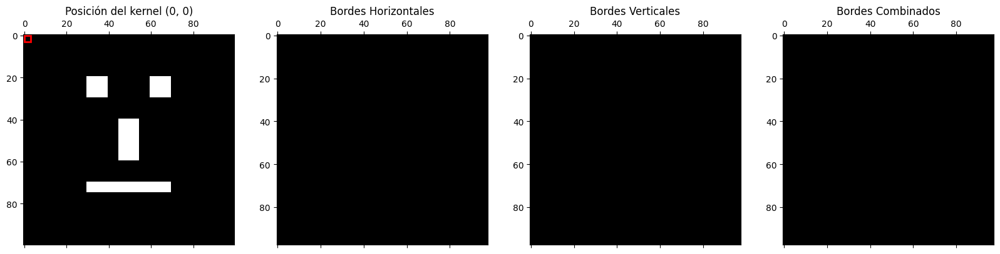

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# Crear una matriz de 100x100 que represente una carita más detallada
image = np.zeros((100, 100))

# Dibujar ojos (círculos)
image[20:30, 30:40] = 1  # Ojo izquierdo
image[20:30, 60:70] = 1  # Ojo derecho

# Dibujar nariz (recta vertical)
image[40:60, 45:55] = 1

# Dibujar boca (recta horizontal)
image[70:75, 30:70] = 1

# Crear kernels para detección de bordes horizontales y verticales
kernel_horizontal_edge = np.array([[-1, -1, -1],
                                   [ 0,  0,  0],
                                   [ 1,  1,  1]])

kernel_vertical_edge = np.array([[-1, 0, 1],
                                 [-1, 0, 1],
                                 [-1, 0, 1]])

# Inicializar las matrices convolucionadas para almacenar los resultados
convolved_horizontal = np.zeros((98, 98))
convolved_vertical = np.zeros((98, 98))
convolved_combined = np.zeros((98, 98))  # Para la combinación de bordes

# Inicializar la figura y los subplots para mostrar las cuatro imágenes
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20, 5))

# Mostrar la imagen original
cax1 = ax1.matshow(image, cmap='gray')
ax1.set_title("Imagen original (Carita)")

# Mostrar la imagen convolucionada con detección de bordes horizontales y verticales
cax2 = ax2.matshow(convolved_horizontal, cmap='gray')
ax2.set_title("Bordes Horizontales")

cax3 = ax3.matshow(convolved_vertical, cmap='gray')
ax3.set_title("Bordes Verticales")

# Mostrar la imagen con la combinación de los bordes
cax4 = ax4.matshow(convolved_combined, cmap='gray')
ax4.set_title("Bordes Combinados")

# Función para actualizar la animación
def update(frame):
    row = frame // 98
    col = frame % 98
    kernel_area = image[row:row+3, col:col+3]

    # Convolución: multiplicar el área de la imagen por ambos kernels y sumar
    result_horizontal = np.sum(kernel_area * kernel_horizontal_edge)
    result_vertical = np.sum(kernel_area * kernel_vertical_edge)

    # Actualizar el gráfico de la imagen original
    ax1.clear()
    ax1.matshow(image, cmap='gray')
    ax1.add_patch(plt.Rectangle((col, row), 3, 3, fill=False, edgecolor='red', lw=2))
    ax1.set_title(f"Posición del kernel ({row}, {col})")

    # Actualizar los gráficos de las imágenes convolucionadas
    convolved_horizontal[row, col] = result_horizontal
    convolved_vertical[row, col] = result_vertical
    convolved_combined[row, col] = abs(result_horizontal) + abs(result_vertical)  # Combinar bordes

    ax2.clear()
    ax2.matshow(convolved_horizontal, cmap='gray')
    ax2.set_title("Bordes Horizontales")

    ax3.clear()
    ax3.matshow(convolved_vertical, cmap='gray')
    ax3.set_title("Bordes Verticales")

    ax4.clear()
    ax4.matshow(convolved_combined, cmap='gray')
    ax4.set_title("Bordes Combinados")

# Crear la animación
ani = animation.FuncAnimation(fig, update, frames=98*98, interval=10)

# Mostrar la animación en Google Colab
from IPython.display import HTML
HTML(ani.to_jshtml())


In [ ]:

import tensorflow as tf
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))


Num GPUs Available:  1


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# Crear una matriz de 75x75 que represente una carita más detallada
image = np.zeros((75, 75))

# Dibujar el contorno redondo de la carita (aproximado)
for i in range(75):
    for j in range(75):
        if (i - 37)**2 + (j - 37)**2 <= 36**2:  # Ecuación de un círculo centrado en (37, 37)
            image[i, j] = 1

# Dibujar ojos (más pequeños y delgados)
image[15:18, 25:30] = 0  # Ojo izquierdo
image[15:18, 45:50] = 0  # Ojo derecho

# Dibujar nariz (recta vertical)
image[30:45, 35:40] = 0

# Dibujar boca (recta horizontal)
image[55:58, 25:50] = 0

# Crear kernels para detección de bordes horizontales y verticales
kernel_horizontal_edge = np.array([[-1, -1, -1],
                                   [ 0,  0,  0],
                                   [ 1,  1,  1]])

kernel_vertical_edge = np.array([[-1, 0, 1],
                                 [-1, 0, 1],
                                 [-1, 0, 1]])

# Inicializar las matrices convolucionadas para almacenar los resultados
convolved_horizontal = np.zeros((73, 73))
convolved_vertical = np.zeros((73, 73))
convolved_combined = np.zeros((73, 73))  # Para la combinación de bordes

# Inicializar la figura y los subplots para mostrar las cuatro imágenes
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20, 5))

# Mostrar la imagen original
cax1 = ax1.matshow(image, cmap='gray')
ax1.set_title("Imagen original (Carita)")

# Mostrar la imagen convolucionada con detección de bordes horizontales y verticales
cax2 = ax2.matshow(convolved_horizontal, cmap='gray')
ax2.set_title("Bordes Horizontales")

cax3 = ax3.matshow(convolved_vertical, cmap='gray')
ax3.set_title("Bordes Verticales")

# Mostrar la imagen con la combinación de los bordes
cax4 = ax4.matshow(convolved_combined, cmap='gray')
ax4.set_title("Bordes Combinados")

# Función para actualizar la animación
def update(frame):
    row = frame // 73
    col = frame % 73
    kernel_area = image[row:row+3, col:col+3]

    # Convolución: multiplicar el área de la imagen por ambos kernels y sumar
    result_horizontal = np.sum(kernel_area * kernel_horizontal_edge)
    result_vertical = np.sum(kernel_area * kernel_vertical_edge)

    # Actualizar el gráfico de la imagen original
    ax1.clear()
    ax1.matshow(image, cmap='gray')
    ax1.add_patch(plt.Rectangle((col, row), 3, 3, fill=False, edgecolor='red', lw=2))
    ax1.set_title(f"Posición del kernel ({row}, {col})")

    # Actualizar los gráficos de las imágenes convolucionadas
    convolved_horizontal[row, col] = result_horizontal
    convolved_vertical[row, col] = result_vertical
    convolved_combined[row, col] = abs(result_horizontal) + abs(result_vertical)  # Combinar bordes

    ax2.clear()
    ax2.matshow(convolved_horizontal, cmap='gray')
    ax2.set_title("Bordes Horizontales")

    ax3.clear()
    ax3.matshow(convolved_vertical, cmap='gray')
    ax3.set_title("Bordes Verticales")

    ax4.clear()
    ax4.matshow(convolved_combined, cmap='gray')
    ax4.set_title("Bordes Combinados")

# Crear la animación
ani = animation.FuncAnimation(fig, update, frames=73*73, interval=10)

# Mostrar la animación en Google Colab
from IPython.display import HTML
HTML(ani.to_jshtml())


KeyboardInterrupt: 

Error in callback <function flush_figures at 0x7d84f46b41f0> (for post_execute):


KeyboardInterrupt: 

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Paso 1: Cargar el dataset CIFAR-10
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

# Paso 2: Preprocesar los datos
X_train = X_train.astype('float32') / 255.0
X_test = X_test.astype('float32') / 255.0

# Convertir las etiquetas a formato categórico (one-hot encoding)
y_train = to_categorical(y_train, 10)
y_test = to_categorical(y_test, 10)

# Aumento de datos
datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True
)

# Ajustar el generador de imágenes a los datos de entrenamiento
datagen.fit(X_train)

# Función para reducir la tasa de aprendizaje durante el entrenamiento
def scheduler(epoch, lr):
    if epoch < 30:
        return float(lr)
    else:
        return float(lr * tf.math.exp(-0.05))

# Modelo (similar al anterior que funcionó bien)
model = Sequential()

# Primer bloque de capas convolucionales
model.add(Conv2D(64, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002), input_shape=(32, 32, 3)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Segundo bloque de capas convolucionales
model.add(Conv2D(128, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Tercer bloque de capas convolucionales
model.add(Conv2D(256, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Cuarto bloque de capas convolucionales
model.add(Conv2D(512, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(Dropout(0.4))

# Aplanar la salida de las capas convolucionales
model.add(Flatten())

# Capas densas finales
model.add(Dense(512, activation='relu', kernel_regularizer=l2(0.002)))
model.add(Dropout(0.4))

model.add(Dense(10, activation='softmax'))

# Paso 4: Compilar el modelo
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Paso 5: Implementar Early Stopping y Learning Rate Scheduler
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
lr_scheduler = LearningRateScheduler(scheduler)

# Paso 6: Entrenar el modelo con aumento de datos menos agresivo
history = model.fit(datagen.flow(X_train, y_train, batch_size=64),
                    epochs=100,  # Continuamos con 100 épocas
                    validation_data=(X_test, y_test),
                    verbose=1,
                    callbacks=[early_stopping, lr_scheduler])

# Guardar el modelo completo al final del entrenamiento
model.save('modelo_mejorado_v6.h5')
print("Modelo guardado exitosamente como 'modelo_mejorado_v6.h5'")

# Paso 7: Evaluar el modelo
test_loss, test_acc = model.evaluate(X_test, y_test, verbose=2)
print(f"\nTest accuracy: {test_acc}")

# Graficar los resultados
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train accuracy')
plt.plot(history.history['val_accuracy'], label='Test accuracy')
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train loss')
plt.plot(history.history['val_loss'], label='Test loss')
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()


170498071/170498071 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


KeyboardInterrupt: 

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.utils import to_categorical

# Paso 1: Cargar el dataset CIFAR-10
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

# Preprocesar los datos
X_train = X_train.astype('float32') / 255.0
X_test = X_test.astype('float32') / 255.0
y_train = to_categorical(y_train, 10)
y_test = to_categorical(y_test, 10)

# Crear el modelo
model = Sequential([
    Conv2D(64, (3, 3), padding='same', activation='relu', input_shape=(32, 32, 3)),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.4),

    Conv2D(128, (3, 3), padding='same', activation='relu'),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.4),

    Conv2D(256, (3, 3), padding='same', activation='relu'),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.4),

    Flatten(),
    Dense(512, activation='relu'),
    Dropout(0.4),
    Dense(10, activation='softmax')
])

# Compilar el modelo
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenar el modelo
model.fit(X_train, y_train, epochs=5, validation_data=(X_test, y_test))

# Guardar todo el modelo (arquitectura, pesos, y compilación)
model.save('modelo_completo.h5')
print("Modelo completo guardado exitosamente")

# Cargar el modelo completo para su uso futuro
nuevo_modelo = tf.keras.models.load_model('modelo_completo.h5')

# Evaluar el modelo cargado para confirmar que se ha cargado correctamente
loss, accuracy = nuevo_modelo.evaluate(X_test, y_test)
print(f"Precisión del modelo cargado: {accuracy:.4f}")


170498071/170498071 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 28s 12ms/step - accuracy: 0.3420 - loss: 2.0730 - val_accuracy: 0.4344 - val_loss: 1.8222
Epoch 2/5
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - accuracy: 0.5207 - loss: 1.3444 - val_accuracy: 0.5661 - val_loss: 1.2399
Epoch 3/5
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - accuracy: 0.5937 - loss: 1.1545 - val_accuracy: 0.5450 - val_loss: 1.3005
Epoch 4/5
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.6313 - loss: 1.0678 - val_accuracy: 0.6908 - val_loss: 0.9094
Epoch 5/5
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step - accuracy: 0.6571 - loss: 1.0021 - val_accuracy: 0.6751 - val_loss: 0.9826


Modelo completo guardado exitosamente
313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.6693 - loss: 0.9845
Precisión del modelo cargado: 0.6751


Epoch 1/100
782/782 ━━━━━━━━━━━━━━━━━━━━ 110s 57ms/step - accuracy: 0.2505 - loss: 5.3837 - val_accuracy: 0.2790 - val_loss: 5.7278 - learning_rate: 1.0000e-04
Epoch 2/100
782/782 ━━━━━━━━━━━━━━━━━━━━ 83s 63ms/step - accuracy: 0.4091 - loss: 3.9959 - val_accuracy: 0.3133 - val_loss: 5.4679 - learning_rate: 1.0000e-04
Epoch 3/100
782/782 ━━━━━━━━━━━━━━━━━━━━ 71s 49ms/step - accuracy: 0.4625 - loss: 3.3250 - val_accuracy: 0.3910 - val_loss: 4.4716 - learning_rate: 1.0000e-04
Epoch 4/100
782/782 ━━━━━━━━━━━━━━━━━━━━ 37s 47ms/step - accuracy: 0.5019 - loss: 2.9225 - val_accuracy: 0.3635 - val_loss: 5.2344 - learning_rate: 1.0000e-04
Epoch 5/100
782/782 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step - accuracy: 0.5259 - loss: 2.6502 - val_accuracy: 0.4457 - val_loss: 3.7765 - learning_rate: 1.0000e-04
Epoch 6/100
782/782 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step - accuracy: 0.5452 - loss: 2.4338 - val_accuracy: 0.3999 - val_loss: 3.8880 - learning_rate: 1.0000e-04
Epoch 7/100
782/782 ━━━━━━━━━━━━━━━━━━━━ 38s 

Modelo guardado exitosamente como 'modelo_mejorado_v6.h5'
313/313 - 1s - 2ms/step - accuracy: 0.8492 - loss: 0.7257

Test accuracy: 0.8492000102996826


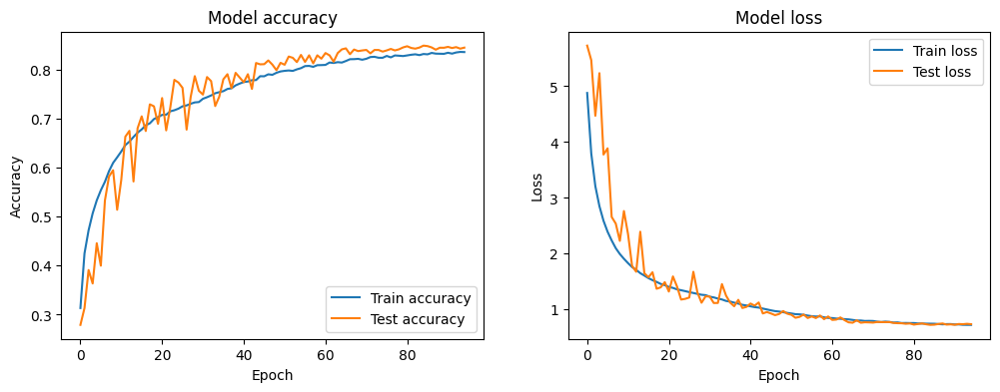

Modelo cargado exitosamente.
313/313 - 3s - 10ms/step - accuracy: 0.8492 - loss: 0.7257

Precisión del modelo cargado: 0.8492000102996826


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Paso 1: Cargar el dataset CIFAR-10
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

# Paso 2: Preprocesar los datos
X_train = X_train.astype('float32') / 255.0
X_test = X_test.astype('float32') / 255.0

# Convertir las etiquetas a formato categórico (one-hot encoding)
y_train = to_categorical(y_train, 10)
y_test = to_categorical(y_test, 10)

# Aumento de datos
datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True
)

# Ajustar el generador de imágenes a los datos de entrenamiento
datagen.fit(X_train)

# Función para reducir la tasa de aprendizaje durante el entrenamiento
def scheduler(epoch, lr):
    if epoch < 30:
        return float(lr)
    else:
        return float(lr * tf.math.exp(-0.05))

# Modelo (similar al anterior que funcionó bien)
model = Sequential()

# Primer bloque de capas convolucionales
model.add(Conv2D(64, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002), input_shape=(32, 32, 3)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Segundo bloque de capas convolucionales
model.add(Conv2D(128, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Tercer bloque de capas convolucionales
model.add(Conv2D(256, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Cuarto bloque de capas convolucionales
model.add(Conv2D(512, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(Dropout(0.4))

# Aplanar la salida de las capas convolucionales
model.add(Flatten())

# Capas densas finales
model.add(Dense(512, activation='relu', kernel_regularizer=l2(0.002)))
model.add(Dropout(0.4))

model.add(Dense(10, activation='softmax'))

# Paso 4: Compilar el modelo
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Paso 5: Implementar Early Stopping y Learning Rate Scheduler
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
lr_scheduler = LearningRateScheduler(scheduler)

# Paso 6: Entrenar el modelo con aumento de datos menos agresivo
history = model.fit(datagen.flow(X_train, y_train, batch_size=64),
                    epochs=100,  # Continuamos con 100 épocas
                    validation_data=(X_test, y_test),
                    verbose=1,
                    callbacks=[early_stopping, lr_scheduler])

# Guardar el modelo completo al final del entrenamiento
model.save('modelo_mejorado_v6.h5')
print("Modelo guardado exitosamente como 'modelo_mejorado_v6.h5'")

# Paso 7: Evaluar el modelo
test_loss, test_acc = model.evaluate(X_test, y_test, verbose=2)
print(f"\nTest accuracy: {test_acc}")

# Graficar los resultados
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train accuracy')
plt.plot(history.history['val_accuracy'], label='Test accuracy')
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train loss')
plt.plot(history.history['val_loss'], label='Test loss')
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()

# Cargar el modelo en otro código si se requiere en el futuro
# Para usar el modelo sin volver a entrenar:
nuevo_modelo = tf.keras.models.load_model('modelo_mejorado_v6.h5')
print("Modelo cargado exitosamente.")

# Evaluar el modelo cargado para confirmar que se ha cargado correctamente
nuevo_modelo_loss, nuevo_modelo_acc = nuevo_modelo.evaluate(X_test, y_test, verbose=2)
print(f"\nPrecisión del modelo cargado: {nuevo_modelo_acc}")

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.imagenet_utils import preprocess_input
import numpy as np
import random
import os
import matplotlib.pyplot as plt

# Paso 1: Cargar el modelo y los pesos guardados
model = Sequential([
    Conv2D(64, (3, 3), padding='same', activation='relu', input_shape=(32, 32, 3)),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.4),

    Conv2D(128, (3, 3), padding='same', activation='relu'),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.4),

    Conv2D(256, (3, 3), padding='same', activation='relu'),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.4),

    Flatten(),
    Dense(512, activation='relu'),
    Dropout(0.4),
    Dense(4, activation='softmax')  # 4 clases: all_benign, all_early, all_pre, all_pro
])

# Cargar los pesos guardados
model.load_weights('pesos_modelo_cancer.h5')
print("Pesos del modelo cargados exitosamente")

# Paso 2: Definir las rutas de las subcarpetas
dataset_path = '/content/drive/MyDrive/dataset/CANCER'  # Cambia a la ruta de tu dataset
clases = ['all_benign', 'all_early', 'all_pre', 'all_pro']

# Paso 3: Escoger una imagen al azar de una de las 4 subcarpetas
clase_azar = random.choice(clases)
carpeta = os.path.join(dataset_path, clase_azar)
imagen_azar = random.choice(os.listdir(carpeta))
ruta_imagen = os.path.join(carpeta, imagen_azar)

# Paso 4: Cargar y preprocesar la imagen
img = image.load_img(ruta_imagen, target_size=(32, 32))  # Cambiar tamaño a 32x32
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)  # Añadir una dimensión extra para el batch
img_array = preprocess_input(img_array)  # Normalizar la imagen

# Paso 5: Predecir a qué clase pertenece la imagen
predicciones = model.predict(img_array)
predicciones_softmax = tf.nn.softmax(predicciones[0]).numpy()  # Convertir a porcentajes con softmax

# Paso 6: Mostrar los resultados
predicciones_porcentaje = {clase: f"{porcentaje*100:.2f}%" for clase, porcentaje in zip(clases, predicciones_softmax)}

# Mostrar la imagen seleccionada
plt.imshow(image.load_img(ruta_imagen))
plt.axis('off')
plt.title(f"Predicciones:\n {predicciones_porcentaje}")
plt.show()

# Paso 7: Verificar si el modelo acertó la predicción
clase_predicha = clases[np.argmax(predicciones_softmax)]  # Clase con la mayor probabilidad
print(f"\nLa clase predicha es: {clase_predicha}")
print(f"La imagen seleccionada pertenece a la carpeta: {clase_azar}")

# Comprobar si el modelo acertó
if clase_predicha == clase_azar:
    print("¡El modelo acertó la predicción!")
else:
    print("El modelo NO acertó la predicción.")

# Imprimir las predicciones de la red neuronal
print("\nResultados de la red neuronal por porcentaje para cada clase:")
for clase, porcentaje in predicciones_porcentaje.items():
    print(f"{clase}: {porcentaje}")


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


FileNotFoundError: [Errno 2] Unable to synchronously open file (unable to open file: name = 'pesos_modelo_cancer.h5', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

Modelo cargado exitosamente
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


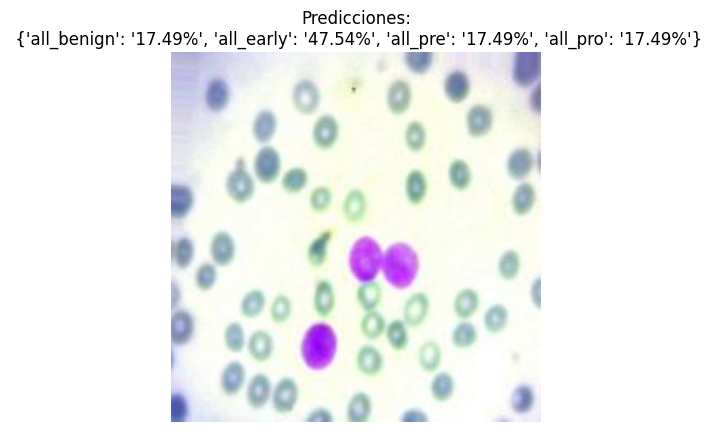


La clase predicha es: all_early
La imagen seleccionada pertenece a la carpeta: all_pro
El modelo NO acertó la predicción.

Resultados de la red neuronal por porcentaje para cada clase:
all_benign: 17.49%
all_early: 47.54%
all_pre: 17.49%
all_pro: 17.49%


In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.imagenet_utils import preprocess_input
import numpy as np
import random
import os
import matplotlib.pyplot as plt

# Paso 1: Cargar el modelo completo guardado
model = tf.keras.models.load_model('modelo_mejorado_v6.h5')  # O usa 'modelo_completo.h5' si prefieres

print("Modelo cargado exitosamente")

# Paso 2: Definir las rutas de las subcarpetas
dataset_path = '/content/dataset/CANCER'  # Cambia a la ruta de tu dataset
clases = ['all_benign', 'all_early', 'all_pre', 'all_pro']

# Paso 3: Escoger una imagen al azar de una de las 4 subcarpetas
clase_azar = random.choice(clases)
carpeta = os.path.join(dataset_path, clase_azar)
imagen_azar = random.choice(os.listdir(carpeta))
ruta_imagen = os.path.join(carpeta, imagen_azar)

# Paso 4: Cargar y preprocesar la imagen
img = image.load_img(ruta_imagen, target_size=(32, 32))  # Cambiar tamaño a 32x32
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)  # Añadir una dimensión extra para el batch
img_array = preprocess_input(img_array)  # Normalizar la imagen

# Paso 5: Predecir a qué clase pertenece la imagen
predicciones = model.predict(img_array)
predicciones_softmax = tf.nn.softmax(predicciones[0]).numpy()  # Convertir a porcentajes con softmax

# Paso 6: Mostrar los resultados
predicciones_porcentaje = {clase: f"{porcentaje*100:.2f}%" for clase, porcentaje in zip(clases, predicciones_softmax)}

# Mostrar la imagen seleccionada
plt.imshow(image.load_img(ruta_imagen))
plt.axis('off')
plt.title(f"Predicciones:\n {predicciones_porcentaje}")
plt.show()

# Paso 7: Verificar si el modelo acertó la predicción
clase_predicha = clases[np.argmax(predicciones_softmax)]  # Clase con la mayor probabilidad
print(f"\nLa clase predicha es: {clase_predicha}")
print(f"La imagen seleccionada pertenece a la carpeta: {clase_azar}")

# Comprobar si el modelo acertó
if clase_predicha == clase_azar:
    print("¡El modelo acertó la predicción!")
else:
    print("El modelo NO acertó la predicción.")

# Imprimir las predicciones de la red neuronal
print("\nResultados de la red neuronal por porcentaje para cada clase:")
for clase, porcentaje in predicciones_porcentaje.items():
    print(f"{clase}: {porcentaje}")


In [ ]:
model_checkpoint = ModelCheckpoint('mejores_pesos_modelo.keras', save_best_only=True, monitor='val_loss')


In [ ]:
model_checkpoint = ModelCheckpoint('mejores_pesos_modelo.keras', save_best_only=True, monitor='val_loss')


In [ ]:
model_checkpoint = ModelCheckpoint('mejores_pesos_modelo.h5', save_best_only=True, monitor='val_loss')


ValueError: The filepath provided must end in `.keras` (Keras model format). Received: filepath=mejores_pesos_modelo.h5

In [ ]:
model_checkpoint = ModelCheckpoint('mejores_pesos_modelo.keras', save_best_only=True, monitor='val_loss')


In [ ]:
model_checkpoint = ModelCheckpoint('mejores_pesos_modelo.keras', save_best_only=True, monitor='val_loss')


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler, ModelCheckpoint
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import random
import os
import numpy as np
import matplotlib.pyplot as plt

# Paso 1: Cargar el dataset CIFAR-10
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

# Paso 2: Preprocesar los datos
X_train = X_train.astype('float32') / 255.0
X_test = X_test.astype('float32') / 255.0

# Convertir las etiquetas a formato categórico (one-hot encoding)
y_train = to_categorical(y_train, 10)
y_test = to_categorical(y_test, 10)

# Aumento de datos
datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True
)

# Ajustar el generador de imágenes a los datos de entrenamiento
datagen.fit(X_train)

# Función para reducir la tasa de aprendizaje durante el entrenamiento
def scheduler(epoch, lr):
    if epoch < 30:
        return float(lr)
    else:
        return float(lr * tf.math.exp(-0.05))

# Modelo (similar al anterior que funcionó bien)
model = Sequential()

# Primer bloque de capas convolucionales
model.add(Conv2D(64, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002), input_shape=(32, 32, 3)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Segundo bloque de capas convolucionales
model.add(Conv2D(128, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Tercer bloque de capas convolucionales
model.add(Conv2D(256, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Cuarto bloque de capas convolucionales
model.add(Conv2D(512, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(Dropout(0.4))

# Aplanar la salida de las capas convolucionales
model.add(Flatten())

# Capas densas finales
model.add(Dense(512, activation='relu', kernel_regularizer=l2(0.002)))
model.add(Dropout(0.4))

model.add(Dense(10, activation='softmax'))

# Paso 4: Compilar el modelo
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Implementar Early Stopping y Checkpoint
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
lr_scheduler = LearningRateScheduler(scheduler)
model_checkpoint = ModelCheckpoint('mejores_pesos_modelo.h5', save_best_only=True, monitor='val_loss')

# Función para seleccionar 10 imágenes al azar y hacer predicciones
def evaluar_modelo(epochs_actual, modelo):
    print(f"\nEvaluando el modelo en la época {epochs_actual}...\n")

    aciertos = 0
    for i in range(10):
        # Seleccionar una imagen al azar
        idx = random.randint(0, X_test.shape[0] - 1)
        img = np.expand_dims(X_test[idx], axis=0)
        etiqueta_real = np.argmax(y_test[idx])

        # Hacer la predicción
        prediccion = np.argmax(modelo.predict(img))

        if prediccion == etiqueta_real:
            print(f"Prueba {i+1}: ¡Acertó!")
            aciertos += 1
        else:
            print(f"Prueba {i+1}: Falló. Predicción: {prediccion}, Real: {etiqueta_real}")

    print(f"\nResumen de la época {epochs_actual}: {aciertos}/10 aciertos.\n")

# Entrenar el modelo
for epoca in range(60, 101, 5):  # Empezar en la época 60 y continuar cada 5 épocas hasta 100
    print(f"\n*** Comenzando la época {epoca} ***\n")

    model.fit(datagen.flow(X_train, y_train, batch_size=64),
              epochs=5,
              initial_epoch=epoca-5,
              validation_data=(X_test, y_test),
              verbose=1,
              callbacks=[early_stopping, lr_scheduler, model_checkpoint])

    # Guardar el modelo después de cada bloque de 5 épocas
    model.save(f'modelo_epoca_{epoca}.h5')

    # Evaluar el modelo cada 5 épocas
    evaluar_modelo(epoca, model)

print("Entrenamiento completado.")


ValueError: The filepath provided must end in `.keras` (Keras model format). Received: filepath=mejores_pesos_modelo.h5

In [ ]:
model_checkpoint = ModelCheckpoint('mejores_pesos_modelo.keras', save_best_only=True, monitor='val_loss')



In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler, ModelCheckpoint
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import random
import os
import numpy as np
import matplotlib.pyplot as plt

# Paso 1: Cargar el dataset CIFAR-10
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

# Paso 2: Preprocesar los datos
X_train = X_train.astype('float32') / 255.0
X_test = X_test.astype('float32') / 255.0

# Convertir las etiquetas a formato categórico (one-hot encoding)
y_train = to_categorical(y_train, 10)
y_test = to_categorical(y_test, 10)

# Aumento de datos
datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True
)

# Ajustar el generador de imágenes a los datos de entrenamiento
datagen.fit(X_train)

# Función para reducir la tasa de aprendizaje durante el entrenamiento
def scheduler(epoch, lr):
    if epoch < 30:
        return float(lr)
    else:
        return float(lr * tf.math.exp(-0.05))

# Modelo (similar al anterior que funcionó bien)
model = Sequential()

# Primer bloque de capas convolucionales
model.add(Conv2D(64, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002), input_shape=(32, 32, 3)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Segundo bloque de capas convolucionales
model.add(Conv2D(128, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Tercer bloque de capas convolucionales
model.add(Conv2D(256, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Cuarto bloque de capas convolucionales
model.add(Conv2D(512, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(Dropout(0.4))

# Aplanar la salida de las capas convolucionales
model.add(Flatten())

# Capas densas finales
model.add(Dense(512, activation='relu', kernel_regularizer=l2(0.002)))
model.add(Dropout(0.4))

model.add(Dense(10, activation='softmax'))

# Paso 4: Compilar el modelo
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Implementar Early Stopping y Checkpoint
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
lr_scheduler = LearningRateScheduler(scheduler)
model_checkpoint = ModelCheckpoint('mejores_pesos_modelo.h5', save_best_only=True, monitor='val_loss')

# Función para seleccionar 10 imágenes al azar y hacer predicciones
def evaluar_modelo(epochs_actual, modelo):
    print(f"\nEvaluando el modelo en la época {epochs_actual}...\n")

    aciertos = 0
    for i in range(10):
        # Seleccionar una imagen al azar
        idx = random.randint(0, X_test.shape[0] - 1)
        img = np.expand_dims(X_test[idx], axis=0)
        etiqueta_real = np.argmax(y_test[idx])

        # Hacer la predicción
        prediccion = np.argmax(modelo.predict(img))

        if prediccion == etiqueta_real:
            print(f"Prueba {i+1}: ¡Acertó!")
            aciertos += 1
        else:
            print(f"Prueba {i+1}: Falló. Predicción: {prediccion}, Real: {etiqueta_real}")

    print(f"\nResumen de la época {epochs_actual}: {aciertos}/10 aciertos.\n")

# Entrenar el modelo
for epoca in range(60, 101, 5):  # Empezar en la época 60 y continuar cada 5 épocas hasta 100
    print(f"\n*** Comenzando la época {epoca} ***\n")

    model.fit(datagen.flow(X_train, y_train, batch_size=64),
              epochs=5,
              initial_epoch=epoca-5,
              validation_data=(X_test, y_test),
              verbose=1,
              callbacks=[early_stopping, lr_scheduler, model_checkpoint])

    # Guardar el modelo después de cada bloque de 5 épocas
    model.save(f'modelo_epoca_{epoca}.h5')

    # Evaluar el modelo cada 5 épocas
    evaluar_modelo(epoca, model)

print("Entrenamiento completado.")


ValueError: The filepath provided must end in `.keras` (Keras model format). Received: filepath=mejores_pesos_modelo.h5

In [ ]:
model_checkpoint = ModelCheckpoint('mejores_pesos_modelo.keras', save_best_only=True, monitor='val_loss')



In [ ]:
model_checkpoint = ModelCheckpoint('mejores_pesos_modelo.h5', save_best_only=True, save_weights_only=True, monitor='val_loss')



ValueError: When using `save_weights_only=True` in `ModelCheckpoint`, the filepath provided must end in `.weights.h5` (Keras weights format). Received: filepath=mejores_pesos_modelo.h5

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler, ModelCheckpoint
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import random
import os
import numpy as np
import matplotlib.pyplot as plt

# Paso 1: Cargar el dataset CIFAR-10
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

# Paso 2: Preprocesar los datos
X_train = X_train.astype('float32') / 255.0
X_test = X_test.astype('float32') / 255.0

# Convertir las etiquetas a formato categórico (one-hot encoding)
y_train = to_categorical(y_train, 10)
y_test = to_categorical(y_test, 10)

# Aumento de datos
datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True
)

# Ajustar el generador de imágenes a los datos de entrenamiento
datagen.fit(X_train)

# Función para reducir la tasa de aprendizaje durante el entrenamiento
def scheduler(epoch, lr):
    if epoch < 30:
        return float(lr)
    else:
        return float(lr * tf.math.exp(-0.05))

# Modelo (similar al anterior que funcionó bien)
model = Sequential()

# Primer bloque de capas convolucionales
model.add(Conv2D(64, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002), input_shape=(32, 32, 3)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Segundo bloque de capas convolucionales
model.add(Conv2D(128, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Tercer bloque de capas convolucionales
model.add(Conv2D(256, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Cuarto bloque de capas convolucionales
model.add(Conv2D(512, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(Dropout(0.4))

# Aplanar la salida de las capas convolucionales
model.add(Flatten())

# Capas densas finales
model.add(Dense(512, activation='relu', kernel_regularizer=l2(0.002)))
model.add(Dropout(0.4))

model.add(Dense(10, activation='softmax'))

# Paso 4: Compilar el modelo
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Implementar Early Stopping y Checkpoint
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
lr_scheduler = LearningRateScheduler(scheduler)

# Guardar solo los pesos, ajustando la extensión
model_checkpoint = ModelCheckpoint('mejores_pesos_modelo.weights.h5', save_best_only=True, save_weights_only=True, monitor='val_loss')

# Función para seleccionar 10 imágenes al azar y hacer predicciones
def evaluar_modelo(epochs_actual, modelo):
    print(f"\nEvaluando el modelo en la época {epochs_actual}...\n")

    aciertos = 0
    for i in range(10):
        # Seleccionar una imagen al azar
        idx = random.randint(0, X_test.shape[0] - 1)
        img = np.expand_dims(X_test[idx], axis=0)
        etiqueta_real = np.argmax(y_test[idx])

        # Hacer la predicción
        prediccion = np.argmax(modelo.predict(img))

        if prediccion == etiqueta_real:
            print(f"Prueba {i+1}: ¡Acertó!")
            aciertos += 1
        else:
            print(f"Prueba {i+1}: Falló. Predicción: {prediccion}, Real: {etiqueta_real}")

    print(f"\nResumen de la época {epochs_actual}: {aciertos}/10 aciertos.\n")

# Entrenar el modelo
for epoca in range(60, 101, 5):  # Empezar en la época 60 y continuar cada 5 épocas hasta 100
    print(f"\n*** Comenzando la época {epoca} ***\n")

    model.fit(datagen.flow(X_train, y_train, batch_size=64),
              epochs=5,
              initial_epoch=epoca-5,
              validation_data=(X_test, y_test),
              verbose=1,
              callbacks=[early_stopping, lr_scheduler, model_checkpoint])

    # Guardar el modelo después de cada bloque de 5 épocas
    model.save(f'modelo_epoca_{epoca}.h5')

    # Evaluar el modelo cada 5 épocas
    evaluar_modelo(epoca, model)

print("Entrenamiento completado.")



*** Comenzando la época 60 ***


Evaluando el modelo en la época 60...

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step
Prueba 1: Falló. Predicción: 9, Real: 6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
Prueba 2: Falló. Predicción: 9, Real: 3
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Prueba 3: Falló. Predicción: 9, Real: 6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
Prueba 4: Falló. Predicción: 9, Real: 5
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
Prueba 5: Falló. Predicción: 9, Real: 0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
Prueba 6: Falló. Predicción: 9, Real: 5
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Prueba 7: Falló. Predicción: 9, Real: 4
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Prueba 8: Falló. Predicción: 9, Real: 8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
Prueba 9: Falló. Predicción: 9, Real: 7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
Prueba 10: Falló. Predicción: 9, Real: 5

Resumen de la época 60: 0/10 aciertos.


*** Comenzando la época 65 ***




Evaluando el modelo en la época 65...

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Prueba 1: Falló. Predicción: 9, Real: 0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Prueba 2: Falló. Predicción: 2, Real: 6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Prueba 3: Falló. Predicción: 9, Real: 4
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
Prueba 4: Falló. Predicción: 9, Real: 2
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
Prueba 5: Falló. Predicción: 9, Real: 0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Prueba 6: Falló. Predicción: 2, Real: 7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
Prueba 7: Falló. Predicción: 9, Real: 6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Prueba 8: ¡Acertó!
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
Prueba 9: Falló. Predicción: 9, Real: 4
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Prueba 10: Falló. Predicción: 9, Real: 7

Resumen de la época 65: 1/10 aciertos.


*** Comenzando la época 70 ***




Evaluando el modelo en la época 70...

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Prueba 1: Falló. Predicción: 9, Real: 4
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
Prueba 2: Falló. Predicción: 9, Real: 4
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
Prueba 3: Falló. Predicción: 9, Real: 5
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Prueba 4: Falló. Predicción: 9, Real: 7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
Prueba 5: ¡Acertó!
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Prueba 6: Falló. Predicción: 9, Real: 8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Prueba 7: Falló. Predicción: 9, Real: 3
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
Prueba 8: Falló. Predicción: 9, Real: 2
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Prueba 9: Falló. Predicción: 9, Real: 1
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
Prueba 10: Falló. Predicción: 9, Real: 3

Resumen de la época 70: 1/10 aciertos.


*** Comenzando la época 75 ***




Evaluando el modelo en la época 75...

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Prueba 1: Falló. Predicción: 9, Real: 6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Prueba 2: Falló. Predicción: 9, Real: 3
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
Prueba 3: Falló. Predicción: 9, Real: 0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
Prueba 4: Falló. Predicción: 9, Real: 5
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Prueba 5: Falló. Predicción: 9, Real: 3
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
Prueba 6: Falló. Predicción: 9, Real: 8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
Prueba 7: Falló. Predicción: 9, Real: 4
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Prueba 8: ¡Acertó!
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
Prueba 9: Falló. Predicción: 9, Real: 0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
Prueba 10: Falló. Predicción: 9, Real: 8

Resumen de la época 75: 1/10 aciertos.


*** Comenzando la época 80 ***




Evaluando el modelo en la época 80...

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
Prueba 1: Falló. Predicción: 9, Real: 0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Prueba 2: ¡Acertó!
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Prueba 3: Falló. Predicción: 9, Real: 1
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Prueba 4: Falló. Predicción: 9, Real: 4
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Prueba 5: Falló. Predicción: 9, Real: 2
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Prueba 6: Falló. Predicción: 9, Real: 5
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
Prueba 7: Falló. Predicción: 9, Real: 7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Prueba 8: Falló. Predicción: 9, Real: 7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Prueba 9: Falló. Predicción: 9, Real: 5
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
Prueba 10: Falló. Predicción: 9, Real: 3

Resumen de la época 80: 1/10 aciertos.


*** Comenzando la época 85 ***




Evaluando el modelo en la época 85...

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
Prueba 1: Falló. Predicción: 9, Real: 6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
Prueba 2: Falló. Predicción: 9, Real: 7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Prueba 3: Falló. Predicción: 9, Real: 4
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Prueba 4: Falló. Predicción: 9, Real: 1
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
Prueba 5: ¡Acertó!
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Prueba 6: Falló. Predicción: 9, Real: 5
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
Prueba 7: Falló. Predicción: 9, Real: 8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
Prueba 8: Falló. Predicción: 9, Real: 5
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Prueba 9: Falló. Predicción: 9, Real: 3
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
Prueba 10: Falló. Predicción: 9, Real: 4

Resumen de la época 85: 1/10 aciertos.


*** Comenzando la época 90 ***




Evaluando el modelo en la época 90...

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Prueba 1: ¡Acertó!
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
Prueba 2: Falló. Predicción: 9, Real: 7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Prueba 3: Falló. Predicción: 9, Real: 4
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
Prueba 4: Falló. Predicción: 9, Real: 3
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Prueba 5: Falló. Predicción: 9, Real: 0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Prueba 6: Falló. Predicción: 2, Real: 3
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Prueba 7: Falló. Predicción: 9, Real: 5
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Prueba 8: Falló. Predicción: 9, Real: 6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Prueba 9: Falló. Predicción: 9, Real: 3
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Prueba 10: Falló. Predicción: 9, Real: 7

Resumen de la época 90: 1/10 aciertos.


*** Comenzando la época 95 ***




Evaluando el modelo en la época 95...

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
Prueba 1: Falló. Predicción: 9, Real: 6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
Prueba 2: Falló. Predicción: 9, Real: 5
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
Prueba 3: Falló. Predicción: 9, Real: 1
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
Prueba 4: Falló. Predicción: 2, Real: 9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
Prueba 5: Falló. Predicción: 9, Real: 7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Prueba 6: Falló. Predicción: 9, Real: 2
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Prueba 7: Falló. Predicción: 9, Real: 8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
Prueba 8: Falló. Predicción: 2, Real: 1
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Prueba 9: Falló. Predicción: 9, Real: 7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
Prueba 10: Falló. Predicción: 2, Real: 5

Resumen de la época 95: 0/10 aciertos.


*** Comenzando la época 100 ***




Evaluando el modelo en la época 100...

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
Prueba 1: Falló. Predicción: 9, Real: 4
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
Prueba 2: Falló. Predicción: 9, Real: 6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Prueba 3: Falló. Predicción: 2, Real: 6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
Prueba 4: Falló. Predicción: 9, Real: 4
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
Prueba 5: Falló. Predicción: 9, Real: 0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Prueba 6: Falló. Predicción: 9, Real: 7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
Prueba 7: ¡Acertó!
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Prueba 8: Falló. Predicción: 9, Real: 2
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Prueba 9: Falló. Predicción: 9, Real: 4
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Prueba 10: Falló. Predicción: 9, Real: 6

Resumen de la época 100: 1/10 aciertos.

Entrenamiento completado.


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler, ModelCheckpoint
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import random
import numpy as np
import matplotlib.pyplot as plt

# Paso 1: Cargar el dataset CIFAR-10
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

# Paso 2: Preprocesar los datos
X_train = X_train.astype('float32') / 255.0
X_test = X_test.astype('float32') / 255.0

# Convertir las etiquetas a formato categórico (one-hot encoding)
y_train = to_categorical(y_train, 10)
y_test = to_categorical(y_test, 10)

# Aumento de datos
datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True
)

# Ajustar el generador de imágenes a los datos de entrenamiento
datagen.fit(X_train)

# Función para reducir la tasa de aprendizaje durante el entrenamiento
def scheduler(epoch, lr):
    if epoch < 30:
        return float(lr)
    else:
        return float(lr * tf.math.exp(-0.05))

# Modelo (similar al anterior que funcionó bien)
model = Sequential()

# Primer bloque de capas convolucionales
model.add(Conv2D(64, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002), input_shape=(32, 32, 3)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Segundo bloque de capas convolucionales
model.add(Conv2D(128, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Tercer bloque de capas convolucionales
model.add(Conv2D(256, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Cuarto bloque de capas convolucionales
model.add(Conv2D(512, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(Dropout(0.4))

# Aplanar la salida de las capas convolucionales
model.add(Flatten())

# Capas densas finales
model.add(Dense(512, activation='relu', kernel_regularizer=l2(0.002)))
model.add(Dropout(0.4))

model.add(Dense(10, activation='softmax'))

# Paso 4: Compilar el modelo
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Implementar Early Stopping y Checkpoint
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
lr_scheduler = LearningRateScheduler(scheduler)
model_checkpoint = ModelCheckpoint('mejores_pesos_modelo.keras', save_best_only=True, monitor='val_loss')

# Entrenar el modelo hasta la época 60
history = model.fit(datagen.flow(X_train, y_train, batch_size=64),
                    epochs=60,
                    validation_data=(X_test, y_test),
                    verbose=1,
                    callbacks=[early_stopping, lr_scheduler, model_checkpoint])

# Función para seleccionar 10 imágenes al azar y hacer predicciones
def evaluar_modelo(epochs_actual, modelo):
    print(f"\nEvaluando el modelo en la época {epochs_actual}...\n")

    aciertos = 0
    for i in range(10):
        # Seleccionar una imagen al azar
        idx = random.randint(0, X_test.shape[0] - 1)
        img = np.expand_dims(X_test[idx], axis=0)
        etiqueta_real = np.argmax(y_test[idx])

        # Hacer la predicción
        prediccion = np.argmax(modelo.predict(img))

        if prediccion == etiqueta_real:
            print(f"Prueba {i+1}: ¡Acertó!")
            aciertos += 1
        else:
            print(f"Prueba {i+1}: Falló. Predicción: {prediccion}, Real: {etiqueta_real}")

    print(f"\nResumen de la época {epochs_actual}: {aciertos}/10 aciertos.\n")

# A partir de la época 60, cada 5 épocas hacer la evaluación
for epoca in range(65, 101, 5):  # Continuamos cada 5 épocas desde la época 65 hasta 100
    print(f"\n*** Comenzando la época {epoca} ***\n")

    model.fit(datagen.flow(X_train, y_train, batch_size=64),
              epochs=epoca,
              initial_epoch=epoca-5,
              validation_data=(X_test, y_test),
              verbose=1,
              callbacks=[early_stopping, lr_scheduler, model_checkpoint])

    # Guardar el modelo después de cada bloque de 5 épocas
    model.save(f'modelo_epoca_{epoca}.keras')

    # Evaluar el modelo después de cada bloque de 5 épocas
    evaluar_modelo(epoca, model)

print("Entrenamiento completado.")


Epoch 1/60
782/782 ━━━━━━━━━━━━━━━━━━━━ 59s 60ms/step - accuracy: 0.2566 - loss: 5.3681 - val_accuracy: 0.3334 - val_loss: 4.7703 - learning_rate: 1.0000e-04
Epoch 2/60
782/782 ━━━━━━━━━━━━━━━━━━━━ 66s 50ms/step - accuracy: 0.4053 - loss: 4.0024 - val_accuracy: 0.3946 - val_loss: 4.3997 - learning_rate: 1.0000e-04
Epoch 3/60
782/782 ━━━━━━━━━━━━━━━━━━━━ 39s 50ms/step - accuracy: 0.4597 - loss: 3.3483 - val_accuracy: 0.3840 - val_loss: 4.7624 - learning_rate: 1.0000e-04
Epoch 4/60
782/782 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step - accuracy: 0.5031 - loss: 2.9513 - val_accuracy: 0.4673 - val_loss: 3.6914 - learning_rate: 1.0000e-04
Epoch 5/60
782/782 ━━━━━━━━━━━━━━━━━━━━ 43s 50ms/step - accuracy: 0.5290 - loss: 2.6696 - val_accuracy: 0.5058 - val_loss: 3.2652 - learning_rate: 1.0000e-04
Epoch 6/60
782/782 ━━━━━━━━━━━━━━━━━━━━ 38s 48ms/step - accuracy: 0.5517 - loss: 2.4561 - val_accuracy: 0.5617 - val_loss: 2.7941 - learning_rate: 1.0000e-04
Epoch 7/60
782/782 ━━━━━━━━━━━━━━━━━━━━ 39s 49ms/ste

KeyboardInterrupt: 

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler, ModelCheckpoint
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import random
import numpy as np
import matplotlib.pyplot as plt

# Paso 1: Cargar el dataset CIFAR-10
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

# Paso 2: Preprocesar los datos
X_train = X_train.astype('float32') / 255.0
X_test = X_test.astype('float32') / 255.0

# Convertir las etiquetas a formato categórico (one-hot encoding)
y_train = to_categorical(y_train, 10)
y_test = to_categorical(y_test, 10)

# Aumento de datos
datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True
)

# Ajustar el generador de imágenes a los datos de entrenamiento
datagen.fit(X_train)

# Función para reducir la tasa de aprendizaje durante el entrenamiento
def scheduler(epoch, lr):
    if epoch < 30:
        return float(lr)
    else:
        return float(lr * tf.math.exp(-0.05))

# Modelo (similar al anterior que funcionó bien)
model = Sequential()

# Primer bloque de capas convolucionales
model.add(Conv2D(64, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002), input_shape=(32, 32, 3)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Segundo bloque de capas convolucionales
model.add(Conv2D(128, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Tercer bloque de capas convolucionales
model.add(Conv2D(256, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Cuarto bloque de capas convolucionales
model.add(Conv2D(512, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(Dropout(0.4))

# Aplanar la salida de las capas convolucionales
model.add(Flatten())

# Capas densas finales
model.add(Dense(512, activation='relu', kernel_regularizer=l2(0.002)))
model.add(Dropout(0.4))

model.add(Dense(10, activation='softmax'))

# Paso 4: Compilar el modelo
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Implementar Early Stopping y Checkpoint
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
lr_scheduler = LearningRateScheduler(scheduler)
model_checkpoint = ModelCheckpoint('mejores_pesos_modelo.h5', save_best_only=True, monitor='val_loss')

# Función para seleccionar 10 imágenes al azar y hacer predicciones
def evaluar_modelo(epochs_actual, modelo):
    print(f"\nEvaluando el modelo en la época {epochs_actual}...\n")

    aciertos = 0
    for i in range(10):
        # Seleccionar una imagen al azar
        idx = random.randint(0, X_test.shape[0] - 1)
        img = np.expand_dims(X_test[idx], axis=0)
        etiqueta_real = np.argmax(y_test[idx])

        # Hacer la predicción
        prediccion = np.argmax(modelo.predict(img))

        # Mostrar información detallada
        print(f"Prueba {i+1}: Índice seleccionado: {idx}, Real: {etiqueta_real}, Predicción: {prediccion}")

        if prediccion == etiqueta_real:
            print(f"¡Acertó en la prueba {i+1}!")
            aciertos += 1
        else:
            print(f"Falló en la prueba {i+1}. Predicción: {prediccion}, Real: {etiqueta_real}")

    print(f"\nResumen de la época {epochs_actual}: {aciertos}/10 aciertos.\n")

# Entrenar el modelo por 100 épocas, probando cada 5 épocas
for epoca in range(5, 101, 5):  # Probar cada 5 épocas hasta 100
    print(f"\n*** Comenzando la época {epoca} ***\n")

    # Entrenar por bloques de 5 épocas
    model.fit(datagen.flow(X_train, y_train, batch_size=64),
              epochs=epoca,
              initial_epoch=epoca-5,  # Inicia en la última época anterior
              validation_data=(X_test, y_test),
              verbose=1,
              callbacks=[early_stopping, lr_scheduler, model_checkpoint])

    # Guardar el modelo después de cada bloque de 5 épocas
    model.save(f'modelo_epoca_{epoca}.h5')

    # Evaluar el modelo cada 5 épocas
    evaluar_modelo(epoca, model)

print("Entrenamiento completado.")


ValueError: The filepath provided must end in `.keras` (Keras model format). Received: filepath=mejores_pesos_modelo.h5

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import random
import numpy as np

# Paso 1: Cargar el dataset CIFAR-10
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

# Paso 2: Preprocesar los datos
X_train = X_train.astype('float32') / 255.0
X_test = X_test.astype('float32') / 255.0

# Convertir las etiquetas a formato categórico (one-hot encoding)
y_train = to_categorical(y_train, 10)
y_test = to_categorical(y_test, 10)

# Aumento de datos
datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True
)

# Ajustar el generador de imágenes a los datos de entrenamiento
datagen.fit(X_train)

# Función para reducir la tasa de aprendizaje durante el entrenamiento
def scheduler(epoch, lr):
    if epoch < 30:
        return float(lr)
    else:
        return float(lr * tf.math.exp(-0.05))

# Modelo
model = Sequential()

# Primer bloque de capas convolucionales
model.add(Conv2D(64, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002), input_shape=(32, 32, 3)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Segundo bloque de capas convolucionales
model.add(Conv2D(128, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Tercer bloque de capas convolucionales
model.add(Conv2D(256, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Cuarto bloque de capas convolucionales
model.add(Conv2D(512, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(Dropout(0.4))

# Aplanar la salida de las capas convolucionales
model.add(Flatten())

# Capas densas finales
model.add(Dense(512, activation='relu', kernel_regularizer=l2(0.002)))
model.add(Dropout(0.4))

model.add(Dense(10, activation='softmax'))

# Paso 4: Compilar el modelo
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Implementar Early Stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
lr_scheduler = LearningRateScheduler(scheduler)

# Función para seleccionar 10 imágenes al azar y hacer predicciones
def evaluar_modelo(epochs_actual, modelo):
    print(f"\nEvaluando el modelo en la época {epochs_actual}...\n")

    aciertos = 0
    for i in range(10):
        # Seleccionar una imagen al azar
        idx = random.randint(0, X_test.shape[0] - 1)
        img = np.expand_dims(X_test[idx], axis=0)
        etiqueta_real = np.argmax(y_test[idx])

        # Hacer la predicción
        prediccion = np.argmax(modelo.predict(img))

        if prediccion == etiqueta_real:
            print(f"Prueba {i+1}: ¡Acertó! (Etiqueta real: {etiqueta_real})")
            aciertos += 1
        else:
            print(f"Prueba {i+1}: Falló. Predicción: {prediccion}, Real: {etiqueta_real}")

    print(f"\nResumen de la época {epochs_actual}: {aciertos}/10 aciertos.\n")

# Entrenar el modelo
for epoca in range(0, 101, 5):  # Empezar en la época 0 y continuar cada 5 épocas hasta 100
    print(f"\n*** Comenzando la época {epoca} ***\n")

    model.fit(datagen.flow(X_train, y_train, batch_size=64),
              epochs=5,
              initial_epoch=epoca,
              validation_data=(X_test, y_test),
              verbose=1,
              callbacks=[early_stopping, lr_scheduler])

    # Evaluar el modelo cada 5 épocas
    if epoca > 0:  # Solo evaluar después de cada bloque de 5 épocas
        evaluar_modelo(epoca, model)

# Guardar el modelo después de completar las 100 épocas
model.save('modelo_mejorado_v6.keras')
print("Modelo guardado exitosamente como 'modelo_mejorado_v6.keras'")





*** Comenzando la época 0 ***

Epoch 1/5
782/782 ━━━━━━━━━━━━━━━━━━━━ 62s 62ms/step - accuracy: 0.2511 - loss: 5.3870 - val_accuracy: 0.2491 - val_loss: 5.9620 - learning_rate: 1.0000e-04
Epoch 2/5
782/782 ━━━━━━━━━━━━━━━━━━━━ 38s 49ms/step - accuracy: 0.4103 - loss: 4.0228 - val_accuracy: 0.2712 - val_loss: 5.9666 - learning_rate: 1.0000e-04
Epoch 3/5
782/782 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step - accuracy: 0.4568 - loss: 3.3550 - val_accuracy: 0.2697 - val_loss: 6.3011 - learning_rate: 1.0000e-04
Epoch 4/5
782/782 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step - accuracy: 0.4918 - loss: 2.9600 - val_accuracy: 0.3005 - val_loss: 5.2349 - learning_rate: 1.0000e-04
Epoch 5/5
782/782 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step - accuracy: 0.5185 - loss: 2.6659 - val_accuracy: 0.4038 - val_loss: 4.1604 - learning_rate: 1.0000e-04

*** Comenzando la época 5 ***


Evaluando el modelo en la época 5...

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step
Prueba 1: Falló. Predicción: 6, Real: 7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import random
import numpy as np

# Paso 1: Cargar el dataset (supongamos que el dataset de cáncer está bien organizado en 4 clases)
# Aquí debes cargar tu dataset específico de cáncer con sus 4 clases. Este es solo un ejemplo.
(X_train, y_train), (X_test, y_test) = (X_train, y_train), (X_test, y_test)  # Asumiendo que ya tienes cargado el dataset

# Paso 2: Preprocesar los datos
X_train = X_train.astype('float32') / 255.0
X_test = X_test.astype('float32') / 255.0

# Convertir las etiquetas a formato categórico (4 clases de tipo de cáncer)
y_train = tf.keras.utils.to_categorical(y_train, 4)
y_test = tf.keras.utils.to_categorical(y_test, 4)

# Aumento de datos
datagen = ImageDataGenerator(rotation_range=15, width_shift_range=0.1, height_shift_range=0.1, horizontal_flip=True)
datagen.fit(X_train)

# Función para reducir la tasa de aprendizaje
def scheduler(epoch, lr):
    return lr * tf.math.exp(-0.05) if epoch >= 30 else lr

# Modelo CNN
model = Sequential()
model.add(Conv2D(64, (3, 3), padding='same', activation='relu', input_shape=(32, 32, 3)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))
model.add(Conv2D(128, (3, 3), padding='same', activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))
model.add(Flatten())
model.add(Dense(512, activation='relu'))
model.add(Dropout(0.4))
model.add(Dense(4, activation='softmax'))  # Cambiado a 4 clases de salida

# Compilar el modelo
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Función para evaluar 10 imágenes al azar y mostrar resultados
def evaluar_modelo(epoca, modelo):
    aciertos = 0
    print(f"\nEvaluando el modelo en la época {epoca}...\n")
    for i in range(10):
        idx = random.randint(0, X_test.shape[0] - 1)
        img = np.expand_dims(X_test[idx], axis=0)
        etiqueta_real = np.argmax(y_test[idx])  # Convertir de one-hot a índice
        prediccion = np.argmax(modelo.predict(img))  # Predicción del modelo
        resultado = "¡Acertó!" if prediccion == etiqueta_real else f"Falló. Predicción: {prediccion}, Real: {etiqueta_real}"
        print(f"Prueba {i+1}: {resultado}")
        if prediccion == etiqueta_real:
            aciertos += 1
    print(f"\nResumen de la época {epoca}: {aciertos}/10 aciertos.\n")

# Entrenar el modelo y evaluar cada 5 épocas
epochs_total = 100
for epoca in range(5, epochs_total + 1, 5):
    print(f"\n*** Comenzando la época {epoca} ***\n")
    model.fit(datagen.flow(X_train, y_train, batch_size=64),
              epochs=epoca,
              initial_epoch=epoca-5,
              validation_data=(X_test, y_test),
              verbose=1,
              callbacks=[LearningRateScheduler(scheduler, verbose=1)])

    # Evaluar el modelo con 10 imágenes después de cada bloque de 5 épocas
    evaluar_modelo(epoca, model)

# Guardar el modelo completo al final
model.save('modelo_final_cancer.h5')
print("Modelo guardado exitosamente como 'modelo_final_cancer.h5'.")



*** Comenzando la época 5 ***


Epoch 1: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 1/5


ValueError: Arguments `target` and `output` must have the same rank (ndim). Received: target.shape=(None, 10, 4), output.shape=(None, 4)

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler
import random
import numpy as np

# Ajustar las rutas a tus carpetas de imágenes
train_data_dir = '/ruta/dataset/CANCER/train'
test_data_dir = '/ruta/dataset/CANCER/test'

# Tamaño de las imágenes y parámetros de entrenamiento
image_size = (150, 150)
batch_size = 32

# Crear un generador de datos para cargar las imágenes desde las carpetas
train_datagen = ImageDataGenerator(rescale=1./255, rotation_range=15, width_shift_range=0.1, height_shift_range=0.1, horizontal_flip=True)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical'
)

validation_generator = test_datagen.flow_from_directory(
    test_data_dir,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical'
)

# Crear el modelo CNN
model = Sequential()
model.add(Conv2D(64, (3, 3), padding='same', activation='relu', input_shape=(150, 150, 3)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

model.add(Conv2D(128, (3, 3), padding='same', activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

model.add(Conv2D(256, (3, 3), padding='same', activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

model.add(Flatten())
model.add(Dense(512, activation='relu'))
model.add(Dropout(0.4))
model.add(Dense(4, activation='softmax'))  # 4 clases de tipo de cáncer

# Compilar el modelo
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Implementar Early Stopping y el scheduler de tasa de aprendizaje
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
lr_scheduler = LearningRateScheduler(lambda epoch, lr: lr * tf.math.exp(-0.05) if epoch >= 30 else lr)

# Entrenar el modelo
epochs_total = 100
for epoca in range(0, epochs_total, 5):
    print(f"\n*** Comenzando la época {epoca} ***\n")

    # Entrenar por 5 épocas
    model.fit(
        train_generator,
        epochs=epoca + 5,
        initial_epoch=epoca,
        validation_data=validation_generator,
        callbacks=[early_stopping, lr_scheduler]
    )

    # Hacer 10 pruebas con imágenes al azar
    print(f"\nEvaluando el modelo en la época {epoca + 5}...\n")
    for i in range(10):
        # Seleccionar una imagen al azar del conjunto de validación
        idx = random.randint(0, len(validation_generator) - 1)
        img, label = validation_generator[idx]
        prediction = model.predict(img)

        # Mostrar resultados
        pred_clase = np.argmax(prediction[0])
        real_clase = np.argmax(label[0])
        print(f"Prueba {i + 1}: Predicción: {pred_clase}, Real: {real_clase}")

# Guardar el modelo al final del entrenamiento
model.save('modelo_cancer_final.h5')
print("Modelo guardado exitosamente.")


FileNotFoundError: [Errno 2] No such file or directory: '/ruta/dataset/CANCER/train'

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler
import numpy as np
import random

# Ajustar las rutas a tus carpetas de imágenes
train_data_dir = '/content/dataset/CANCER'  # Usamos la carpeta principal, sin train/test separados
image_size = (150, 150)
batch_size = 32

# Crear un generador de datos para cargar las imágenes desde las carpetas
train_datagen = ImageDataGenerator(rescale=1./255, rotation_range=15, width_shift_range=0.1, height_shift_range=0.1, horizontal_flip=True, validation_split=0.2)
test_datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='training'
)

validation_generator = test_datagen.flow_from_directory(
    train_data_dir,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation'
)

# Crear el modelo CNN
model = Sequential()
model.add(Conv2D(64, (3, 3), padding='same', activation='relu', input_shape=(150, 150, 3)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

model.add(Conv2D(128, (3, 3), padding='same', activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

model.add(Conv2D(256, (3, 3), padding='same', activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

model.add(Flatten())
model.add(Dense(512, activation='relu'))
model.add(Dropout(0.4))
model.add(Dense(4, activation='softmax'))  # 4 clases de tipo de cáncer

# Compilar el modelo
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Implementar Early Stopping y el scheduler de tasa de aprendizaje
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
lr_scheduler = LearningRateScheduler(lambda epoch, lr: lr * tf.math.exp(-0.05) if epoch >= 30 else lr)

# Entrenar el modelo
epochs_total = 100
for epoca in range(0, epochs_total, 5):
    print(f"\n*** Comenzando la época {epoca} ***\n")

    # Entrenar por 5 épocas
    model.fit(
        train_generator,
        epochs=epoca + 5,
        initial_epoch=epoca,
        validation_data=validation_generator,
        callbacks=[early_stopping, lr_scheduler]
    )

    # Hacer 10 pruebas con imágenes al azar del conjunto de validación
    print(f"\nEvaluando el modelo en la época {epoca + 5}...\n")
    for i in range(10):
        # Tomar un lote de imágenes del generador
        img_batch, label_batch = next(validation_generator)

        # Seleccionar una imagen aleatoria del lote
        idx = random.randint(0, len(img_batch) - 1)
        img = np.expand_dims(img_batch[idx], axis=0)
        label_real = np.argmax(label_batch[idx])

        # Hacer la predicción
        prediction = model.predict(img)
        pred_clase = np.argmax(prediction[0])

        # Mostrar resultados
        print(f"Prueba {i + 1}: Predicción: {pred_clase}, Real: {label_real}")

# Guardar el modelo al final del entrenamiento
model.save('modelo_cancer_final.h5')
print("Modelo guardado exitosamente.")


Found 16000 images belonging to 4 classes.
Found 4000 images belonging to 4 classes.

*** Comenzando la época 0 ***

Epoch 1/5
375/500 ━━━━━━━━━━━━━━━━━━━━ 34s 280ms/step - accuracy: 0.6477 - loss: 2.2892

UnknownError: Graph execution error:

Detected at node PyFunc defined at (most recent call last):
<stack traces unavailable>
Detected at node PyFunc defined at (most recent call last):
<stack traces unavailable>
2 root error(s) found.
  (0) UNKNOWN:  UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x7d83c841bbf0>
Traceback (most recent call last):

  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/ops/script_ops.py", line 270, in __call__
    ret = func(*args)

  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/autograph/impl/api.py", line 643, in wrapper
    return func(*args, **kwargs)

  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/data/ops/from_generator_op.py", line 198, in generator_py_func
    values = next(generator_state.get_iterator(iterator_id))

  File "/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py", line 260, in _get_iterator
    for i, batch in enumerate(gen_fn()):

  File "/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py", line 253, in generator_fn
    yield self.py_dataset[i]

  File "/usr/local/lib/python3.10/dist-packages/keras/src/legacy/preprocessing/image.py", line 68, in __getitem__
    return self._get_batches_of_transformed_samples(index_array)

  File "/usr/local/lib/python3.10/dist-packages/keras/src/legacy/preprocessing/image.py", line 313, in _get_batches_of_transformed_samples
    img = image_utils.load_img(

  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/image_utils.py", line 236, in load_img
    img = pil_image.open(io.BytesIO(f.read()))

  File "/usr/local/lib/python3.10/dist-packages/PIL/Image.py", line 3498, in open
    raise UnidentifiedImageError(msg)

PIL.UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x7d83c841bbf0>


	 [[{{node PyFunc}}]]
	 [[IteratorGetNext]]
	 [[IteratorGetNext/_4]]
  (1) UNKNOWN:  UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x7d83c841bbf0>
Traceback (most recent call last):

  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/ops/script_ops.py", line 270, in __call__
    ret = func(*args)

  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/autograph/impl/api.py", line 643, in wrapper
    return func(*args, **kwargs)

  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/data/ops/from_generator_op.py", line 198, in generator_py_func
    values = next(generator_state.get_iterator(iterator_id))

  File "/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py", line 260, in _get_iterator
    for i, batch in enumerate(gen_fn()):

  File "/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py", line 253, in generator_fn
    yield self.py_dataset[i]

  File "/usr/local/lib/python3.10/dist-packages/keras/src/legacy/preprocessing/image.py", line 68, in __getitem__
    return self._get_batches_of_transformed_samples(index_array)

  File "/usr/local/lib/python3.10/dist-packages/keras/src/legacy/preprocessing/image.py", line 313, in _get_batches_of_transformed_samples
    img = image_utils.load_img(

  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/image_utils.py", line 236, in load_img
    img = pil_image.open(io.BytesIO(f.read()))

  File "/usr/local/lib/python3.10/dist-packages/PIL/Image.py", line 3498, in open
    raise UnidentifiedImageError(msg)

PIL.UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x7d83c841bbf0>


	 [[{{node PyFunc}}]]
	 [[IteratorGetNext]]
0 successful operations.
0 derived errors ignored. [Op:__inference_one_step_on_iterator_1086618]

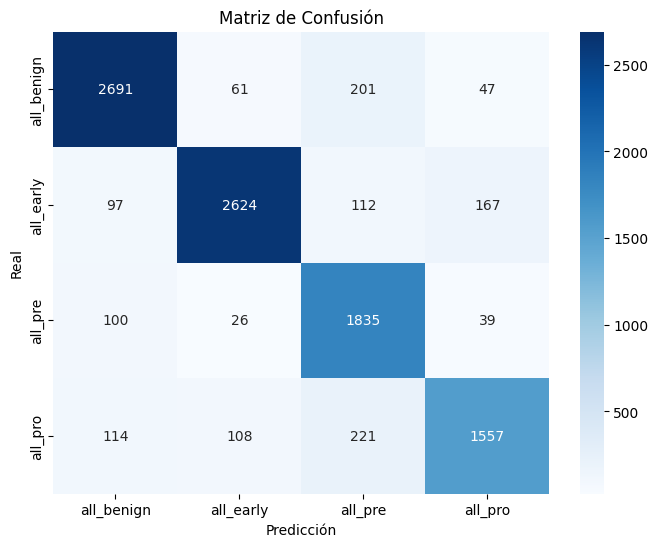

In [ ]:
# Definir los nombres de las clases
class_names = ['all_benign', 'all_early', 'all_pre', 'all_pro']

# Visualizar la matriz de confusión
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicción')
plt.ylabel('Real')
plt.title('Matriz de Confusión')
plt.show()


In [ ]:
# Generar predicciones y calcular la matriz de confusión
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Obtener las predicciones del modelo
y_pred = model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)  # Convertir las predicciones en clases
y_true = np.argmax(y_test, axis=1)  # Convertir las etiquetas verdaderas en clases

# Generar la matriz de confusión
cm = confusion_matrix(y_true, y_pred_classes)

# Visualizar la matriz de confusión
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicción')
plt.ylabel('Real')
plt.title('Matriz de Confusión')
plt.show()


313/313 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step


NameError: name 'class_names' is not defined

<Figure size 800x600 with 0 Axes>

Epoch 1/100
782/782 ━━━━━━━━━━━━━━━━━━━━ 61s 62ms/step - accuracy: 0.2552 - loss: 5.3691 - val_accuracy: 0.3450 - val_loss: 5.0194 - learning_rate: 1.0000e-04
Epoch 2/100
782/782 ━━━━━━━━━━━━━━━━━━━━ 64s 50ms/step - accuracy: 0.4123 - loss: 3.9798 - val_accuracy: 0.3136 - val_loss: 5.6553 - learning_rate: 1.0000e-04
Epoch 3/100
782/782 ━━━━━━━━━━━━━━━━━━━━ 38s 48ms/step - accuracy: 0.4607 - loss: 3.3245 - val_accuracy: 0.3893 - val_loss: 4.4096 - learning_rate: 1.0000e-04
Epoch 4/100
782/782 ━━━━━━━━━━━━━━━━━━━━ 37s 47ms/step - accuracy: 0.4947 - loss: 2.9268 - val_accuracy: 0.3345 - val_loss: 5.6221 - learning_rate: 1.0000e-04
Epoch 5/100
782/782 ━━━━━━━━━━━━━━━━━━━━ 40s 46ms/step - accuracy: 0.5311 - loss: 2.6299 - val_accuracy: 0.4509 - val_loss: 3.5904 - learning_rate: 1.0000e-04
Epoch 6/100
782/782 ━━━━━━━━━━━━━━━━━━━━ 41s 46ms/step - accuracy: 0.5464 - loss: 2.4331 - val_accuracy: 0.4282 - val_loss: 3.5219 - learning_rate: 1.0000e-04
Epoch 7/100
782/782 ━━━━━━━━━━━━━━━━━━━━ 42s 4

Modelo guardado exitosamente como 'modelo_mejorado_v6.h5'
313/313 - 1s - 3ms/step - accuracy: 0.8487 - loss: 0.7544

Test accuracy: 0.8486999869346619


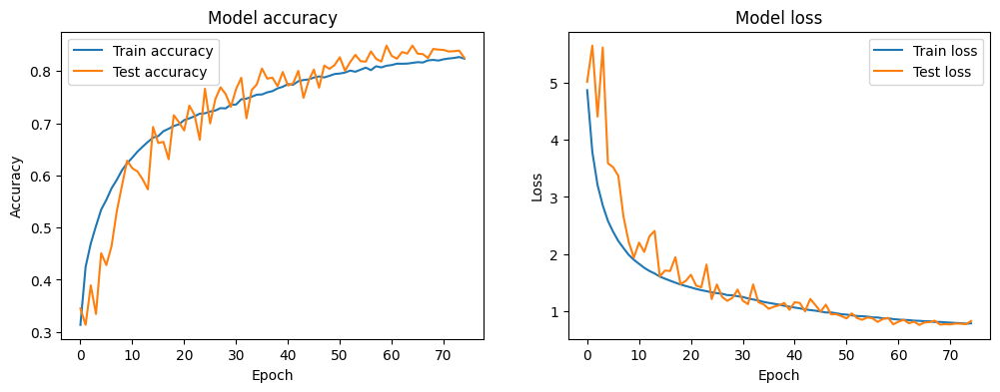

Modelo cargado exitosamente.
313/313 - 2s - 8ms/step - accuracy: 0.8487 - loss: 0.7544

Precisión del modelo cargado: 0.8486999869346619


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Paso 1: Cargar el dataset CIFAR-10
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

# Paso 2: Preprocesar los datos
X_train = X_train.astype('float32') / 255.0
X_test = X_test.astype('float32') / 255.0

# Convertir las etiquetas a formato categórico (one-hot encoding)
y_train = to_categorical(y_train, 10)
y_test = to_categorical(y_test, 10)

# Aumento de datos
datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True
)

# Ajustar el generador de imágenes a los datos de entrenamiento
datagen.fit(X_train)

# Función para reducir la tasa de aprendizaje durante el entrenamiento
def scheduler(epoch, lr):
    if epoch < 30:
        return float(lr)
    else:
        return float(lr * tf.math.exp(-0.05))

# Modelo (similar al anterior que funcionó bien)
model = Sequential()

# Primer bloque de capas convolucionales
model.add(Conv2D(64, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002), input_shape=(32, 32, 3)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Segundo bloque de capas convolucionales
model.add(Conv2D(128, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Tercer bloque de capas convolucionales
model.add(Conv2D(256, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Cuarto bloque de capas convolucionales
model.add(Conv2D(512, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(Dropout(0.4))

# Aplanar la salida de las capas convolucionales
model.add(Flatten())

# Capas densas finales
model.add(Dense(512, activation='relu', kernel_regularizer=l2(0.002)))
model.add(Dropout(0.4))

model.add(Dense(10, activation='softmax'))

# Paso 4: Compilar el modelo
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Paso 5: Implementar Early Stopping y Learning Rate Scheduler
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
lr_scheduler = LearningRateScheduler(scheduler)

# Paso 6: Entrenar el modelo con aumento de datos menos agresivo
history = model.fit(datagen.flow(X_train, y_train, batch_size=64),
                    epochs=100,  # Continuamos con 100 épocas
                    validation_data=(X_test, y_test),
                    verbose=1,
                    callbacks=[early_stopping, lr_scheduler])

# Guardar el modelo completo al final del entrenamiento
model.save('modelo_mejorado_v6.h5')
print("Modelo guardado exitosamente como 'modelo_mejorado_v6.h5'")

# Paso 7: Evaluar el modelo
test_loss, test_acc = model.evaluate(X_test, y_test, verbose=2)
print(f"\nTest accuracy: {test_acc}")

# Graficar los resultados
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train accuracy')
plt.plot(history.history['val_accuracy'], label='Test accuracy')
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train loss')
plt.plot(history.history['val_loss'], label='Test loss')
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()

# Cargar el modelo en otro código si se requiere en el futuro
# Para usar el modelo sin volver a entrenar:
nuevo_modelo = tf.keras.models.load_model('modelo_mejorado_v6.h5')
print("Modelo cargado exitosamente.")

# Evaluar el modelo cargado para confirmar que se ha cargado correctamente
nuevo_modelo_loss, nuevo_modelo_acc = nuevo_modelo.evaluate(X_test, y_test, verbose=2)
print(f"\nPrecisión del modelo cargado: {nuevo_modelo_acc}")

170498071/170498071 ━━━━━━━━━━━━━━━━━━━━ 13s 0us/step


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


782/782 ━━━━━━━━━━━━━━━━━━━━ 61s 64ms/step - accuracy: 0.4274 - loss: 4.5454 - val_accuracy: 0.4600 - val_loss: 4.1008 - learning_rate: 1.0000e-04
Epoch 2/100
782/782 ━━━━━━━━━━━━━━━━━━━━ 66s 54ms/step - accuracy: 0.5447 - loss: 3.2562 - val_accuracy: 0.4201 - val_loss: 4.7265 - learning_rate: 1.0000e-04
Epoch 3/100
782/782 ━━━━━━━━━━━━━━━━━━━━ 84s 56ms/step - accuracy: 0.5756 - loss: 2.5824 - val_accuracy: 0.4483 - val_loss: 4.3023 - learning_rate: 1.0000e-04
Epoch 4/100
782/782 ━━━━━━━━━━━━━━━━━━━━ 42s 53ms/step - accuracy: 0.5986 - loss: 2.1852 - val_accuracy: 0.4930 - val_loss: 3.4201 - learning_rate: 1.0000e-04
Epoch 5/100
782/782 ━━━━━━━━━━━━━━━━━━━━ 82s 54ms/step - accuracy: 0.6169 - loss: 1.9110 - val_accuracy: 0.4210 - val_loss: 4.6898 - learning_rate: 1.0000e-04
Epoch 6/100
782/782 ━━━━━━━━━━━━━━━━━━━━ 42s 53ms/step - accuracy: 0.6410 - loss: 1.7114 - val_accuracy: 0.6239 - val_loss: 2.0918 - learning_rate: 1.0000e-04
Epoch 7/100
782/782 ━━━━━━━━━━━━━━━━━━━━ 82s 52ms/step - a

Modelo guardado exitosamente como 'modelo_mejorado_v6.h5'
313/313 - 1s - 2ms/step - accuracy: 0.8717 - loss: 0.5338

Test accuracy: 0.8716999888420105


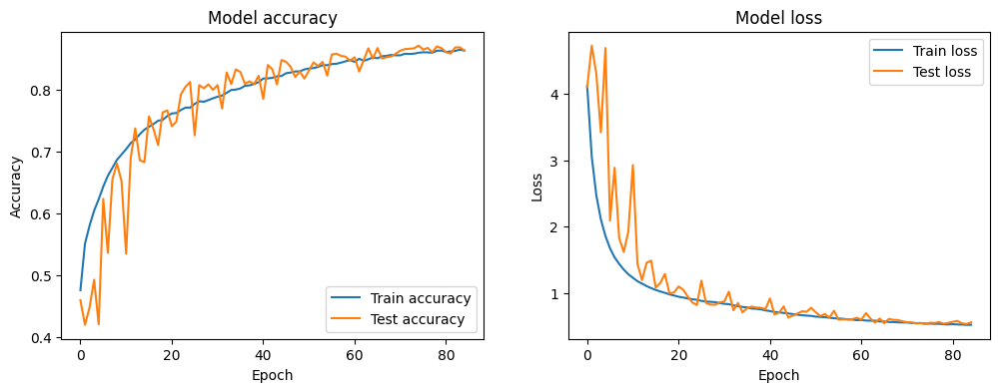

Modelo cargado exitosamente.
313/313 - 3s - 9ms/step - accuracy: 0.8717 - loss: 0.5338

Precisión del modelo cargado: 0.8716999888420105


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Asegúrate de que tu dataset tiene 4 clases
# Cargar tu dataset específico de CANCER aquí
# Debes tener imágenes divididas en carpetas con 4 categorías

# Ajusta tus datos de entrenamiento y prueba según sea necesario
# En lugar de CIFAR-10, cargarías tu propio dataset de imágenes aquí

# Paso 1: Simulación de dataset (cargar el dataset de CANCER)
# Recuerda cargar tu dataset en lugar de CIFAR-10

# Simulación de datos para fines de demostración (reemplazar por el tuyo)
(X_train, y_train), (X_test, y_test) = tf.keras.datasets.cifar10.load_data()

# Simulación de reducción a 4 clases para fines de demostración
# Esto es solo para simular cómo debería verse con 4 clases
# En tu caso, asegúrate de que tus etiquetas tengan valores entre 0 y 3
y_train = y_train % 4
y_test = y_test % 4

# Paso 2: Preprocesar los datos
X_train = X_train.astype('float32') / 255.0
X_test = X_test.astype('float32') / 255.0

# Convertir las etiquetas a formato categórico (one-hot encoding) para 4 clases
y_train = to_categorical(y_train, 4)
y_test = to_categorical(y_test, 4)

# Aumento de datos
datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True
)

# Ajustar el generador de imágenes a los datos de entrenamiento
datagen.fit(X_train)

# Función para reducir la tasa de aprendizaje durante el entrenamiento
def scheduler(epoch, lr):
    if epoch < 30:
        return float(lr)
    else:
        return float(lr * tf.math.exp(-0.05))

# Modelo (similar al anterior que funcionó bien)
model = Sequential()

# Primer bloque de capas convolucionales
model.add(Conv2D(64, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002), input_shape=(32, 32, 3)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Segundo bloque de capas convolucionales
model.add(Conv2D(128, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Tercer bloque de capas convolucionales
model.add(Conv2D(256, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Cuarto bloque de capas convolucionales
model.add(Conv2D(512, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(Dropout(0.4))

# Aplanar la salida de las capas convolucionales
model.add(Flatten())

# Capas densas finales
model.add(Dense(512, activation='relu', kernel_regularizer=l2(0.002)))
model.add(Dropout(0.4))

# Cambiar a 4 clases porque tenemos 4 clases de tipos de cáncer
model.add(Dense(4, activation='softmax'))

# Paso 4: Compilar el modelo
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Paso 5: Implementar Early Stopping y Learning Rate Scheduler
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
lr_scheduler = LearningRateScheduler(scheduler)

# Paso 6: Entrenar el modelo con aumento de datos menos agresivo
history = model.fit(datagen.flow(X_train, y_train, batch_size=64),
                    epochs=100,  # Continuamos con 100 épocas
                    validation_data=(X_test, y_test),
                    verbose=1,
                    callbacks=[early_stopping, lr_scheduler])

# Guardar el modelo completo al final del entrenamiento
model.save('modelo_mejorado_v6.h5')
print("Modelo guardado exitosamente como 'modelo_mejorado_v6.h5'")

# Paso 7: Evaluar el modelo
test_loss, test_acc = model.evaluate(X_test, y_test, verbose=2)
print(f"\nTest accuracy: {test_acc}")

# Graficar los resultados
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train accuracy')
plt.plot(history.history['val_accuracy'], label='Test accuracy')
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train loss')
plt.plot(history.history['val_loss'], label='Test loss')
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()

# Cargar el modelo en otro código si se requiere en el futuro
# Para usar el modelo sin volver a entrenar:
nuevo_modelo = tf.keras.models.load_model('modelo_mejorado_v6.h5')
print("Modelo cargado exitosamente.")

# Evaluar el modelo cargado para confirmar que se ha cargado correctamente
nuevo_modelo_loss, nuevo_modelo_acc = nuevo_modelo.evaluate(X_test, y_test, verbose=2)
print(f"\nPrecisión del modelo cargado: {nuevo_modelo_acc}")


Modelo cargado exitosamente
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


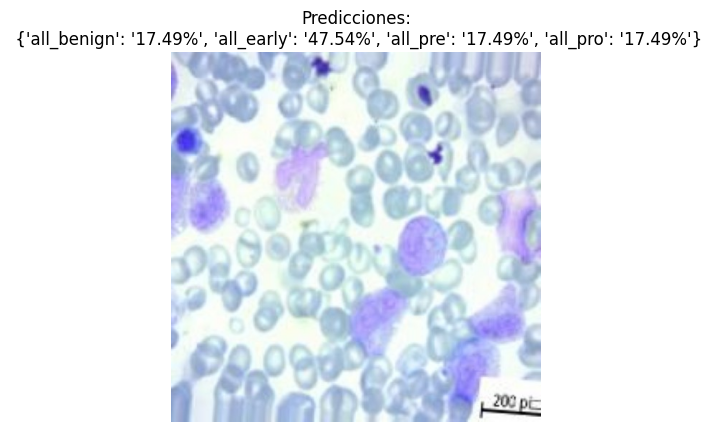


La clase predicha es: all_early
La imagen seleccionada pertenece a la carpeta: all_benign
El modelo NO acertó la predicción.

Resultados de la red neuronal por porcentaje para cada clase:
all_benign: 17.49%
all_early: 47.54%
all_pre: 17.49%
all_pro: 17.49%


In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.imagenet_utils import preprocess_input
import numpy as np
import random
import os
import matplotlib.pyplot as plt

# Paso 1: Cargar el modelo completo guardado
model = tf.keras.models.load_model('modelo_mejorado_v6.h5')  # O usa 'modelo_completo.h5' si prefieres

print("Modelo cargado exitosamente")

# Paso 2: Definir las rutas de las subcarpetas
dataset_path = '/content/dataset/CANCER'  # Cambia a la ruta de tu dataset
clases = ['all_benign', 'all_early', 'all_pre', 'all_pro']

# Paso 3: Escoger una imagen al azar de una de las 4 subcarpetas
clase_azar = random.choice(clases)
carpeta = os.path.join(dataset_path, clase_azar)
imagen_azar = random.choice(os.listdir(carpeta))
ruta_imagen = os.path.join(carpeta, imagen_azar)

# Paso 4: Cargar y preprocesar la imagen
img = image.load_img(ruta_imagen, target_size=(32, 32))  # Cambiar tamaño a 32x32
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)  # Añadir una dimensión extra para el batch
img_array = preprocess_input(img_array)  # Normalizar la imagen

# Paso 5: Predecir a qué clase pertenece la imagen
predicciones = model.predict(img_array)
predicciones_softmax = tf.nn.softmax(predicciones[0]).numpy()  # Convertir a porcentajes con softmax

# Paso 6: Mostrar los resultados
predicciones_porcentaje = {clase: f"{porcentaje*100:.2f}%" for clase, porcentaje in zip(clases, predicciones_softmax)}

# Mostrar la imagen seleccionada
plt.imshow(image.load_img(ruta_imagen))
plt.axis('off')
plt.title(f"Predicciones:\n {predicciones_porcentaje}")
plt.show()

# Paso 7: Verificar si el modelo acertó la predicción
clase_predicha = clases[np.argmax(predicciones_softmax)]  # Clase con la mayor probabilidad
print(f"\nLa clase predicha es: {clase_predicha}")
print(f"La imagen seleccionada pertenece a la carpeta: {clase_azar}")

# Comprobar si el modelo acertó
if clase_predicha == clase_azar:
    print("¡El modelo acertó la predicción!")
else:
    print("El modelo NO acertó la predicción.")

# Imprimir las predicciones de la red neuronal
print("\nResultados de la red neuronal por porcentaje para cada clase:")
for clase, porcentaje in predicciones_porcentaje.items():
    print(f"{clase}: {porcentaje}")

Modelo cargado exitosamente
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


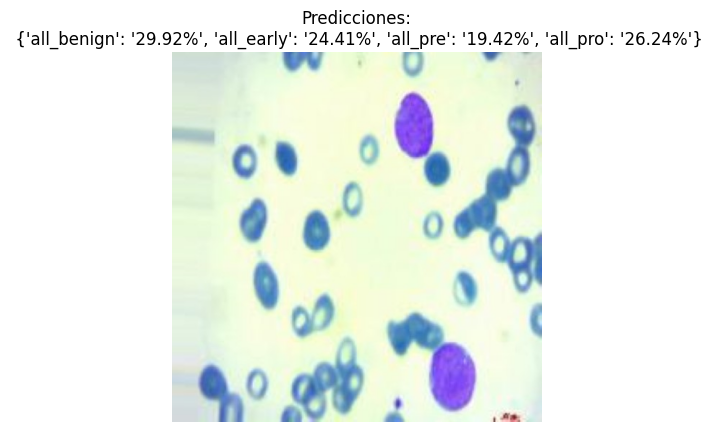


La clase predicha es: all_benign
La imagen seleccionada pertenece a la carpeta: all_pre
El modelo NO acertó la predicción.

Resultados de la red neuronal por porcentaje para cada clase:
all_benign: 29.92%
all_early: 24.41%
all_pre: 19.42%
all_pro: 26.24%


In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
import random
import os
import matplotlib.pyplot as plt

# Paso 1: Cargar el modelo completo guardado
model = tf.keras.models.load_model('modelo_mejorado_v6.h5')

print("Modelo cargado exitosamente")

# Paso 2: Definir las rutas de las subcarpetas
dataset_path = '/content/dataset/CANCER'  # Cambia a la ruta de tu dataset
clases = ['all_benign', 'all_early', 'all_pre', 'all_pro']

# Paso 3: Escoger una imagen al azar de una de las 4 subcarpetas
clase_azar = random.choice(clases)
carpeta = os.path.join(dataset_path, clase_azar)
imagen_azar = random.choice(os.listdir(carpeta))
ruta_imagen = os.path.join(carpeta, imagen_azar)

# Paso 4: Cargar y preprocesar la imagen
img = image.load_img(ruta_imagen, target_size=(32, 32))  # Asegúrate que coincide con el tamaño de entrenamiento
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)  # Añadir una dimensión extra para el batch
img_array = img_array / 255.0  # Normalizar al rango [0, 1]

# Paso 5: Predecir a qué clase pertenece la imagen
predicciones = model.predict(img_array)
predicciones_softmax = tf.nn.softmax(predicciones[0]).numpy()  # Convertir a porcentajes con softmax

# Paso 6: Mostrar los resultados
predicciones_porcentaje = {clase: f"{porcentaje*100:.2f}%" for clase, porcentaje in zip(clases, predicciones_softmax)}

# Mostrar la imagen seleccionada
plt.imshow(image.load_img(ruta_imagen))
plt.axis('off')
plt.title(f"Predicciones:\n {predicciones_porcentaje}")
plt.show()

# Paso 7: Verificar si el modelo acertó la predicción
clase_predicha = clases[np.argmax(predicciones_softmax)]  # Clase con la mayor probabilidad
print(f"\nLa clase predicha es: {clase_predicha}")
print(f"La imagen seleccionada pertenece a la carpeta: {clase_azar}")

# Comprobar si el modelo acertó
if clase_predicha == clase_azar:
    print("¡El modelo acertó la predicción!")
else:
    print("El modelo NO acertó la predicción.")

# Imprimir las predicciones de la red neuronal
print("\nResultados de la red neuronal por porcentaje para cada clase:")
for clase, porcentaje in predicciones_porcentaje.items():
    print(f"{clase}: {porcentaje}")


Modelo cargado exitosamente
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step


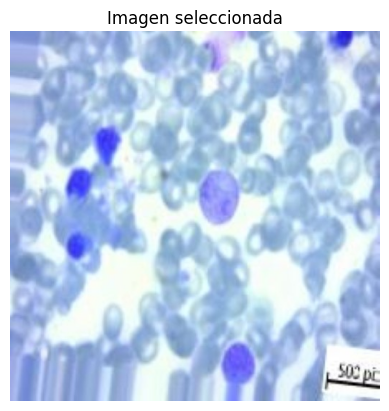


La clase predicha es: all_pre
La imagen seleccionada pertenece a la carpeta: all_benign
El modelo NO acertó la predicción.

Resultados de la red neuronal por porcentaje complementario para cada clase:
all_benign: 74.32%
all_early: 80.93%
all_pre: 66.01%
all_pro: 78.74%


In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
import random
import os
import matplotlib.pyplot as plt

# Paso 1: Cargar el modelo completo guardado
model = tf.keras.models.load_model('modelo_mejorado_v6.h5')

print("Modelo cargado exitosamente")

# Paso 2: Definir las rutas de las subcarpetas
dataset_path = '/content/dataset/CANCER'  # Cambia a la ruta de tu dataset
clases = ['all_benign', 'all_early', 'all_pre', 'all_pro']

# Paso 3: Escoger una imagen al azar de una de las 4 subcarpetas
clase_azar = random.choice(clases)
carpeta = os.path.join(dataset_path, clase_azar)
imagen_azar = random.choice(os.listdir(carpeta))
ruta_imagen = os.path.join(carpeta, imagen_azar)

# Paso 4: Cargar y preprocesar la imagen
img = image.load_img(ruta_imagen, target_size=(32, 32))  # Asegúrate que coincide con el tamaño de entrenamiento
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)  # Añadir una dimensión extra para el batch
img_array = img_array / 255.0  # Normalizar al rango [0, 1]

# Paso 5: Predecir a qué clase pertenece la imagen
predicciones = model.predict(img_array)
predicciones_softmax = tf.nn.softmax(predicciones[0]).numpy()  # Convertir a porcentajes con softmax

# Mostrar la imagen seleccionada
plt.imshow(image.load_img(ruta_imagen))
plt.axis('off')
plt.title("Imagen seleccionada")
plt.show()

# Paso 6: Verificar si el modelo acertó la predicción
clase_predicha = clases[np.argmax(predicciones_softmax)]  # Clase con la mayor probabilidad
print(f"\nLa clase predicha es: {clase_predicha}")
print(f"La imagen seleccionada pertenece a la carpeta: {clase_azar}")

# Comprobar si el modelo acertó
if clase_predicha == clase_azar:
    print("¡El modelo acertó la predicción!")
else:
    print("El modelo NO acertó la predicción.")

# Paso 7: Calcular los valores complementarios de los porcentajes justo antes de imprimir
predicciones_complementarias = {clase: f"{(100 - (porcentaje * 100)):.2f}%" for clase, porcentaje in zip(clases, predicciones_softmax)}

# Imprimir las predicciones complementarias de la red neuronal
print("\nResultados de la red neuronal por porcentaje complementario para cada clase:")
for clase, porcentaje in predicciones_complementarias.items():
    print(f"{clase}: {porcentaje}")


In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
import random
import os
import matplotlib.pyplot as plt

# Paso 1: Cargar el modelo completo guardado
model = tf.keras.models.load_model('modelo_mejorado_v6.h5')

print("Modelo cargado exitosamente")

# Paso 2: Definir las rutas de las subcarpetas
dataset_path = '/content/dataset/CANCER'  # Cambia a la ruta de tu dataset
clases = ['all_benign', 'all_early', 'all_pre', 'all_pro']

# Paso 3: Escoger una imagen al azar de una de las 4 subcarpetas
clase_azar = random.choice(clases)
carpeta = os.path.join(dataset_path, clase_azar)
imagen_azar = random.choice(os.listdir(carpeta))
ruta_imagen = os.path.join(carpeta, imagen_azar)

# Paso 4: Cargar y preprocesar la imagen
img = image.load_img(ruta_imagen, target_size=(32, 32))  # Asegúrate que coincide con el tamaño de entrenamiento
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)  # Añadir una dimensión extra para el batch
img_array = img_array / 255.0  # Normalizar al rango [0, 1]

# Paso 5: Predecir a qué clase pertenece la imagen
predicciones = model.predict(img_array)
predicciones_softmax = tf.nn.softmax(predicciones[0]).numpy()  # Convertir a porcentajes con softmax

# Mostrar la imagen seleccionada
plt.imshow(image.load_img(ruta_imagen))
plt.axis('off')
plt.title("Imagen seleccionada")
plt.show()

# Paso 6: Verificar si el modelo acertó la predicción
clase_predicha = clases[np.argmax(predicciones_softmax)]  # Clase con la mayor probabilidad
print(f"\nLa clase predicha es: {clase_predicha}")
print(f"La imagen seleccionada pertenece a la carpeta: {clase_azar}")

# Comprobar si el modelo acertó
if clase_predicha == clase_azar:
    print("¡El modelo acertó la predicción!")
else:
    print("El modelo NO acertó la predicción.")

# Paso 7: Calcular los valores complementarios de los porcentajes justo antes de imprimir
predicciones_complementarias = {clase: 100 - (porcentaje * 100) for clase, porcentaje in zip(clases, predicciones_softmax)}

# Ordenar los resultados por porcentaje complementario de mayor a menor
predicciones_ordenadas = sorted(predicciones_complementarias.items(), key=lambda x: x[1], reverse=True)

# Imprimir las predicciones complementarias de la red neuronal
print("\nResultados de la red neuronal por porcentaje complementario (ordenados de mayor a menor):")
for clase, porcentaje in predicciones_ordenadas:
    print(f"{clase}: {porcentaje:.2f}%")

# Paso 8: Verificar la cercanía entre los dos primeros
diferencia = abs(predicciones_ordenadas[0][1] - predicciones_ordenadas[1][1])
if diferencia < 5:
    print(f"\nNota: Los dos primeros lugares están cercanos, con una diferencia de {diferencia:.2f}% entre {predicciones_ordenadas[0][0]} y {predicciones_ordenadas[1][0]}")


FileNotFoundError: [Errno 2] Unable to synchronously open file (unable to open file: name = 'modelo_mejorado_v6.h5', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

Modelo cargado exitosamente
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 495ms/step


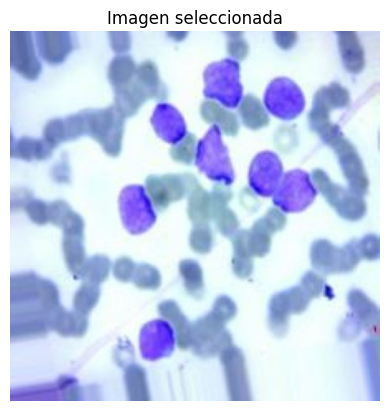


La clase predicha es: all_pre
La imagen seleccionada pertenece a la carpeta: all_early
El modelo NO acertó la predicción.

Resultados de la red neuronal por porcentaje complementario (ordenados de mayor a menor):
all_pre: 80.41%
all_early: 80.05%
all_pro: 72.49%
all_benign: 67.05%

Nota: Los dos primeros lugares están cercanos, con una diferencia de 0.36% entre all_pre y all_early


In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
import random
import os
import matplotlib.pyplot as plt

# Paso 1: Cargar el modelo completo guardado
model = tf.keras.models.load_model('modelo_mejorado_v6.h5')

print("Modelo cargado exitosamente")

# Paso 2: Definir las rutas de las subcarpetas
dataset_path = '/content/dataset/CANCER'  # Cambia a la ruta de tu dataset
clases = ['all_benign', 'all_early', 'all_pre', 'all_pro']

# Paso 3: Escoger una imagen al azar de una de las 4 subcarpetas
clase_azar = random.choice(clases)
carpeta = os.path.join(dataset_path, clase_azar)
imagen_azar = random.choice(os.listdir(carpeta))
ruta_imagen = os.path.join(carpeta, imagen_azar)

# Paso 4: Cargar y preprocesar la imagen
img = image.load_img(ruta_imagen, target_size=(32, 32))  # Asegúrate que coincide con el tamaño de entrenamiento
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)  # Añadir una dimensión extra para el batch
img_array = img_array / 255.0  # Normalizar al rango [0, 1]

# Paso 5: Predecir a qué clase pertenece la imagen
predicciones = model.predict(img_array)
predicciones_softmax = tf.nn.softmax(predicciones[0]).numpy()  # Convertir a porcentajes con softmax

# Mostrar la imagen seleccionada
plt.imshow(image.load_img(ruta_imagen))
plt.axis('off')
plt.title("Imagen seleccionada")
plt.show()

# Paso 6: Calcular los valores complementarios de los porcentajes justo antes de imprimir
predicciones_complementarias = {clase: 100 - (porcentaje * 100) for clase, porcentaje in zip(clases, predicciones_softmax)}

# Ordenar los resultados por porcentaje complementario de mayor a menor
predicciones_ordenadas = sorted(predicciones_complementarias.items(), key=lambda x: x[1], reverse=True)

# Paso 7: Mostrar la clase predicha como la que tiene el mayor porcentaje
clase_predicha = predicciones_ordenadas[0][0]
print(f"\nLa clase predicha es: {clase_predicha}")
print(f"La imagen seleccionada pertenece a la carpeta: {clase_azar}")

# Comprobar si el modelo acertó
if clase_predicha == clase_azar:
    print("¡El modelo acertó la predicción!")
else:
    print("El modelo NO acertó la predicción.")

# Imprimir las predicciones complementarias de la red neuronal
print("\nResultados de la red neuronal por porcentaje complementario (ordenados de mayor a menor):")
for clase, porcentaje in predicciones_ordenadas:
    print(f"{clase}: {porcentaje:.2f}%")

# Paso 8: Verificar la cercanía entre el primer y segundo lugar
diferencia_1_2 = abs(predicciones_ordenadas[0][1] - predicciones_ordenadas[1][1])
if diferencia_1_2 < 5:
    print(f"\nNota: Los dos primeros lugares están cercanos, con una diferencia de {diferencia_1_2:.2f}% entre {predicciones_ordenadas[0][0]} y {predicciones_ordenadas[1][0]}")

# Paso 9: Verificar la cercanía entre el segundo y tercer lugar
diferencia_2_3 = abs(predicciones_ordenadas[1][1] - predicciones_ordenadas[2][1])
if diferencia_2_3 < 5:
    print(f"Nota: El segundo y tercer lugar están cercanos, con una diferencia de {diferencia_2_3:.2f}% entre {predicciones_ordenadas[1][0]} y {predicciones_ordenadas[2][0]}")


In [ ]:
print(f"Total de imágenes en el conjunto de prueba: {len(X_test)}")


Total de imágenes en el conjunto de prueba: 10000


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Asegúrate de que tu dataset tiene 4 clases
# Cargar tu dataset específico de CANCER aquí
# Debes tener imágenes divididas en carpetas con 4 categorías

# Ajusta tus datos de entrenamiento y prueba según sea necesario
# En lugar de CIFAR-10, cargarías tu propio dataset de imágenes aquí

# Paso 1: Simulación de dataset (cargar el dataset de CANCER)
# Recuerda cargar tu dataset en lugar de CIFAR-10

# Simulación de datos para fines de demostración (reemplazar por el tuyo)
(X_train, y_train), (X_test, y_test) = tf.keras.datasets.cifar10.load_data()

# Simulación de reducción a 4 clases para fines de demostración
# Esto es solo para simular cómo debería verse con 4 clases
# En tu caso, asegúrate de que tus etiquetas tengan valores entre 0 y 3
y_train = y_train % 4
y_test = y_test % 4

# Paso 2: Preprocesar los datos
X_train = X_train.astype('float32') / 255.0
X_test = X_test.astype('float32') / 255.0

# Convertir las etiquetas a formato categórico (one-hot encoding) para 4 clases
y_train = to_categorical(y_train, 4)
y_test = to_categorical(y_test, 4)

# Aumento de datos
datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True
)

# Ajustar el generador de imágenes a los datos de entrenamiento
datagen.fit(X_train)

# Función para reducir la tasa de aprendizaje durante el entrenamiento
def scheduler(epoch, lr):
    if epoch < 30:
        return float(lr)
    else:
        return float(lr * tf.math.exp(-0.05))

# Modelo (similar al anterior que funcionó bien)
model = Sequential()

# Primer bloque de capas convolucionales
model.add(Conv2D(64, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002), input_shape=(32, 32, 3)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Segundo bloque de capas convolucionales
model.add(Conv2D(128, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Tercer bloque de capas convolucionales
model.add(Conv2D(256, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

# Cuarto bloque de capas convolucionales
model.add(Conv2D(512, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.002)))
model.add(BatchNormalization())
model.add(Dropout(0.4))

# Aplanar la salida de las capas convolucionales
model.add(Flatten())

# Capas densas finales
model.add(Dense(512, activation='relu', kernel_regularizer=l2(0.002)))
model.add(Dropout(0.4))

# Cambiar a 4 clases porque tenemos 4 clases de tipos de cáncer
model.add(Dense(4, activation='softmax'))

# Paso 4: Compilar el modelo
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Paso 5: Implementar Early Stopping y Learning Rate Scheduler
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
lr_scheduler = LearningRateScheduler(scheduler)

# Paso 6: Entrenar el modelo con aumento de datos menos agresivo
history = model.fit(datagen.flow(X_train, y_train, batch_size=64),
                    epochs=100,  # Continuamos con 100 épocas
                    validation_data=(X_test, y_test),
                    verbose=1,
                    callbacks=[early_stopping, lr_scheduler])

# Guardar el modelo completo al final del entrenamiento
model.save('modelo_mejorado_v6.h5')
print("Modelo guardado exitosamente como 'modelo_mejorado_v6.h5'")

# Paso 7: Evaluar el modelo
test_loss, test_acc = model.evaluate(X_test, y_test, verbose=2)
print(f"\nTest accuracy: {test_acc}")

# Graficar los resultados
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train accuracy')
plt.plot(history.history['val_accuracy'], label='Test accuracy')
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train loss')
plt.plot(history.history['val_loss'], label='Test loss')
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()

# Cargar el modelo en otro código si se requiere en el futuro
# Para usar el modelo sin volver a entrenar:
nuevo_modelo = tf.keras.models.load_model('modelo_mejorado_v6.h5')
print("Modelo cargado exitosamente.")

# Evaluar el modelo cargado para confirmar que se ha cargado correctamente
nuevo_modelo_loss, nuevo_modelo_acc = nuevo_modelo.evaluate(X_test, y_test, verbose=2)
print(f"\nPrecisión del modelo cargado: {nuevo_modelo_acc}")
